In [1]:
# import
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import time
import math

import Object
import Car

In [2]:
# read
input_path = './141_cutting_tracks.csv'

# drop paddings
objects_data = pd.read_csv(input_path, names = ['frame', 'id', 'x1', 'y1', 'x2', 'y2', 'type', '-1', '-1.1', '-1.2'])
drop_features = ['-1', '-1.1', '-1.2']
objects_data = objects_data.drop(drop_features, axis = 1)

# drop 
person_data = objects_data[objects_data.type == '1']
print("person data : ")
print(person_data)
car_data = objects_data[objects_data.type == '3']
print('car data : ')
print(car_data)
bus_data = objects_data[objects_data.type == '6']
print('bus data : ')
print(bus_data)
truck_data = objects_data[objects_data.type == '8']
print('truck data : ')
print(truck_data)

# vehicle_objects
objects_data = pd.concat([person_data, car_data, bus_data, truck_data])
print('person and vehicle data')
print(objects_data)

type_mapping = {
            '0' : '__background__', '1' : 'person', '2' : 'bicycle', '3' : 'car', '4' : 'motorcycle', '5' : 'airplane',
            '6' : 'bus', '7' : 'train', '8' : 'truck', '9' : 'boat', '10' : 'traffic light', '11' : 'fire hydrant',
            '12' : 'stop sign', '13' : 'parking meter', '14' : 'bench', '15' : 'bird', '16' : 'cat', '17' : 'dog', '18' : 'horse',
            '19' : 'sheep', '20' : 'cow', '21' : 'elephant', '22' : 'bear', '23' : 'zebra', '24' : 'giraffe', '25' : 'backpack',
            '26' : 'umbrella', '27' : 'handbag', '28' : 'tie', '29' : 'suitcase', '30' : 'frisbee', '31' : 'skis',
            '32' : 'snowboard', '33' : 'sports ball', '34' : 'kite', '35' : 'baseball bat', '36' : 'baseball glove',
            '37' : 'skateboard', '38' : 'surfboard', '39' : 'tennis racket', '40' : 'bottle', '41' : 'wine glass',
            '42' : 'cup', '43' : 'fork', '44' : 'knife', '45' : 'spoon', '46' : 'bowl', '47' : 'banana', '48' : 'apple', '49' : 'sandwich',
            '50' : 'orange', '51' : 'broccoli', '52' : 'carrot', '53' : 'hot dog', '54' : 'pizza', '55' : 'donut', '56' : 'cake',
            '57' : 'chair', '58' : 'couch', '59' : 'potted plant', '60' : 'bed', '61' : 'dining table', '62' : 'toilet', '63' : 'tv',
            '64' : 'laptop', '65' : 'mouse', '66' : 'remote', '67' : 'keyboard', '68' : 'cell phone', '69' : 'microwave',
            '70' : 'oven', '71' : 'toaster', '72' :'sink', '73' : 'refrigerator', '74' : 'book', '75' : 'clock', '76' : 'vase',
            '77' : 'scissors', '78' : 'teddy bear', '79' : 'hair drier', '80' :'toothbrush'
}
objects_data['type'] = objects_data['type'].map(type_mapping)
print(objects_data)

# write objects_data.csv
objects_data.to_csv('./objects_data.csv', header = True, index = False)
                                                
objects_id_set = set(objects_data['id'])
print('obj id set : ')
print(objects_id_set)

objects_id_list = list(objects_id_set)
print('obj id list : ')
print(objects_id_list)

object_counts = len(objects_id_set)
print("object counts : ", object_counts)

C:\Users\OSe\AppData\Roaming\Python\Python37\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning: Columns (0,1,2,3,4,5,6) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


person data : 
      frame   id      x1      y1     x2     y2 type
1         3    1   305.4  395.41  22.16   78.4    1
4         3    4  281.56  387.64  25.64  83.19    1
15        3   16  820.67  303.76  10.69  34.92    1
23        4    1  305.34  395.83  22.05  78.08    1
26        4    4  281.57  387.71   25.6  83.07    1
...     ...  ...     ...     ...    ...    ...  ...
65517  2876  757  565.03  305.17  11.43  30.96    1
65518  2876  760  401.13  330.65  12.14  29.87    1
65520  2876  767  611.98  325.88  11.03  38.23    1
65524  2876  780  551.36  337.16  12.51  30.23    1
65525  2876  783  820.01  304.36   11.7  34.22    1

[13356 rows x 7 columns]
car data : 
      frame   id       x1      y1      x2      y2 type
3         3    3   692.34  428.74  157.52  100.69    3
5         3    5   708.58  361.18  113.66   68.13    3
8         3    8   981.58   295.6   50.51   33.81    3
11        3   11  1066.68   309.1   44.32   35.84    3
12        3   12   690.32  464.03  330.58  197.6

In [3]:
# construct objects
objects = []

# construct test
for i in range(object_counts):
    objects.append(Object.Object())
    print("obj id : ", objects_id_list[i])
    objects[i].set_id(objects_id_list[i])
    
for i in range(len(objects)):
    print('constructed obj id : ', objects[i].get_id())

obj id :  628
obj id :  593
obj id :  12
obj id :  344
obj id :  348
obj id :  530
obj id :  649
obj id :  10
obj id :  722
obj id :  745
obj id :  241
obj id :  186
obj id :  706
obj id :  11
obj id :  666
obj id :  407
obj id :  474
obj id :  308
obj id :  155
obj id :  5
obj id :  755
obj id :  400
obj id :  528
obj id :  333
obj id :  70
obj id :  419
obj id :  184
obj id :  345
obj id :  26
obj id :  494
obj id :  281
obj id :  105
obj id :  551
obj id :  63
obj id :  384
obj id :  482
obj id :  488
obj id :  566
obj id :  625
obj id :  574
obj id :  362
obj id :  700
obj id :  495
obj id :  134
obj id :  236
obj id :  711
obj id :  688
obj id :  732
obj id :  705
obj id :  74
obj id :  769
obj id :  19
obj id :  317
obj id :  696
obj id :  316
obj id :  310
obj id :  506
obj id :  784
obj id :  3
obj id :  374
obj id :  644
obj id :  102
obj id :  648
obj id :  408
obj id :  723
obj id :  710
obj id :  178
obj id :  364
obj id :  669
obj id :  499
obj id :  672
obj id :  409
obj 

In [4]:
# ground_truth의 중심을 object의 위치로 근사
def center_of_rect(x1, y1, x2, y2):
    x = (x1 - x2)/2
    y = (y1 - y2)/2
    #correct_position((x, y))
    return x , y

In [5]:
# init objects
init_start_time = time.time()
# init
for i, row in objects_data.iterrows():
    current_id = objects_data.ix[i]['id']
    current_idx = objects_id_list.index(current_id) # 해당 id를 가지는 obj의 idx
    print('current id ', current_id, ' in current idx ', current_idx)
    current_type = objects_data.ix[i]['type']
    print('current type : ', current_type)
    current_frame = objects_data.ix[i]['frame']
    print('current frame : ', current_frame)
    current_point = center_of_rect(float(objects_data.ix[i]['x1']), float(objects_data.ix[i]['y1']),
                                   float(objects_data.ix[i]['x2']), float(objects_data.ix[i]['y2']))
    print('current point : ', current_point)
    
    objects[current_idx].set_object(current_id, current_type, current_frame, current_point)
    
    print('init : {}/{} done'.format(i, len(objects_data)))
init_finish_time = time.time()

init_time = init_finish_time - init_start_time
print("\ninit_time : ", init_time) # 1m 10s

C:\Users\OSe\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:5: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  """
C:\Users\OSe\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:8: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  
C:\Users\OSe\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:10: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  # Remove the CWD from sys.path while we 

current id  1  in current idx  118
current type :  person
current frame :  3
current point :  (141.61999999999998, 158.505)
init : 1/48956 done
current id  4  in current idx  322
current type :  person
current frame :  3
current point :  (127.96000000000001, 152.225)
init : 4/48956 done
current id  16  in current idx  174
current type :  person
current frame :  3
current point :  (404.98999999999995, 134.42)
init : 15/48956 done
current id  1  in current idx  118
current type :  person
current frame :  4
current point :  (141.64499999999998, 158.875)
init : 23/48956 done
current id  4  in current idx  322
current type :  person
current frame :  4
current point :  (127.985, 152.32)
init : 26/48956 done
current id  16  in current idx  174
current type :  person
current frame :  4
current point :  (404.97499999999997, 134.4)
init : 37/48956 done
current id  1  in current idx  118
current type :  person
current frame :  5
current point :  (141.655, 158.98)
init : 47/48956 done
current id  

current point :  (405.385, 135.245)
init : 853/48956 done
current id  1  in current idx  118
current type :  person
current frame :  38
current point :  (140.51000000000002, 157.345)
init : 863/48956 done
current id  4  in current idx  322
current type :  person
current frame :  38
current point :  (127.68, 151.76999999999998)
init : 866/48956 done
current id  16  in current idx  174
current type :  person
current frame :  38
current point :  (405.41499999999996, 135.27)
init : 876/48956 done
current id  1  in current idx  118
current type :  person
current frame :  39
current point :  (140.58, 157.39999999999998)
init : 886/48956 done
current id  4  in current idx  322
current type :  person
current frame :  39
current point :  (127.66500000000002, 151.70499999999998)
init : 889/48956 done
current id  16  in current idx  174
current type :  person
current frame :  39
current point :  (405.43, 135.27)
init : 899/48956 done
current id  1  in current idx  118
current type :  person
curre

current point :  (144.58499999999998, 180.185)
init : 1607/48956 done
current id  4  in current idx  322
current type :  person
current frame :  72
current point :  (133.49499999999998, 169.89)
init : 1610/48956 done
current id  16  in current idx  174
current type :  person
current frame :  72
current point :  (405.495, 135.41)
init : 1620/48956 done
current id  1  in current idx  118
current type :  person
current frame :  73
current point :  (144.225, 180.22)
init : 1628/48956 done
current id  4  in current idx  322
current type :  person
current frame :  73
current point :  (133.22500000000002, 169.95)
init : 1631/48956 done
current id  16  in current idx  174
current type :  person
current frame :  73
current point :  (405.49, 135.405)
init : 1641/48956 done
current id  47  in current idx  370
current type :  person
current frame :  73
current point :  (-10.3, 182.385)
init : 1649/48956 done
current id  1  in current idx  118
current type :  person
current frame :  74
current poin

current frame :  102
current point :  (126.66499999999999, 151.38)
init : 2292/48956 done
current id  16  in current idx  174
current type :  person
current frame :  102
current point :  (404.75, 135.75)
init : 2301/48956 done
current id  1  in current idx  118
current type :  person
current frame :  103
current point :  (135.85000000000002, 160.35)
init : 2312/48956 done
current id  4  in current idx  322
current type :  person
current frame :  103
current point :  (126.79500000000002, 151.32999999999998)
init : 2315/48956 done
current id  16  in current idx  174
current type :  person
current frame :  103
current point :  (404.725, 135.755)
init : 2324/48956 done
current id  1  in current idx  118
current type :  person
current frame :  104
current point :  (136.01000000000002, 160.345)
init : 2335/48956 done
current id  4  in current idx  322
current type :  person
current frame :  104
current point :  (126.90999999999998, 151.32)
init : 2338/48956 done
current id  16  in current id

current point :  (404.45, 135.88)
init : 3038/48956 done
current id  1  in current idx  118
current type :  person
current frame :  136
current point :  (139.67, 160.2)
init : 3049/48956 done
current id  4  in current idx  322
current type :  person
current frame :  136
current point :  (127.26999999999998, 152.36)
init : 3052/48956 done
current id  16  in current idx  174
current type :  person
current frame :  136
current point :  (404.48, 135.92)
init : 3061/48956 done
current id  1  in current idx  118
current type :  person
current frame :  137
current point :  (139.595, 160.10999999999999)
init : 3070/48956 done
current id  4  in current idx  322
current type :  person
current frame :  137
current point :  (127.29, 152.38)
init : 3073/48956 done
current id  16  in current idx  174
current type :  person
current frame :  137
current point :  (404.5, 135.94)
init : 3082/48956 done
current id  63  in current idx  33
current type :  person
current frame :  137
current point :  (419.4

current id  16  in current idx  174
current type :  person
current frame :  168
current point :  (404.97499999999997, 136.33499999999998)
init : 3718/48956 done
current id  1  in current idx  118
current type :  person
current frame :  169
current point :  (140.825, 156.325)
init : 3725/48956 done
current id  4  in current idx  322
current type :  person
current frame :  169
current point :  (126.78499999999998, 151.3)
init : 3728/48956 done
current id  16  in current idx  174
current type :  person
current frame :  169
current point :  (404.995, 136.32999999999998)
init : 3735/48956 done
current id  1  in current idx  118
current type :  person
current frame :  170
current point :  (140.765, 156.22)
init : 3742/48956 done
current id  4  in current idx  322
current type :  person
current frame :  170
current point :  (126.80000000000001, 151.35500000000002)
init : 3745/48956 done
current id  16  in current idx  174
current type :  person
current frame :  170
current point :  (405.01000

current point :  (145.87, 156.7)
init : 4359/48956 done
current id  4  in current idx  322
current type :  person
current frame :  207
current point :  (126.39, 151.995)
init : 4362/48956 done
current id  16  in current idx  174
current type :  person
current frame :  207
current point :  (405.21000000000004, 136.38)
init : 4369/48956 done
current id  1  in current idx  118
current type :  person
current frame :  208
current point :  (145.93, 156.71)
init : 4376/48956 done
current id  4  in current idx  322
current type :  person
current frame :  208
current point :  (126.405, 152.19)
init : 4379/48956 done
current id  16  in current idx  174
current type :  person
current frame :  208
current point :  (405.195, 136.3)
init : 4386/48956 done
current id  1  in current idx  118
current type :  person
current frame :  209
current point :  (146.08999999999997, 156.995)
init : 4393/48956 done
current id  4  in current idx  322
current type :  person
current frame :  209
current point :  (12

current point :  (126.145, 152.225)
init : 4865/48956 done
current id  16  in current idx  174
current type :  person
current frame :  238
current point :  (405.10499999999996, 136.115)
init : 4872/48956 done
current id  1  in current idx  118
current type :  person
current frame :  239
current point :  (148.46, 159.51500000000001)
init : 4879/48956 done
current id  4  in current idx  322
current type :  person
current frame :  239
current point :  (126.13999999999999, 152.23999999999998)
init : 4881/48956 done
current id  16  in current idx  174
current type :  person
current frame :  239
current point :  (405.09999999999997, 136.09)
init : 4887/48956 done
current id  1  in current idx  118
current type :  person
current frame :  240
current point :  (148.53, 159.36)
init : 4895/48956 done
current id  4  in current idx  322
current type :  person
current frame :  240
current point :  (126.13499999999999, 152.20499999999998)
init : 4897/48956 done
current id  16  in current idx  174
cu

current point :  (126.25999999999999, 152.31)
init : 5377/48956 done
current id  16  in current idx  174
current type :  person
current frame :  269
current point :  (405.23499999999996, 135.57)
init : 5383/48956 done
current id  1  in current idx  118
current type :  person
current frame :  270
current point :  (147.01999999999998, 160.615)
init : 5391/48956 done
current id  4  in current idx  322
current type :  person
current frame :  270
current point :  (126.3, 152.36)
init : 5393/48956 done
current id  16  in current idx  174
current type :  person
current frame :  270
current point :  (405.25, 135.565)
init : 5399/48956 done
current id  1  in current idx  118
current type :  person
current frame :  271
current point :  (147.105, 160.79)
init : 5407/48956 done
current id  4  in current idx  322
current type :  person
current frame :  271
current point :  (126.315, 152.385)
init : 5409/48956 done
current id  16  in current idx  174
current type :  person
current frame :  271
curre

current id  4  in current idx  322
current type :  person
current frame :  301
current point :  (126.28999999999999, 151.72)
init : 5930/48956 done
current id  16  in current idx  174
current type :  person
current frame :  301
current point :  (406.3, 137.05)
init : 5936/48956 done
current id  1  in current idx  118
current type :  person
current frame :  302
current point :  (147.95, 159.32)
init : 5948/48956 done
current id  4  in current idx  322
current type :  person
current frame :  302
current point :  (126.42499999999998, 152.155)
init : 5950/48956 done
current id  16  in current idx  174
current type :  person
current frame :  302
current point :  (406.33, 137.01999999999998)
init : 5957/48956 done
current id  1  in current idx  118
current type :  person
current frame :  303
current point :  (147.86, 158.98499999999999)
init : 5968/48956 done
current id  4  in current idx  322
current type :  person
current frame :  303
current point :  (126.49, 152.42000000000002)
init : 59

current type :  person
current frame :  332
current point :  (147.725, 159.2)
init : 6507/48956 done
current id  4  in current idx  322
current type :  person
current frame :  332
current point :  (126.32500000000002, 152.37)
init : 6509/48956 done
current id  16  in current idx  174
current type :  person
current frame :  332
current point :  (406.40500000000003, 136.01999999999998)
init : 6515/48956 done
current id  1  in current idx  118
current type :  person
current frame :  333
current point :  (147.645, 159.10999999999999)
init : 6527/48956 done
current id  4  in current idx  322
current type :  person
current frame :  333
current point :  (126.27499999999999, 152.285)
init : 6529/48956 done
current id  16  in current idx  174
current type :  person
current frame :  333
current point :  (406.36, 136.04500000000002)
init : 6535/48956 done
current id  1  in current idx  118
current type :  person
current frame :  334
current point :  (147.55499999999998, 158.99)
init : 6547/48956 

current type :  person
current frame :  366
current point :  (126.03, 151.375)
init : 7129/48956 done
current id  16  in current idx  174
current type :  person
current frame :  366
current point :  (406.835, 137.10999999999999)
init : 7135/48956 done
current id  1  in current idx  118
current type :  person
current frame :  367
current point :  (147.58999999999997, 159.26)
init : 7145/48956 done
current id  4  in current idx  322
current type :  person
current frame :  367
current point :  (126.02000000000001, 151.39)
init : 7147/48956 done
current id  16  in current idx  174
current type :  person
current frame :  367
current point :  (406.565, 136.42)
init : 7153/48956 done
current id  1  in current idx  118
current type :  person
current frame :  368
current point :  (147.415, 158.81)
init : 7163/48956 done
current id  4  in current idx  322
current type :  person
current frame :  368
current point :  (126.005, 151.315)
init : 7165/48956 done
current id  16  in current idx  174
cur

current point :  (125.775, 150.815)
init : 7816/48956 done
current id  16  in current idx  174
current type :  person
current frame :  401
current point :  (406.39000000000004, 135.73499999999999)
init : 7822/48956 done
current id  1  in current idx  118
current type :  person
current frame :  402
current point :  (147.65, 159.405)
init : 7835/48956 done
current id  4  in current idx  322
current type :  person
current frame :  402
current point :  (125.785, 150.83)
init : 7837/48956 done
current id  16  in current idx  174
current type :  person
current frame :  402
current point :  (406.34, 135.72)
init : 7843/48956 done
current id  1  in current idx  118
current type :  person
current frame :  403
current point :  (147.675, 159.47)
init : 7855/48956 done
current id  4  in current idx  322
current type :  person
current frame :  403
current point :  (125.785, 150.84)
init : 7857/48956 done
current id  16  in current idx  174
current type :  person
current frame :  403
current point :

current point :  (125.87, 151.485)
init : 8465/48956 done
current id  16  in current idx  174
current type :  person
current frame :  433
current point :  (405.96, 135.65)
init : 8471/48956 done
current id  1  in current idx  118
current type :  person
current frame :  434
current point :  (148.345, 158.485)
init : 8485/48956 done
current id  4  in current idx  322
current type :  person
current frame :  434
current point :  (125.84499999999998, 151.46499999999997)
init : 8487/48956 done
current id  16  in current idx  174
current type :  person
current frame :  434
current point :  (405.96, 135.645)
init : 8493/48956 done
current id  1  in current idx  118
current type :  person
current frame :  435
current point :  (148.34, 158.41)
init : 8506/48956 done
current id  4  in current idx  322
current type :  person
current frame :  435
current point :  (125.82, 151.45499999999998)
init : 8508/48956 done
current id  16  in current idx  174
current type :  person
current frame :  435
curre

current id  16  in current idx  174
current type :  person
current frame :  465
current point :  (407.35, 136.63)
init : 9126/48956 done
current id  1  in current idx  118
current type :  person
current frame :  466
current point :  (144.695, 157.865)
init : 9140/48956 done
current id  4  in current idx  322
current type :  person
current frame :  466
current point :  (126.085, 151.025)
init : 9142/48956 done
current id  16  in current idx  174
current type :  person
current frame :  466
current point :  (407.385, 136.63)
init : 9148/48956 done
current id  1  in current idx  118
current type :  person
current frame :  467
current point :  (144.8, 157.615)
init : 9162/48956 done
current id  4  in current idx  322
current type :  person
current frame :  467
current point :  (126.16000000000001, 150.87)
init : 9164/48956 done
current id  16  in current idx  174
current type :  person
current frame :  467
current point :  (407.41, 136.61499999999998)
init : 9170/48956 done
current id  1  i

current id  16  in current idx  174
current type :  person
current frame :  496
current point :  (407.32, 136.71)
init : 9816/48956 done
current id  1  in current idx  118
current type :  person
current frame :  497
current point :  (146.02, 158.755)
init : 9833/48956 done
current id  4  in current idx  322
current type :  person
current frame :  497
current point :  (128.085, 151.25)
init : 9835/48956 done
current id  16  in current idx  174
current type :  person
current frame :  497
current point :  (407.33, 136.72)
init : 9841/48956 done
current id  1  in current idx  118
current type :  person
current frame :  498
current point :  (146.14499999999998, 158.805)
init : 9858/48956 done
current id  4  in current idx  322
current type :  person
current frame :  498
current point :  (128.125, 151.245)
init : 9860/48956 done
current id  16  in current idx  174
current type :  person
current frame :  498
current point :  (407.335, 136.71)
init : 9866/48956 done
current id  1  in current i

current point :  (127.13499999999999, 151.625)
init : 10594/48956 done
current id  16  in current idx  174
current type :  person
current frame :  529
current point :  (407.4, 136.7)
init : 10600/48956 done
current id  1  in current idx  118
current type :  person
current frame :  530
current point :  (146.885, 157.57)
init : 10616/48956 done
current id  4  in current idx  322
current type :  person
current frame :  530
current point :  (127.08, 151.705)
init : 10618/48956 done
current id  16  in current idx  174
current type :  person
current frame :  530
current point :  (407.395, 136.695)
init : 10624/48956 done
current id  1  in current idx  118
current type :  person
current frame :  531
current point :  (146.89499999999998, 157.39499999999998)
init : 10640/48956 done
current id  4  in current idx  322
current type :  person
current frame :  531
current point :  (127.02499999999999, 151.735)
init : 10642/48956 done
current id  16  in current idx  174
current type :  person
current

current frame :  565
current point :  (146.29, 156.56)
init : 11468/48956 done
current id  4  in current idx  322
current type :  person
current frame :  565
current point :  (126.32, 150.865)
init : 11470/48956 done
current id  16  in current idx  174
current type :  person
current frame :  565
current point :  (404.465, 135.175)
init : 11476/48956 done
current id  1  in current idx  118
current type :  person
current frame :  566
current point :  (146.255, 156.5)
init : 11493/48956 done
current id  4  in current idx  322
current type :  person
current frame :  566
current point :  (126.29499999999999, 150.815)
init : 11495/48956 done
current id  16  in current idx  174
current type :  person
current frame :  566
current point :  (404.46, 135.255)
init : 11501/48956 done
current id  1  in current idx  118
current type :  person
current frame :  567
current point :  (146.225, 156.48000000000002)
init : 11517/48956 done
current id  4  in current idx  322
current type :  person
current f

current frame :  595
current point :  (126.66499999999999, 152.01)
init : 12132/48956 done
current id  16  in current idx  174
current type :  person
current frame :  595
current point :  (405.26, 135.28)
init : 12138/48956 done
current id  1  in current idx  118
current type :  person
current frame :  596
current point :  (145.575, 157.92)
init : 12151/48956 done
current id  4  in current idx  322
current type :  person
current frame :  596
current point :  (126.68999999999998, 151.985)
init : 12153/48956 done
current id  16  in current idx  174
current type :  person
current frame :  596
current point :  (405.21999999999997, 135.10500000000002)
init : 12159/48956 done
current id  1  in current idx  118
current type :  person
current frame :  597
current point :  (145.61, 157.94)
init : 12173/48956 done
current id  4  in current idx  322
current type :  person
current frame :  597
current point :  (126.72500000000001, 151.98000000000002)
init : 12175/48956 done
current id  16  in curr

current id  181  in current idx  338
current type :  person
current frame :  629
current point :  (135.79500000000002, 163.745)
init : 12851/48956 done
current id  1  in current idx  118
current type :  person
current frame :  630
current point :  (146.36, 158.34)
init : 12852/48956 done
current id  4  in current idx  322
current type :  person
current frame :  630
current point :  (122.31500000000001, 158.11499999999998)
init : 12854/48956 done
current id  16  in current idx  174
current type :  person
current frame :  630
current point :  (405.175, 134.38500000000002)
init : 12860/48956 done
current id  181  in current idx  338
current type :  person
current frame :  630
current point :  (135.885, 163.73000000000002)
init : 12872/48956 done
current id  1  in current idx  118
current type :  person
current frame :  631
current point :  (146.36499999999998, 158.82)
init : 12873/48956 done
current id  4  in current idx  322
current type :  person
current frame :  631
current point :  (1

current point :  (562.985, 138.3)
init : 13294/48956 done
current id  1  in current idx  118
current type :  person
current frame :  651
current point :  (146.97, 160.675)
init : 13295/48956 done
current id  4  in current idx  322
current type :  person
current frame :  651
current point :  (122.21500000000002, 152.345)
init : 13297/48956 done
current id  16  in current idx  174
current type :  person
current frame :  651
current point :  (404.585, 134.535)
init : 13303/48956 done
current id  181  in current idx  338
current type :  person
current frame :  651
current point :  (136.965, 160.86)
init : 13313/48956 done
current id  186  in current idx  11
current type :  person
current frame :  651
current point :  (562.035, 137.925)
init : 13316/48956 done
current id  1  in current idx  118
current type :  person
current frame :  652
current point :  (147.2, 160.915)
init : 13317/48956 done
current id  4  in current idx  322
current type :  person
current frame :  652
current point :  (

current point :  (545.935, 154.915)
init : 13704/48956 done
current id  1  in current idx  118
current type :  person
current frame :  669
current point :  (153.48499999999999, 162.165)
init : 13705/48956 done
current id  4  in current idx  322
current type :  person
current frame :  669
current point :  (124.185, 156.29999999999998)
init : 13707/48956 done
current id  16  in current idx  174
current type :  person
current frame :  669
current point :  (404.46, 133.72)
init : 13713/48956 done
current id  181  in current idx  338
current type :  person
current frame :  669
current point :  (139.325, 163.735)
init : 13723/48956 done
current id  186  in current idx  11
current type :  person
current frame :  669
current point :  (546.6550000000001, 141.975)
init : 13724/48956 done
current id  199  in current idx  109
current type :  person
current frame :  669
current point :  (545.8349999999999, 155.3)
init : 13726/48956 done
current id  1  in current idx  118
current type :  person
curr

current point :  (525.61, 129.255)
init : 14055/48956 done
current id  204  in current idx  239
current type :  person
current frame :  684
current point :  (528.73, 151.28)
init : 14057/48956 done
current id  1  in current idx  118
current type :  person
current frame :  685
current point :  (164.04999999999998, 161.475)
init : 14058/48956 done
current id  4  in current idx  322
current type :  person
current frame :  685
current point :  (129.27, 153.84)
init : 14060/48956 done
current id  16  in current idx  174
current type :  person
current frame :  685
current point :  (404.765, 133.45000000000002)
init : 14066/48956 done
current id  181  in current idx  338
current type :  person
current frame :  685
current point :  (144.22, 162.56)
init : 14075/48956 done
current id  186  in current idx  11
current type :  person
current frame :  685
current point :  (525.395, 130.07)
init : 14077/48956 done
current id  204  in current idx  239
current type :  person
current frame :  685
curre

current id  1  in current idx  118
current type :  person
current frame :  701
current point :  (173.22, 159.56)
init : 14413/48956 done
current id  4  in current idx  322
current type :  person
current frame :  701
current point :  (135.415, 153.78)
init : 14415/48956 done
current id  16  in current idx  174
current type :  person
current frame :  701
current point :  (404.90000000000003, 133.595)
init : 14421/48956 done
current id  181  in current idx  338
current type :  person
current frame :  701
current point :  (152.07, 164.595)
init : 14430/48956 done
current id  186  in current idx  11
current type :  person
current frame :  701
current point :  (517.54, 142.485)
init : 14432/48956 done
current id  204  in current idx  239
current type :  person
current frame :  701
current point :  (515.175, 151.48)
init : 14434/48956 done
current id  1  in current idx  118
current type :  person
current frame :  702
current point :  (174.48, 159.415)
init : 14436/48956 done
current id  4  in

current point :  (404.79999999999995, 134.35)
init : 14699/48956 done
current id  181  in current idx  338
current type :  person
current frame :  713
current point :  (162.53, 166.705)
init : 14707/48956 done
current id  186  in current idx  11
current type :  person
current frame :  713
current point :  (508.17999999999995, 142.89)
init : 14709/48956 done
current id  204  in current idx  239
current type :  person
current frame :  713
current point :  (504.845, 153.79999999999998)
init : 14711/48956 done
current id  209  in current idx  355
current type :  person
current frame :  713
current point :  (515.765, 141.83499999999998)
init : 14713/48956 done
current id  1  in current idx  118
current type :  person
current frame :  714
current point :  (181.35999999999999, 159.475)
init : 14714/48956 done
current id  4  in current idx  322
current type :  person
current frame :  714
current point :  (146.395, 155.64499999999998)
init : 14716/48956 done
current id  16  in current idx  174


current point :  (191.945, 161.23)
init : 15019/48956 done
current id  4  in current idx  322
current type :  person
current frame :  728
current point :  (156.735, 155.42499999999998)
init : 15021/48956 done
current id  16  in current idx  174
current type :  person
current frame :  728
current point :  (405.11, 135.855)
init : 15027/48956 done
current id  181  in current idx  338
current type :  person
current frame :  728
current point :  (174.265, 167.28)
init : 15034/48956 done
current id  186  in current idx  11
current type :  person
current frame :  728
current point :  (492.36, 145.14000000000001)
init : 15035/48956 done
current id  204  in current idx  239
current type :  person
current frame :  728
current point :  (493.195, 154.37)
init : 15037/48956 done
current id  210  in current idx  363
current type :  person
current frame :  728
current point :  (500.68, 143.845)
init : 15039/48956 done
current id  212  in current idx  323
current type :  person
current frame :  728
c

current point :  (189.29, 164.75)
init : 15305/48956 done
current id  186  in current idx  11
current type :  person
current frame :  740
current point :  (482.08, 141.925)
init : 15306/48956 done
current id  204  in current idx  239
current type :  person
current frame :  740
current point :  (482.98499999999996, 154.745)
init : 15308/48956 done
current id  209  in current idx  355
current type :  person
current frame :  740
current point :  (488.87, 144.465)
init : 15310/48956 done
current id  210  in current idx  363
current type :  person
current frame :  740
current point :  (491.83500000000004, 146.745)
init : 15311/48956 done
current id  213  in current idx  153
current type :  person
current frame :  740
current point :  (122.75500000000001, 159.69)
init : 15312/48956 done
current id  1  in current idx  118
current type :  person
current frame :  741
current point :  (201.41, 160.34500000000003)
init : 15313/48956 done
current id  4  in current idx  322
current type :  person
c

current id  1  in current idx  118
current type :  person
current frame :  750
current point :  (206.385, 159.5)
init : 15513/48956 done
current id  4  in current idx  322
current type :  person
current frame :  750
current point :  (171.92000000000002, 157.49)
init : 15515/48956 done
current id  16  in current idx  174
current type :  person
current frame :  750
current point :  (404.585, 135.84)
init : 15521/48956 done
current id  181  in current idx  338
current type :  person
current frame :  750
current point :  (200.69, 164.085)
init : 15528/48956 done
current id  186  in current idx  11
current type :  person
current frame :  750
current point :  (472.78999999999996, 143.95999999999998)
init : 15529/48956 done
current id  210  in current idx  363
current type :  person
current frame :  750
current point :  (485.77, 147.47500000000002)
init : 15532/48956 done
current id  213  in current idx  153
current type :  person
current frame :  750
current point :  (124.48000000000002, 158

current id  4  in current idx  322
current type :  person
current frame :  760
current point :  (178.805, 154.72)
init : 15757/48956 done
current id  16  in current idx  174
current type :  person
current frame :  760
current point :  (404.605, 135.82000000000002)
init : 15763/48956 done
current id  181  in current idx  338
current type :  person
current frame :  760
current point :  (207.8, 166.27999999999997)
init : 15770/48956 done
current id  186  in current idx  11
current type :  person
current frame :  760
current point :  (464.62, 140.155)
init : 15771/48956 done
current id  210  in current idx  363
current type :  person
current frame :  760
current point :  (476.93, 144.94)
init : 15774/48956 done
current id  213  in current idx  153
current type :  person
current frame :  760
current point :  (124.93, 158.485)
init : 15775/48956 done
current id  218  in current idx  201
current type :  person
current frame :  760
current point :  (545.0300000000001, 162.635)
init : 15777/489

current point :  (124.93, 158.26)
init : 15970/48956 done
current id  218  in current idx  201
current type :  person
current frame :  768
current point :  (526.755, 164.875)
init : 15971/48956 done
current id  219  in current idx  172
current type :  person
current frame :  768
current point :  (188.365, 53.685)
init : 15972/48956 done
current id  1  in current idx  118
current type :  person
current frame :  769
current point :  (228.295, 163.285)
init : 15974/48956 done
current id  4  in current idx  322
current type :  person
current frame :  769
current point :  (184.94, 156.735)
init : 15976/48956 done
current id  16  in current idx  174
current type :  person
current frame :  769
current point :  (404.51500000000004, 135.625)
init : 15982/48956 done
current id  181  in current idx  338
current type :  person
current frame :  769
current point :  (220.635, 164.685)
init : 15989/48956 done
current id  186  in current idx  11
current type :  person
current frame :  769
current poin

current frame :  778
current point :  (127.08000000000001, 159.135)
init : 16213/48956 done
current id  218  in current idx  201
current type :  person
current frame :  778
current point :  (512.5849999999999, 162.135)
init : 16214/48956 done
current id  219  in current idx  172
current type :  person
current frame :  778
current point :  (187.17499999999995, 57.51)
init : 16215/48956 done
current id  1  in current idx  118
current type :  person
current frame :  779
current point :  (232.62, 164.43)
init : 16217/48956 done
current id  4  in current idx  322
current type :  person
current frame :  779
current point :  (193.85000000000002, 154.675)
init : 16219/48956 done
current id  16  in current idx  174
current type :  person
current frame :  779
current point :  (404.48, 135.48000000000002)
init : 16225/48956 done
current id  181  in current idx  338
current type :  person
current frame :  779
current point :  (229.055, 165.38)
init : 16232/48956 done
current id  186  in current id

init : 16471/48956 done
current id  213  in current idx  153
current type :  person
current frame :  788
current point :  (128.85500000000002, 157.08499999999998)
init : 16472/48956 done
current id  218  in current idx  201
current type :  person
current frame :  788
current point :  (497.19, 162.295)
init : 16474/48956 done
current id  219  in current idx  172
current type :  person
current frame :  788
current point :  (183.90000000000003, 56.285000000000004)
init : 16475/48956 done
current id  1  in current idx  118
current type :  person
current frame :  789
current point :  (245.045, 164.575)
init : 16478/48956 done
current id  4  in current idx  322
current type :  person
current frame :  789
current point :  (200.835, 158.375)
init : 16480/48956 done
current id  16  in current idx  174
current type :  person
current frame :  789
current point :  (404.49, 135.54)
init : 16486/48956 done
current id  181  in current idx  338
current type :  person
current frame :  789
current point

current id  219  in current idx  172
current type :  person
current frame :  799
current point :  (182.365, 55.309999999999995)
init : 16754/48956 done
current id  1  in current idx  118
current type :  person
current frame :  800
current point :  (253.765, 168.44)
init : 16758/48956 done
current id  4  in current idx  322
current type :  person
current frame :  800
current point :  (213.29500000000002, 158.81)
init : 16760/48956 done
current id  16  in current idx  174
current type :  person
current frame :  800
current point :  (404.515, 135.53)
init : 16766/48956 done
current id  181  in current idx  338
current type :  person
current frame :  800
current point :  (251.34500000000003, 169.635)
init : 16773/48956 done
current id  186  in current idx  11
current type :  person
current frame :  800
current point :  (430.185, 147.91)
init : 16774/48956 done
current id  210  in current idx  363
current type :  person
current frame :  800
current point :  (447.795, 146.905)
init : 16776/4

current point :  (267.055, 171.83)
init : 17015/48956 done
current id  4  in current idx  322
current type :  person
current frame :  810
current point :  (223.465, 160.27999999999997)
init : 17017/48956 done
current id  16  in current idx  174
current type :  person
current frame :  810
current point :  (404.535, 135.53000000000003)
init : 17023/48956 done
current id  181  in current idx  338
current type :  person
current frame :  810
current point :  (258.77500000000003, 172.64999999999998)
init : 17030/48956 done
current id  186  in current idx  11
current type :  person
current frame :  810
current point :  (419.38, 148.73000000000002)
init : 17031/48956 done
current id  210  in current idx  363
current type :  person
current frame :  810
current point :  (439.195, 144.655)
init : 17033/48956 done
current id  213  in current idx  153
current type :  person
current frame :  810
current point :  (129.935, 159.37)
init : 17034/48956 done
current id  218  in current idx  201
current t

current type :  person
current frame :  820
current point :  (412.58500000000004, 148.46)
init : 17289/48956 done
current id  210  in current idx  363
current type :  person
current frame :  820
current point :  (431.12, 145.935)
init : 17291/48956 done
current id  213  in current idx  153
current type :  person
current frame :  820
current point :  (131.445, 159.79)
init : 17292/48956 done
current id  218  in current idx  201
current type :  person
current frame :  820
current point :  (456.41, 159.665)
init : 17294/48956 done
current id  1  in current idx  118
current type :  person
current frame :  821
current point :  (278.0, 174.735)
init : 17297/48956 done
current id  4  in current idx  322
current type :  person
current frame :  821
current point :  (236.51500000000001, 163.16)
init : 17299/48956 done
current id  16  in current idx  174
current type :  person
current frame :  821
current point :  (404.51, 135.49)
init : 17305/48956 done
current id  181  in current idx  338
curre

current point :  (132.55, 159.49)
init : 17537/48956 done
current id  218  in current idx  201
current type :  person
current frame :  830
current point :  (440.91999999999996, 160.63500000000002)
init : 17539/48956 done
current id  219  in current idx  172
current type :  person
current frame :  830
current point :  (183.76000000000002, 55.99)
init : 17540/48956 done
current id  236  in current idx  44
current type :  person
current frame :  830
current point :  (155.855, 162.705)
init : 17545/48956 done
current id  1  in current idx  118
current type :  person
current frame :  831
current point :  (279.435, 176.91)
init : 17546/48956 done
current id  4  in current idx  322
current type :  person
current frame :  831
current point :  (246.905, 168.13)
init : 17548/48956 done
current id  16  in current idx  174
current type :  person
current frame :  831
current point :  (404.56, 135.85500000000002)
init : 17554/48956 done
current id  186  in current idx  11
current type :  person
curr

current type :  person
current frame :  840
current point :  (430.58, 162.15)
init : 17806/48956 done
current id  219  in current idx  172
current type :  person
current frame :  840
current point :  (183.57999999999998, 57.175)
init : 17807/48956 done
current id  236  in current idx  44
current type :  person
current frame :  840
current point :  (155.82, 162.9)
init : 17808/48956 done
current id  1  in current idx  118
current type :  person
current frame :  841
current point :  (285.075, 173.345)
init : 17810/48956 done
current id  4  in current idx  322
current type :  person
current frame :  841
current point :  (254.045, 169.535)
init : 17812/48956 done
current id  16  in current idx  174
current type :  person
current frame :  841
current point :  (404.06, 134.805)
init : 17818/48956 done
current id  186  in current idx  11
current type :  person
current frame :  841
current point :  (397.57500000000005, 145.46)
init : 17825/48956 done
current id  204  in current idx  239
curren

current id  1  in current idx  118
current type :  person
current frame :  851
current point :  (294.44000000000005, 173.11)
init : 18064/48956 done
current id  4  in current idx  322
current type :  person
current frame :  851
current point :  (266.255, 176.065)
init : 18066/48956 done
current id  16  in current idx  174
current type :  person
current frame :  851
current point :  (403.83000000000004, 134.92)
init : 18072/48956 done
current id  186  in current idx  11
current type :  person
current frame :  851
current point :  (393.935, 144.48)
init : 18079/48956 done
current id  204  in current idx  239
current type :  person
current frame :  851
current point :  (393.42, 156.125)
init : 18080/48956 done
current id  210  in current idx  363
current type :  person
current frame :  851
current point :  (410.84499999999997, 143.245)
init : 18082/48956 done
current id  213  in current idx  153
current type :  person
current frame :  851
current point :  (132.935, 158.865)
init : 18083/4

current id  219  in current idx  172
current type :  person
current frame :  862
current point :  (184.97000000000003, 57.57)
init : 18364/48956 done
current id  1  in current idx  118
current type :  person
current frame :  863
current point :  (307.88500000000005, 171.465)
init : 18368/48956 done
current id  4  in current idx  322
current type :  person
current frame :  863
current point :  (275.71000000000004, 174.71)
init : 18370/48956 done
current id  16  in current idx  174
current type :  person
current frame :  863
current point :  (403.90500000000003, 135.195)
init : 18376/48956 done
current id  186  in current idx  11
current type :  person
current frame :  863
current point :  (384.935, 145.52499999999998)
init : 18383/48956 done
current id  204  in current idx  239
current type :  person
current frame :  863
current point :  (384.40000000000003, 154.145)
init : 18384/48956 done
current id  210  in current idx  363
current type :  person
current frame :  863
current point : 

current id  218  in current idx  201
current type :  person
current frame :  876
current point :  (388.02, 162.445)
init : 18705/48956 done
current id  244  in current idx  303
current type :  person
current frame :  876
current point :  (395.275, 143.425)
init : 18709/48956 done
current id  1  in current idx  118
current type :  person
current frame :  877
current point :  (320.76500000000004, 172.89)
init : 18710/48956 done
current id  4  in current idx  322
current type :  person
current frame :  877
current point :  (287.14, 176.405)
init : 18712/48956 done
current id  186  in current idx  11
current type :  person
current frame :  877
current point :  (376.40000000000003, 141.665)
init : 18724/48956 done
current id  204  in current idx  239
current type :  person
current frame :  877
current point :  (375.7, 153.95)
init : 18725/48956 done
current id  213  in current idx  153
current type :  person
current frame :  877
current point :  (132.145, 157.73)
init : 18727/48956 done
cur

current frame :  890
current point :  (132.67999999999998, 158.14)
init : 19032/48956 done
current id  218  in current idx  201
current type :  person
current frame :  890
current point :  (367.305, 159.905)
init : 19034/48956 done
current id  244  in current idx  303
current type :  person
current frame :  890
current point :  (387.21500000000003, 149.35)
init : 19036/48956 done
current id  1  in current idx  118
current type :  person
current frame :  891
current point :  (335.435, 162.9)
init : 19037/48956 done
current id  4  in current idx  322
current type :  person
current frame :  891
current point :  (301.04999999999995, 170.15)
init : 19039/48956 done
current id  16  in current idx  174
current type :  person
current frame :  891
current point :  (404.92, 136.415)
init : 19045/48956 done
current id  186  in current idx  11
current type :  person
current frame :  891
current point :  (367.15000000000003, 145.875)
init : 19052/48956 done
current id  204  in current idx  239
curr

current point :  (315.21500000000003, 174.115)
init : 19350/48956 done
current id  16  in current idx  174
current type :  person
current frame :  904
current point :  (404.83, 135.715)
init : 19356/48956 done
current id  186  in current idx  11
current type :  person
current frame :  904
current point :  (358.25, 141.68)
init : 19363/48956 done
current id  213  in current idx  153
current type :  person
current frame :  904
current point :  (132.70999999999998, 157.875)
init : 19365/48956 done
current id  218  in current idx  201
current type :  person
current frame :  904
current point :  (358.515, 164.59)
init : 19367/48956 done
current id  244  in current idx  303
current type :  person
current frame :  904
current point :  (377.755, 143.28500000000003)
init : 19370/48956 done
current id  1  in current idx  118
current type :  person
current frame :  905
current point :  (344.16499999999996, 159.385)
init : 19372/48956 done
current id  4  in current idx  322
current type :  person


init : 19726/48956 done
current id  244  in current idx  303
current type :  person
current frame :  919
current point :  (370.68, 147.615)
init : 19729/48956 done
current id  248  in current idx  76
current type :  person
current frame :  919
current point :  (128.29, 165.98999999999998)
init : 19731/48956 done
current id  1  in current idx  118
current type :  person
current frame :  920
current point :  (364.06, 163.81)
init : 19732/48956 done
current id  4  in current idx  322
current type :  person
current frame :  920
current point :  (330.845, 160.905)
init : 19734/48956 done
current id  16  in current idx  174
current type :  person
current frame :  920
current point :  (405.02000000000004, 135.87)
init : 19740/48956 done
current id  186  in current idx  11
current type :  person
current frame :  920
current point :  (347.485, 139.415)
init : 19747/48956 done
current id  213  in current idx  153
current type :  person
current frame :  920
current point :  (132.59, 158.515000000

current point :  (361.35, 140.74)
init : 20015/48956 done
current id  248  in current idx  76
current type :  person
current frame :  931
current point :  (127.13000000000001, 162.29500000000002)
init : 20017/48956 done
current id  249  in current idx  230
current type :  person
current frame :  931
current point :  (316.03000000000003, 156.065)
init : 20018/48956 done
current id  1  in current idx  118
current type :  person
current frame :  932
current point :  (391.155, 174.47)
init : 20019/48956 done
current id  4  in current idx  322
current type :  person
current frame :  932
current point :  (339.445, 154.47500000000002)
init : 20021/48956 done
current id  16  in current idx  174
current type :  person
current frame :  932
current point :  (405.07000000000005, 136.285)
init : 20027/48956 done
current id  186  in current idx  11
current type :  person
current frame :  932
current point :  (342.33, 142.315)
init : 20034/48956 done
current id  213  in current idx  153
current type 

current point :  (356.905, 158.955)
init : 20338/48956 done
current id  16  in current idx  174
current type :  person
current frame :  945
current point :  (404.68, 136.315)
init : 20344/48956 done
current id  186  in current idx  11
current type :  person
current frame :  945
current point :  (335.965, 141.44)
init : 20351/48956 done
current id  213  in current idx  153
current type :  person
current frame :  945
current point :  (132.235, 157.89000000000001)
init : 20353/48956 done
current id  244  in current idx  303
current type :  person
current frame :  945
current point :  (354.645, 143.245)
init : 20356/48956 done
current id  248  in current idx  76
current type :  person
current frame :  945
current point :  (125.545, 162.17000000000002)
init : 20358/48956 done
current id  249  in current idx  230
current type :  person
current frame :  945
current point :  (307.575, 163.68)
init : 20359/48956 done
current id  250  in current idx  203
current type :  person
current frame :  9

current type :  person
current frame :  954
current point :  (132.565, 159.21499999999997)
init : 20584/48956 done
current id  244  in current idx  303
current type :  person
current frame :  954
current point :  (351.85999999999996, 143.66500000000002)
init : 20587/48956 done
current id  248  in current idx  76
current type :  person
current frame :  954
current point :  (124.34499999999998, 162.865)
init : 20589/48956 done
current id  249  in current idx  230
current type :  person
current frame :  954
current point :  (297.385, 164.575)
init : 20590/48956 done
current id  250  in current idx  203
current type :  person
current frame :  954
current point :  (423.755, 177.25)
init : 20591/48956 done
current id  1  in current idx  118
current type :  person
current frame :  955
current point :  (425.20500000000004, 177.08999999999997)
init : 20593/48956 done
current id  4  in current idx  322
current type :  person
current frame :  955
current point :  (376.285, 172.73499999999999)
ini

current point :  (442.49, 175.04000000000002)
init : 20853/48956 done
current id  4  in current idx  322
current type :  person
current frame :  965
current point :  (390.16, 183.075)
init : 20855/48956 done
current id  16  in current idx  174
current type :  person
current frame :  965
current point :  (404.56, 135.955)
init : 20861/48956 done
current id  186  in current idx  11
current type :  person
current frame :  965
current point :  (327.715, 142.94500000000002)
init : 20868/48956 done
current id  213  in current idx  153
current type :  person
current frame :  965
current point :  (131.69500000000002, 159.94)
init : 20870/48956 done
current id  244  in current idx  303
current type :  person
current frame :  965
current point :  (346.825, 144.995)
init : 20873/48956 done
current id  248  in current idx  76
current type :  person
current frame :  965
current point :  (123.675, 163.35500000000002)
init : 20875/48956 done
current id  249  in current idx  230
current type :  person

current point :  (132.04, 158.23499999999999)
init : 21130/48956 done
current id  244  in current idx  303
current type :  person
current frame :  975
current point :  (341.905, 141.335)
init : 21133/48956 done
current id  248  in current idx  76
current type :  person
current frame :  975
current point :  (123.095, 160.91500000000002)
init : 21135/48956 done
current id  249  in current idx  230
current type :  person
current frame :  975
current point :  (280.59999999999997, 171.185)
init : 21136/48956 done
current id  250  in current idx  203
current type :  person
current frame :  975
current point :  (441.98, 177.28)
init : 21137/48956 done
current id  1  in current idx  118
current type :  person
current frame :  976
current point :  (457.48, 174.645)
init : 21139/48956 done
current id  4  in current idx  322
current type :  person
current frame :  976
current point :  (400.675, 182.255)
init : 21141/48956 done
current id  16  in current idx  174
current type :  person
current fra

current frame :  988
current point :  (131.91, 157.67000000000002)
init : 21471/48956 done
current id  244  in current idx  303
current type :  person
current frame :  988
current point :  (337.47, 142.895)
init : 21474/48956 done
current id  248  in current idx  76
current type :  person
current frame :  988
current point :  (123.25, 159.985)
init : 21476/48956 done
current id  249  in current idx  230
current type :  person
current frame :  988
current point :  (269.5, 170.2)
init : 21477/48956 done
current id  250  in current idx  203
current type :  person
current frame :  988
current point :  (453.26, 177.78)
init : 21478/48956 done
current id  1  in current idx  118
current type :  person
current frame :  989
current point :  (463.565, 164.55)
init : 21480/48956 done
current id  4  in current idx  322
current type :  person
current frame :  989
current point :  (416.915, 182.825)
init : 21482/48956 done
current id  16  in current idx  174
current type :  person
current frame :  9

current type :  person
current frame :  998
current point :  (404.265, 135.51999999999998)
init : 21725/48956 done
current id  186  in current idx  11
current type :  person
current frame :  998
current point :  (318.54499999999996, 144.88)
init : 21732/48956 done
current id  213  in current idx  153
current type :  person
current frame :  998
current point :  (131.875, 156.085)
init : 21734/48956 done
current id  244  in current idx  303
current type :  person
current frame :  998
current point :  (332.695, 145.39499999999998)
init : 21737/48956 done
current id  248  in current idx  76
current type :  person
current frame :  998
current point :  (123.25, 159.85500000000002)
init : 21739/48956 done
current id  249  in current idx  230
current type :  person
current frame :  998
current point :  (253.68500000000003, 166.07999999999998)
init : 21740/48956 done
current id  250  in current idx  203
current type :  person
current frame :  998
current point :  (460.1, 166.95)
init : 21741/48

current point :  (472.03000000000003, 167.51500000000001)
init : 21958/48956 done
current id  1  in current idx  118
current type :  person
current frame :  1007
current point :  (483.97, 162.46499999999997)
init : 21961/48956 done
current id  4  in current idx  322
current type :  person
current frame :  1007
current point :  (436.90999999999997, 179.07)
init : 21963/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1007
current point :  (404.205, 135.47)
init : 21969/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1007
current point :  (312.48999999999995, 144.445)
init : 21976/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1007
current point :  (131.86, 156.25)
init : 21978/48956 done
current id  244  in current idx  303
current type :  person
current frame :  1007
current point :  (328.88, 144.48499999999999)
init : 21980/48956 done
current id  248  in current idx  7

current id  186  in current idx  11
current type :  person
current frame :  1017
current point :  (309.72, 145.495)
init : 22239/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1017
current point :  (131.79500000000002, 158.69)
init : 22241/48956 done
current id  244  in current idx  303
current type :  person
current frame :  1017
current point :  (324.03499999999997, 143.025)
init : 22243/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1017
current point :  (123.54999999999998, 159.42)
init : 22245/48956 done
current id  249  in current idx  230
current type :  person
current frame :  1017
current point :  (237.17, 161.03)
init : 22246/48956 done
current id  250  in current idx  203
current type :  person
current frame :  1017
current point :  (475.97999999999996, 171.715)
init : 22247/48956 done
current id  1  in current idx  118
current type :  person
current frame :  1018
current point :  (505.049999999

current id  213  in current idx  153
current type :  person
current frame :  1027
current point :  (132.135, 159.94)
init : 22491/48956 done
current id  244  in current idx  303
current type :  person
current frame :  1027
current point :  (321.16499999999996, 145.685)
init : 22493/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1027
current point :  (123.69500000000001, 160.385)
init : 22495/48956 done
current id  249  in current idx  230
current type :  person
current frame :  1027
current point :  (228.83, 163.255)
init : 22496/48956 done
current id  250  in current idx  203
current type :  person
current frame :  1027
current point :  (491.425, 167.97)
init : 22497/48956 done
current id  1  in current idx  118
current type :  person
current frame :  1028
current point :  (514.035, 162.81)
init : 22499/48956 done
current id  4  in current idx  322
current type :  person
current frame :  1028
current point :  (462.67, 155.865)
init : 22501/48956

init : 22732/48956 done
current id  250  in current idx  203
current type :  person
current frame :  1036
current point :  (492.53499999999997, 171.01999999999998)
init : 22733/48956 done
current id  1  in current idx  118
current type :  person
current frame :  1037
current point :  (529.99, 166.375)
init : 22736/48956 done
current id  4  in current idx  322
current type :  person
current frame :  1037
current point :  (473.61, 158.04000000000002)
init : 22738/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1037
current point :  (404.46000000000004, 135.54)
init : 22744/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1037
current point :  (304.89, 145.935)
init : 22751/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1037
current point :  (132.805, 157.88)
init : 22753/48956 done
current id  244  in current idx  303
current type :  person
current frame :  1037
current p

current point :  (509.96999999999997, 169.425)
init : 22991/48956 done
current id  1  in current idx  118
current type :  person
current frame :  1047
current point :  (537.4, 163.34)
init : 22995/48956 done
current id  4  in current idx  322
current type :  person
current frame :  1047
current point :  (479.88, 158.55)
init : 22997/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1047
current point :  (404.62, 136.0)
init : 23003/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1047
current point :  (299.70000000000005, 143.8)
init : 23010/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1047
current point :  (133.60500000000002, 158.54000000000002)
init : 23012/48956 done
current id  244  in current idx  303
current type :  person
current frame :  1047
current point :  (314.3, 146.595)
init : 23013/48956 done
current id  248  in current idx  76
current type :  person
cur

current point :  (313.27500000000003, 149.055)
init : 23254/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1056
current point :  (123.07499999999999, 160.87)
init : 23256/48956 done
current id  249  in current idx  230
current type :  person
current frame :  1056
current point :  (206.47, 165.62)
init : 23257/48956 done
current id  250  in current idx  203
current type :  person
current frame :  1056
current point :  (512.25, 169.55)
init : 23258/48956 done
current id  1  in current idx  118
current type :  person
current frame :  1057
current point :  (559.05, 196.255)
init : 23262/48956 done
current id  4  in current idx  322
current type :  person
current frame :  1057
current point :  (499.07, 158.32999999999998)
init : 23264/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1057
current point :  (404.305, 135.505)
init : 23270/48956 done
current id  186  in current idx  11
current type :  person
current f

current point :  (535.4150000000001, 171.04000000000002)
init : 23542/48956 done
current id  270  in current idx  334
current type :  person
current frame :  1067
current point :  (293.85999999999996, 156.465)
init : 23546/48956 done
current id  4  in current idx  322
current type :  person
current frame :  1068
current point :  (505.3, 159.63500000000002)
init : 23548/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1068
current point :  (404.3, 135.48)
init : 23554/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1068
current point :  (295.195, 143.58)
init : 23561/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1068
current point :  (134.35999999999999, 157.115)
init : 23563/48956 done
current id  244  in current idx  303
current type :  person
current frame :  1068
current point :  (309.18, 147.175)
init : 23564/48956 done
current id  248  in current idx  76
current t

current point :  (289.89500000000004, 143.03)
init : 23846/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1079
current point :  (134.38, 156.63)
init : 23848/48956 done
current id  244  in current idx  303
current type :  person
current frame :  1079
current point :  (304.025, 146.32)
init : 23849/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1079
current point :  (122.9, 160.23499999999999)
init : 23851/48956 done
current id  249  in current idx  230
current type :  person
current frame :  1079
current point :  (190.13, 165.47)
init : 23852/48956 done
current id  250  in current idx  203
current type :  person
current frame :  1079
current point :  (549.67, 172.98000000000002)
init : 23853/48956 done
current id  270  in current idx  334
current type :  person
current frame :  1079
current point :  (289.71500000000003, 154.13)
init : 23857/48956 done
current id  4  in current idx  322
current type :  pers

current frame :  1090
current point :  (184.76, 165.645)
init : 24132/48956 done
current id  250  in current idx  203
current type :  person
current frame :  1090
current point :  (555.4150000000001, 177.535)
init : 24133/48956 done
current id  4  in current idx  322
current type :  person
current frame :  1091
current point :  (542.875, 161.16)
init : 24138/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1091
current point :  (404.225, 135.54)
init : 24144/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1091
current point :  (285.145, 140.41500000000002)
init : 24150/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1091
current point :  (133.955, 156.775)
init : 24152/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1091
current point :  (122.57499999999999, 160.09500000000003)
init : 24154/48956 done
current id  249  in current idx

current type :  person
current frame :  1103
current point :  (282.195, 147.365)
init : 24455/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1103
current point :  (295.985, 145.49)
init : 24457/48956 done
current id  4  in current idx  322
current type :  person
current frame :  1104
current point :  (551.625, 173.175)
init : 24460/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1104
current point :  (404.125, 135.485)
init : 24466/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1104
current point :  (282.48, 142.945)
init : 24473/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1104
current point :  (134.01999999999998, 157.005)
init : 24475/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1104
current point :  (123.205, 160.255)
init : 24477/48956 done
current id  249  in current idx  230
cu

current type :  person
current frame :  1118
current point :  (-12.825, 132.365)
init : 24816/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1119
current point :  (404.195, 135.305)
init : 24823/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1119
current point :  (276.365, 142.95)
init : 24829/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1119
current point :  (133.63, 158.485)
init : 24831/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1119
current point :  (123.345, 160.24)
init : 24832/48956 done
current id  249  in current idx  230
current type :  person
current frame :  1119
current point :  (170.095, 159.73000000000002)
init : 24833/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1119
current point :  (283.675, 135.76)
init : 24838/48956 done
current id  281  in current idx  30
cur

current point :  (281.065, 146.84)
init : 25176/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1135
current point :  (404.03, 135.525)
init : 25184/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1135
current point :  (271.13, 144.17)
init : 25190/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1135
current point :  (132.97, 156.555)
init : 25192/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1135
current point :  (123.28500000000001, 159.735)
init : 25193/48956 done
current id  249  in current idx  230
current type :  person
current frame :  1135
current point :  (168.995, 160.49)
init : 25194/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1135
current point :  (280.64, 147.115)
init : 25198/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1136
curren

current id  248  in current idx  76
current type :  person
current frame :  1151
current point :  (123.695, 159.115)
init : 25564/48956 done
current id  249  in current idx  230
current type :  person
current frame :  1151
current point :  (163.785, 159.725)
init : 25565/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1151
current point :  (275.29, 147.535)
init : 25569/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1152
current point :  (403.935, 135.54)
init : 25577/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1152
current point :  (266.45, 143.485)
init : 25583/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1152
current point :  (132.86, 157.02499999999998)
init : 25585/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1152
current point :  (123.765, 159.435)
init : 25586/48956 done
cur

current frame :  1170
current point :  (132.13, 159.14000000000001)
init : 25990/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1170
current point :  (124.27499999999999, 160.29000000000002)
init : 25991/48956 done
current id  249  in current idx  230
current type :  person
current frame :  1170
current point :  (159.57, 161.57)
init : 25992/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1170
current point :  (267.85999999999996, 144.235)
init : 25996/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1171
current point :  (404.115, 135.715)
init : 26007/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1171
current point :  (258.685, 143.435)
init : 26013/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1171
current point :  (132.055, 159.08)
init : 26015/48956 done
current id  248  in current i

current frame :  1185
current point :  (262.975, 150.57)
init : 26351/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1186
current point :  (404.095, 135.27999999999997)
init : 26360/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1186
current point :  (253.23499999999999, 143.995)
init : 26366/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1186
current point :  (130.85, 156.255)
init : 26368/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1186
current point :  (124.535, 160.565)
init : 26369/48956 done
current id  249  in current idx  230
current type :  person
current frame :  1186
current point :  (155.78, 160.54)
init : 26370/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1186
current point :  (260.12, 147.14000000000001)
init : 26374/48956 done
current id  292  in current idx  220
curr

current point :  (131.82, 158.535)
init : 26750/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1202
current point :  (124.52000000000001, 160.125)
init : 26751/48956 done
current id  249  in current idx  230
current type :  person
current frame :  1202
current point :  (154.605, 163.165)
init : 26752/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1202
current point :  (255.405, 147.94)
init : 26756/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1203
current point :  (404.57, 135.865)
init : 26765/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1203
current point :  (245.97500000000002, 143.845)
init : 26770/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1203
current point :  (131.70000000000002, 158.205)
init : 26772/48956 done
current id  248  in current idx  76
current type :  person
cu

current type :  person
current frame :  1218
current point :  (150.01, 171.865)
init : 27142/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1219
current point :  (404.835, 135.57000000000002)
init : 27149/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1219
current point :  (239.435, 142.09)
init : 27155/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1219
current point :  (134.51000000000002, 168.34)
init : 27157/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1219
current point :  (126.46000000000001, 169.61)
init : 27158/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1219
current point :  (248.51, 148.19)
init : 27162/48956 done
current id  301  in current idx  212
current type :  person
current frame :  1219
current point :  (150.23499999999999, 172.47500000000002)
init : 27165/48956 do

current point :  (239.53500000000003, 148.145)
init : 27515/48956 done
current id  301  in current idx  212
current type :  person
current frame :  1234
current point :  (145.335, 162.28)
init : 27519/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1235
current point :  (404.945, 135.61)
init : 27526/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1235
current point :  (233.04, 144.955)
init : 27532/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1235
current point :  (131.59, 161.685)
init : 27534/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1235
current point :  (122.995, 164.665)
init : 27535/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1235
current point :  (238.765, 148.29000000000002)
init : 27539/48956 done
current id  301  in current idx  212
current type :  person
current frame

current id  213  in current idx  153
current type :  person
current frame :  1252
current point :  (132.95, 159.35999999999999)
init : 27955/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1252
current point :  (125.48, 162.485)
init : 27956/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1252
current point :  (235.215, 148.975)
init : 27960/48956 done
current id  301  in current idx  212
current type :  person
current frame :  1252
current point :  (145.235, 164.22)
init : 27964/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1253
current point :  (405.16, 135.53)
init : 27971/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1253
current point :  (226.6, 145.86999999999998)
init : 27977/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1253
current point :  (132.975, 159.355)
init : 27979/48956

current point :  (405.38, 135.61)
init : 28397/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1271
current point :  (219.77, 146.57000000000002)
init : 28403/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1271
current point :  (144.67000000000002, 161.765)
init : 28405/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1271
current point :  (135.4, 161.45)
init : 28406/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1271
current point :  (225.76, 148.98)
init : 28408/48956 done
current id  301  in current idx  212
current type :  person
current frame :  1271
current point :  (150.525, 159.10999999999999)
init : 28412/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1272
current point :  (405.385, 135.665)
init : 28419/48956 done
current id  186  in current idx  11
current type :  person
current

current id  248  in current idx  76
current type :  person
current frame :  1288
current point :  (144.135, 161.9)
init : 28805/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1288
current point :  (221.30499999999998, 148.265)
init : 28807/48956 done
current id  301  in current idx  212
current type :  person
current frame :  1288
current point :  (158.345, 160.78)
init : 28811/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1289
current point :  (405.32500000000005, 135.63)
init : 28819/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1289
current point :  (214.17999999999998, 145.63)
init : 28825/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1289
current point :  (152.635, 161.20499999999998)
init : 28827/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1289
current point :  (144.405, 161.

current point :  (157.92000000000002, 162.59500000000003)
init : 29303/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1310
current point :  (212.615, 149.415)
init : 29305/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1311
current point :  (406.585, 140.945)
init : 29317/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1311
current point :  (205.52499999999998, 143.095)
init : 29323/48956 done
current id  213  in current idx  153
current type :  person
current frame :  1311
current point :  (167.795, 159.57)
init : 29325/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1311
current point :  (158.49, 162.35)
init : 29326/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1311
current point :  (212.47, 149.97000000000003)
init : 29328/48956 done
current id  16  in current idx  174
current type : 

current frame :  1335
current point :  (405.315, 142.93)
init : 29867/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1335
current point :  (197.3, 146.51)
init : 29873/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1335
current point :  (173.525, 149.01)
init : 29875/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1335
current point :  (204.985, 151.615)
init : 29876/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1336
current point :  (405.21, 142.77499999999998)
init : 29887/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1336
current point :  (196.85, 146.39999999999998)
init : 29893/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1336
current point :  (174.82500000000002, 149.45)
init : 29895/48956 done
current id  275  in current idx  258
current t

current id  16  in current idx  174
current type :  person
current frame :  1363
current point :  (403.28, 135.95999999999998)
init : 30463/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1363
current point :  (187.13500000000002, 148.38)
init : 30469/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1363
current point :  (187.995, 146.79)
init : 30471/48956 done
current id  275  in current idx  258
current type :  person
current frame :  1363
current point :  (191.52499999999998, 145.735)
init : 30472/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1364
current point :  (403.365, 135.84500000000003)
init : 30484/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1364
current point :  (186.74, 148.285)
init : 30490/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1364
current point :  (188.055, 146.9

current point :  (190.67000000000002, 152.855)
init : 30988/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1387
current point :  (404.58, 134.91500000000002)
init : 30995/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1387
current point :  (181.52499999999998, 148.04000000000002)
init : 31001/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1387
current point :  (202.77, 152.26999999999998)
init : 31003/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1387
current point :  (196.63, 146.425)
init : 31009/48956 done
current id  339  in current idx  150
current type :  person
current frame :  1387
current point :  (190.09, 152.94)
init : 31010/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1388
current point :  (404.63500000000005, 134.945)
init : 31017/48956 done
current id  186  in current idx

current point :  (202.385, 149.69)
init : 31454/48956 done
current id  339  in current idx  150
current type :  person
current frame :  1406
current point :  (183.17, 153.5)
init : 31455/48956 done
current id  348  in current idx  4
current type :  person
current frame :  1406
current point :  (157.02, 164.065)
init : 31456/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1407
current point :  (404.755, 135.53)
init : 31464/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1407
current point :  (176.805, 147.0)
init : 31470/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1407
current point :  (210.15, 149.86)
init : 31472/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1407
current point :  (202.67, 150.055)
init : 31478/48956 done
current id  339  in current idx  150
current type :  person
current frame :  1407
current point :  (183.

current point :  (157.385, 163.885)
init : 31943/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1427
current point :  (404.63, 135.755)
init : 31953/48956 done
current id  186  in current idx  11
current type :  person
current frame :  1427
current point :  (171.51999999999998, 145.18)
init : 31959/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1427
current point :  (218.17999999999998, 147.05499999999998)
init : 31961/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1427
current point :  (207.12, 148.48999999999998)
init : 31967/48956 done
current id  348  in current idx  4
current type :  person
current frame :  1427
current point :  (157.39, 163.89000000000001)
init : 31968/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1428
current point :  (404.595, 135.79999999999998)
init : 31978/48956 done
current id  186  in current idx 

current type :  person
current frame :  1452
current point :  (406.02000000000004, 142.76)
init : 32578/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1452
current point :  (227.795, 148.755)
init : 32585/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1452
current point :  (210.78, 147.945)
init : 32591/48956 done
current id  348  in current idx  4
current type :  person
current frame :  1452
current point :  (154.475, 161.475)
init : 32592/48956 done
current id  360  in current idx  98
current type :  person
current frame :  1452
current point :  (167.525, 154.33)
init : 32597/48956 done
current id  362  in current idx  40
current type :  person
current frame :  1452
current point :  (172.195, 153.54500000000002)
init : 32598/48956 done
current id  16  in current idx  174
current type :  person
current frame :  1453
current point :  (405.87, 142.8)
init : 32605/48956 done
current id  248  in current idx  

current id  248  in current idx  76
current type :  person
current frame :  1476
current point :  (238.745, 145.195)
init : 33183/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1476
current point :  (212.97, 147.29999999999998)
init : 33187/48956 done
current id  360  in current idx  98
current type :  person
current frame :  1476
current point :  (159.77, 152.46)
init : 33191/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1477
current point :  (239.255, 146.075)
init : 33207/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1477
current point :  (213.125, 147.28)
init : 33212/48956 done
current id  360  in current idx  98
current type :  person
current frame :  1477
current point :  (159.35, 152.05)
init : 33216/48956 done
current id  368  in current idx  293
current type :  person
current frame :  1477
current point :  (167.61999999999998, 158.0)
init : 33219/48956 d

current id  379  in current idx  286
current type :  person
current frame :  1521
current point :  (286.53499999999997, 146.84)
init : 34253/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1522
current point :  (255.615, 144.375)
init : 34264/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1522
current point :  (214.57000000000002, 147.46)
init : 34269/48956 done
current id  379  in current idx  286
current type :  person
current frame :  1522
current point :  (286.39, 146.76)
init : 34276/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1523
current point :  (255.83, 143.92499999999998)
init : 34287/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1523
current point :  (214.59, 147.245)
init : 34292/48956 done
current id  379  in current idx  286
current type :  person
current frame :  1523
current point :  (286.29, 146.63)
init : 

current type :  person
current frame :  1558
current point :  (276.51, 147.125)
init : 35114/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1558
current point :  (213.21, 147.495)
init : 35119/48956 done
current id  379  in current idx  286
current type :  person
current frame :  1558
current point :  (285.615, 147.51)
init : 35125/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1558
current point :  (268.435, 144.23000000000002)
init : 35127/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1559
current point :  (276.85999999999996, 147.215)
init : 35137/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1559
current point :  (213.14000000000001, 147.565)
init : 35142/48956 done
current id  379  in current idx  286
current type :  person
current frame :  1559
current point :  (285.405, 147.325)
init : 35148/48956 done
current id  38

current point :  (275.665, 143.48499999999999)
init : 35710/48956 done
current id  400  in current idx  21
current type :  person
current frame :  1581
current point :  (142.38500000000002, 148.17)
init : 35712/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1582
current point :  (284.26500000000004, 147.115)
init : 35723/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1582
current point :  (213.295, 153.36)
init : 35727/48956 done
current id  379  in current idx  286
current type :  person
current frame :  1582
current point :  (285.26, 146.59)
init : 35733/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1582
current point :  (276.055, 143.60999999999999)
init : 35735/48956 done
current id  400  in current idx  21
current type :  person
current frame :  1582
current point :  (142.29000000000002, 148.18)
init : 35737/48956 done
current id  248  in current idx  76
curre

current point :  (287.1, 146.965)
init : 36344/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1605
current point :  (279.12, 141.02)
init : 36346/48956 done
current id  400  in current idx  21
current type :  person
current frame :  1605
current point :  (140.475, 148.725)
init : 36348/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1606
current point :  (288.665, 144.31)
init : 36359/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1606
current point :  (207.21, 146.82)
init : 36362/48956 done
current id  379  in current idx  286
current type :  person
current frame :  1606
current point :  (287.005, 146.925)
init : 36368/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1606
current point :  (279.11499999999995, 140.775)
init : 36370/48956 done
current id  400  in current idx  21
current type :  person
current frame :  1606
curre

current point :  (286.87, 146.925)
init : 36979/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1630
current point :  (284.37, 142.485)
init : 36981/48956 done
current id  400  in current idx  21
current type :  person
current frame :  1630
current point :  (140.08, 153.33)
init : 36983/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1631
current point :  (293.975, 146.05)
init : 36995/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1631
current point :  (203.35999999999999, 147.61)
init : 36998/48956 done
current id  379  in current idx  286
current type :  person
current frame :  1631
current point :  (286.83, 146.935)
init : 37003/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1631
current point :  (284.35999999999996, 142.27)
init : 37005/48956 done
current id  400  in current idx  21
current type :  person
current frame :  

current point :  (287.63500000000005, 143.35999999999999)
init : 37624/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1660
current point :  (297.91999999999996, 145.26500000000001)
init : 37638/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1660
current point :  (198.375, 152.28)
init : 37641/48956 done
current id  379  in current idx  286
current type :  person
current frame :  1660
current point :  (287.16, 146.62)
init : 37644/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1660
current point :  (287.63500000000005, 143.35)
init : 37646/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1661
current point :  (297.99, 145.29500000000002)
init : 37660/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1661
current point :  (198.10500000000002, 152.29999999999998)
init : 37663/48956 done
current

current id  448  in current idx  105
current type :  person
current frame :  1687
current point :  (49.62, 244.32)
init : 38275/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1688
current point :  (300.74, 144.79500000000002)
init : 38284/48956 done
current id  335  in current idx  314
current type :  person
current frame :  1688
current point :  (189.16, 155.59)
init : 38287/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1688
current point :  (285.99, 137.325)
init : 38290/48956 done
current id  448  in current idx  105
current type :  person
current frame :  1688
current point :  (48.584999999999994, 244.39999999999998)
init : 38298/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1689
current point :  (300.665, 144.61)
init : 38307/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1689
current point :  (285.97999999999996, 137.2

current point :  (302.51500000000004, 156.81500000000003)
init : 39097/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1727
current point :  (290.59000000000003, 151.12)
init : 39101/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1727
current point :  (404.45, 137.175)
init : 39108/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1728
current point :  (302.39, 157.32)
init : 39118/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1728
current point :  (290.91, 151.95)
init : 39122/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1728
current point :  (404.70500000000004, 137.47)
init : 39129/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1729
current point :  (302.41999999999996, 157.785)
init : 39139/48956 done
current id  386  in current idx  231
curre

current id  463  in current idx  259
current type :  person
current frame :  1763
current point :  (404.175, 136.515)
init : 39933/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1764
current point :  (295.285, 141.025)
init : 39948/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1764
current point :  (284.02500000000003, 139.955)
init : 39952/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1764
current point :  (404.21, 136.51500000000001)
init : 39957/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1765
current point :  (295.425, 140.83999999999997)
init : 39972/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1765
current point :  (284.29, 139.87)
init : 39976/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1765
current point :  (404.25, 136.55)
init

current point :  (404.64500000000004, 136.505)
init : 40635/48956 done
current id  485  in current idx  88
current type :  person
current frame :  1792
current point :  (424.245, 127.87)
init : 40642/48956 done
current id  487  in current idx  225
current type :  person
current frame :  1792
current point :  (417.945, 138.01999999999998)
init : 40643/48956 done
current id  248  in current idx  76
current type :  person
current frame :  1793
current point :  (299.025, 151.775)
init : 40651/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1793
current point :  (289.4, 146.64000000000001)
init : 40655/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1793
current point :  (404.595, 136.63500000000002)
init : 40659/48956 done
current id  485  in current idx  88
current type :  person
current frame :  1793
current point :  (424.17, 127.775)
init : 40666/48956 done
current id  248  in current idx  76
current type : 

current id  501  in current idx  361
current type :  person
current frame :  1830
current point :  (292.315, 140.535)
init : 41528/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1831
current point :  (280.965, 139.39000000000001)
init : 41539/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1831
current point :  (405.08, 136.11)
init : 41542/48956 done
current id  501  in current idx  361
current type :  person
current frame :  1831
current point :  (292.435, 140.965)
init : 41551/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1832
current point :  (280.995, 138.91)
init : 41562/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1832
current point :  (405.02, 135.94)
init : 41565/48956 done
current id  501  in current idx  361
current type :  person
current frame :  1832
current point :  (292.225, 140.98499999999999)
init : 41573/

current frame :  1871
current point :  (405.445, 135.34)
init : 42423/48956 done
current id  501  in current idx  361
current type :  person
current frame :  1871
current point :  (292.635, 141.885)
init : 42430/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1872
current point :  (285.13, 141.23499999999999)
init : 42443/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1872
current point :  (405.415, 135.295)
init : 42446/48956 done
current id  501  in current idx  361
current type :  person
current frame :  1872
current point :  (292.5, 141.61499999999998)
init : 42453/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1873
current point :  (285.3, 141.255)
init : 42466/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1873
current point :  (405.46, 135.39000000000001)
init : 42469/48956 done
current id  501  in current idx  361
cur

current point :  (293.55, 143.72)
init : 43209/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1906
current point :  (285.31, 142.735)
init : 43222/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1906
current point :  (406.285, 136.59)
init : 43224/48956 done
current id  501  in current idx  361
current type :  person
current frame :  1906
current point :  (293.72, 144.425)
init : 43231/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1907
current point :  (285.41499999999996, 143.195)
init : 43244/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1907
current point :  (406.32, 136.62)
init : 43246/48956 done
current id  501  in current idx  361
current type :  person
current frame :  1907
current point :  (293.34499999999997, 143.575)
init : 43253/48956 done
current id  386  in current idx  231
current type :  person
current frame

current type :  person
current frame :  1942
current point :  (293.15999999999997, 141.96)
init : 44019/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1943
current point :  (287.77000000000004, 142.16)
init : 44034/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1943
current point :  (406.09999999999997, 136.525)
init : 44036/48956 done
current id  501  in current idx  361
current type :  person
current frame :  1943
current point :  (293.02000000000004, 141.395)
init : 44042/48956 done
current id  386  in current idx  231
current type :  person
current frame :  1944
current point :  (287.81, 142.215)
init : 44058/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1944
current point :  (406.24, 136.79500000000002)
init : 44060/48956 done
current id  501  in current idx  361
current type :  person
current frame :  1944
current point :  (292.97, 141.135)
init : 44066/4895

current point :  (285.31, 143.265)
init : 44759/48956 done
current id  530  in current idx  5
current type :  person
current frame :  1975
current point :  (198.14, 148.62)
init : 44760/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1976
current point :  (405.625, 135.755)
init : 44770/48956 done
current id  501  in current idx  361
current type :  person
current frame :  1976
current point :  (290.0, 138.41)
init : 44775/48956 done
current id  530  in current idx  5
current type :  person
current frame :  1976
current point :  (198.255, 148.48499999999999)
init : 44780/48956 done
current id  463  in current idx  259
current type :  person
current frame :  1977
current point :  (405.065, 135.01000000000002)
init : 44790/48956 done
current id  501  in current idx  361
current type :  person
current frame :  1977
current point :  (290.08500000000004, 137.785)
init : 44795/48956 done
current id  530  in current idx  5
current type :  person
current

current type :  person
current frame :  2004
current point :  (423.12, 128.38)
init : 45394/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2005
current point :  (404.34, 134.95)
init : 45405/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2005
current point :  (296.42, 141.515)
init : 45410/48956 done
current id  530  in current idx  5
current type :  person
current frame :  2005
current point :  (204.995, 136.21)
init : 45416/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2006
current point :  (404.33500000000004, 134.96)
init : 45428/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2006
current point :  (296.53, 141.785)
init : 45433/48956 done
current id  530  in current idx  5
current type :  person
current frame :  2006
current point :  (204.785, 133.635)
init : 45439/48956 done
current id  463  in current idx  259
current

current point :  (422.655, 130.1)
init : 45965/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2031
current point :  (404.59, 135.205)
init : 45975/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2031
current point :  (295.08, 139.805)
init : 45980/48956 done
current id  530  in current idx  5
current type :  person
current frame :  2031
current point :  (215.39, 149.22)
init : 45985/48956 done
current id  540  in current idx  196
current type :  person
current frame :  2031
current point :  (422.61, 130.15)
init : 45987/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2032
current point :  (404.545, 135.185)
init : 45997/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2032
current point :  (295.0, 140.28)
init : 46002/48956 done
current id  530  in current idx  5
current type :  person
current frame :  2032
current point :  (217

current id  463  in current idx  259
current type :  person
current frame :  2065
current point :  (404.515, 134.95)
init : 46729/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2065
current point :  (292.485, 140.38)
init : 46733/48956 done
current id  540  in current idx  196
current type :  person
current frame :  2065
current point :  (421.575, 129.015)
init : 46740/48956 done
current id  549  in current idx  309
current type :  person
current frame :  2065
current point :  (228.30499999999998, 149.555)
init : 46743/48956 done
current id  550  in current idx  119
current type :  person
current frame :  2065
current point :  (285.305, 148.64999999999998)
init : 46744/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2066
current point :  (404.52500000000003, 134.95499999999998)
init : 46752/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2066
current point :  (292.4,

current id  549  in current idx  309
current type :  person
current frame :  2088
current point :  (234.05, 145.795)
init : 47271/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2089
current point :  (405.03000000000003, 134.95499999999998)
init : 47281/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2089
current point :  (287.135, 144.20999999999998)
init : 47284/48956 done
current id  540  in current idx  196
current type :  person
current frame :  2089
current point :  (421.55, 128.82)
init : 47289/48956 done
current id  549  in current idx  309
current type :  person
current frame :  2089
current point :  (233.91500000000002, 145.88000000000002)
init : 47292/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2090
current point :  (405.105, 135.14000000000001)
init : 47302/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2090
cur

current point :  (405.645, 136.13)
init : 47764/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2111
current point :  (287.01500000000004, 143.72)
init : 47768/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2111
current point :  (294.255, 145.07000000000002)
init : 47776/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2112
current point :  (405.64, 136.065)
init : 47785/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2112
current point :  (285.335, 141.08499999999998)
init : 47789/48956 done
current id  540  in current idx  196
current type :  person
current frame :  2112
current point :  (421.41499999999996, 127.03999999999999)
init : 47794/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2112
current point :  (294.155, 144.825)
init : 47798/48956 done
current id  463  in current idx  259
c

current type :  person
current frame :  2135
current point :  (404.975, 135.17)
init : 48284/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2135
current point :  (284.455, 139.94)
init : 48287/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2135
current point :  (295.26, 145.89499999999998)
init : 48295/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2136
current point :  (404.98, 135.165)
init : 48304/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2136
current point :  (284.185, 139.84499999999997)
init : 48307/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2136
current point :  (295.12, 145.73)
init : 48315/48956 done
current id  564  in current idx  373
current type :  person
current frame :  2136
current point :  (248.69, 149.33999999999997)
init : 48317/48956 done
current id  463  in

current point :  (252.57, 144.295)
init : 48811/48956 done
current id  571  in current idx  95
current type :  person
current frame :  2158
current point :  (257.075, 146.60000000000002)
init : 48812/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2159
current point :  (405.04, 135.41)
init : 48822/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2159
current point :  (281.125, 142.54)
init : 48825/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2159
current point :  (293.305, 142.13)
init : 48831/48956 done
current id  564  in current idx  373
current type :  person
current frame :  2159
current point :  (253.17499999999998, 145.04500000000002)
init : 48834/48956 done
current id  571  in current idx  95
current type :  person
current frame :  2159
current point :  (256.98499999999996, 147.275)
init : 48835/48956 done
current id  463  in current idx  259
current type : 

current point :  (282.045, 154.06)
init : 49205/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2176
current point :  (405.105, 135.26500000000001)
init : 49213/48956 done
current id  501  in current idx  361
current type :  person
current frame :  2176
current point :  (279.45, 143.49)
init : 49216/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2176
current point :  (294.24, 143.72)
init : 49223/48956 done
current id  564  in current idx  373
current type :  person
current frame :  2176
current point :  (257.375, 148.14)
init : 49225/48956 done
current id  579  in current idx  164
current type :  person
current frame :  2176
current point :  (282.03000000000003, 153.875)
init : 49227/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2177
current point :  (405.095, 135.235)
init : 49235/48956 done
current id  501  in current idx  361
current type :  person
current frame

current point :  (5.290000000000001, 190.41500000000002)
init : 49678/48956 done
current id  588  in current idx  281
current type :  person
current frame :  2197
current point :  (167.95000000000002, 158.955)
init : 49679/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2198
current point :  (404.86, 134.9)
init : 49686/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2198
current point :  (295.58, 150.605)
init : 49694/48956 done
current id  584  in current idx  111
current type :  person
current frame :  2198
current point :  (5.31, 190.535)
init : 49698/48956 done
current id  588  in current idx  281
current type :  person
current frame :  2198
current point :  (167.92, 158.88500000000002)
init : 49699/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2199
current point :  (404.88, 134.905)
init : 49707/48956 done
current id  555  in current idx  99
current type :  per

current id  592  in current idx  167
current type :  person
current frame :  2226
current point :  (278.27, 141.255)
init : 50281/48956 done
current id  593  in current idx  1
current type :  person
current frame :  2226
current point :  (264.34999999999997, 146.565)
init : 50282/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2227
current point :  (405.63500000000005, 136.20499999999998)
init : 50289/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2227
current point :  (293.65500000000003, 143.34)
init : 50296/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2227
current point :  (278.37, 141.305)
init : 50302/48956 done
current id  593  in current idx  1
current type :  person
current frame :  2227
current point :  (264.3, 146.5)
init : 50303/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2228
current point :  (405.614999999999

current id  592  in current idx  167
current type :  person
current frame :  2249
current point :  (278.32, 140.145)
init : 50782/48956 done
current id  593  in current idx  1
current type :  person
current frame :  2249
current point :  (263.725, 144.11499999999998)
init : 50783/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2250
current point :  (405.215, 135.21)
init : 50791/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2250
current point :  (294.065, 140.88)
init : 50797/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2250
current point :  (278.695, 140.51)
init : 50803/48956 done
current id  593  in current idx  1
current type :  person
current frame :  2250
current point :  (263.775, 144.09)
init : 50804/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2251
current point :  (405.115, 135.08)
init : 50812/48956 done
curren

current point :  (295.26, 142.175)
init : 51342/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2277
current point :  (279.535, 140.665)
init : 51347/48956 done
current id  593  in current idx  1
current type :  person
current frame :  2277
current point :  (263.61, 144.24)
init : 51348/48956 done
current id  605  in current idx  219
current type :  person
current frame :  2277
current point :  (175.935, 157.57000000000002)
init : 51351/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2278
current point :  (404.975, 135.42000000000002)
init : 51357/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2278
current point :  (295.26, 142.255)
init : 51362/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2278
current point :  (279.565, 140.735)
init : 51367/48956 done
current id  593  in current idx  1
current type :  person
current frame :

current frame :  2296
current point :  (414.40500000000003, 137.49499999999998)
init : 51745/48956 done
current id  609  in current idx  197
current type :  person
current frame :  2296
current point :  (158.26500000000001, 164.305)
init : 51747/48956 done
current id  610  in current idx  313
current type :  person
current frame :  2296
current point :  (150.57, 160.44500000000002)
init : 51748/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2297
current point :  (404.945, 135.06)
init : 51755/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2297
current point :  (296.96999999999997, 152.39000000000001)
init : 51760/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2297
current point :  (279.82, 146.895)
init : 51765/48956 done
current id  606  in current idx  272
current type :  person
current frame :  2297
current point :  (166.99, 159.26)
init : 51767/48956 done
curren

current id  609  in current idx  197
current type :  person
current frame :  2312
current point :  (158.39499999999998, 164.22500000000002)
init : 52124/48956 done
current id  610  in current idx  313
current type :  person
current frame :  2312
current point :  (150.53, 160.02)
init : 52125/48956 done
current id  616  in current idx  163
current type :  person
current frame :  2312
current point :  (257.53, 156.355)
init : 52129/48956 done
current id  617  in current idx  86
current type :  person
current frame :  2312
current point :  (416.19500000000005, 141.875)
init : 52130/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2313
current point :  (405.095, 135.51)
init : 52136/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2313
current point :  (293.73, 143.13)
init : 52141/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2313
current point :  (276.73999999999995, 140

current id  463  in current idx  259
current type :  person
current frame :  2325
current point :  (404.57, 133.53)
init : 52453/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2325
current point :  (293.485, 140.85000000000002)
init : 52458/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2325
current point :  (278.48499999999996, 140.71)
init : 52463/48956 done
current id  593  in current idx  1
current type :  person
current frame :  2325
current point :  (263.17, 142.81)
init : 52464/48956 done
current id  606  in current idx  272
current type :  person
current frame :  2325
current point :  (167.06, 159.035)
init : 52466/48956 done
current id  609  in current idx  197
current type :  person
current frame :  2325
current point :  (158.41, 164.21)
init : 52468/48956 done
current id  610  in current idx  313
current type :  person
current frame :  2325
current point :  (150.95999999999998, 160.06)
init : 52

current point :  (404.865, 134.515)
init : 52845/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2342
current point :  (294.41999999999996, 141.255)
init : 52850/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2342
current point :  (278.97499999999997, 141.115)
init : 52855/48956 done
current id  593  in current idx  1
current type :  person
current frame :  2342
current point :  (263.59499999999997, 142.88)
init : 52856/48956 done
current id  609  in current idx  197
current type :  person
current frame :  2342
current point :  (158.47, 164.225)
init : 52859/48956 done
current id  610  in current idx  313
current type :  person
current frame :  2342
current point :  (150.835, 160.375)
init : 52860/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2343
current point :  (404.94, 134.79)
init : 52867/48956 done
current id  555  in current idx  99
current type :  person
cur

current point :  (182.85999999999999, 159.07)
init : 53169/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2357
current point :  (404.94, 137.02)
init : 53175/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2357
current point :  (295.545, 143.745)
init : 53180/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2357
current point :  (278.725, 141.395)
init : 53184/48956 done
current id  593  in current idx  1
current type :  person
current frame :  2357
current point :  (263.72499999999997, 142.98)
init : 53185/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2357
current point :  (433.435, 124.35000000000001)
init : 53189/48956 done
current id  463  in current idx  259
current type :  person
current frame :  2358
current point :  (404.89, 137.035)
init : 53195/48956 done
current id  555  in current idx  99
current type :  person
curr

current point :  (264.86, 156.64000000000001)
init : 53647/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2379
current point :  (296.23999999999995, 146.32)
init : 53657/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2379
current point :  (278.25, 143.81)
init : 53661/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2379
current point :  (434.78000000000003, 127.43999999999998)
init : 53665/48956 done
current id  630  in current idx  191
current type :  person
current frame :  2379
current point :  (183.93, 156.03)
init : 53668/48956 done
current id  631  in current idx  97
current type :  person
current frame :  2379
current point :  (265.23, 157.03)
init : 53669/48956 done
current id  555  in current idx  99
current type :  person
current frame :  2380
current point :  (296.3, 146.54999999999998)
init : 53679/48956 done
current id  592  in current idx  167
current t

current point :  (277.495, 139.32)
init : 54282/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2408
current point :  (432.96, 126.835)
init : 54286/48956 done
current id  630  in current idx  191
current type :  person
current frame :  2408
current point :  (184.745, 154.765)
init : 54288/48956 done
current id  635  in current idx  146
current type :  person
current frame :  2408
current point :  (263.60999999999996, 145.83)
init : 54290/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2409
current point :  (277.45, 139.5)
init : 54303/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2409
current point :  (432.9, 126.83)
init : 54307/48956 done
current id  630  in current idx  191
current type :  person
current frame :  2409
current point :  (184.76500000000001, 154.76500000000001)
init : 54309/48956 done
current id  635  in current idx  146
current type :  person
curr

current point :  (264.05, 145.66)
init : 54906/48956 done
current id  638  in current idx  328
current type :  person
current frame :  2435
current point :  (158.85, 164.89999999999998)
init : 54908/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2436
current point :  (274.34, 138.2)
init : 54922/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2436
current point :  (431.96000000000004, 126.82)
init : 54926/48956 done
current id  635  in current idx  146
current type :  person
current frame :  2436
current point :  (264.025, 145.655)
init : 54929/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2437
current point :  (431.935, 126.84)
init : 54947/48956 done
current id  635  in current idx  146
current type :  person
current frame :  2437
current point :  (264.005, 145.65)
init : 54950/48956 done
current id  622  in current idx  349
current type :  person
current frame :

current id  622  in current idx  349
current type :  person
current frame :  2466
current point :  (432.585, 127.18499999999999)
init : 55619/48956 done
current id  635  in current idx  146
current type :  person
current frame :  2466
current point :  (263.82500000000005, 145.235)
init : 55622/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2466
current point :  (294.89000000000004, 143.285)
init : 55624/48956 done
current id  650  in current idx  90
current type :  person
current frame :  2466
current point :  (184.89, 156.065)
init : 55627/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2467
current point :  (284.04, 141.915)
init : 55640/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2467
current point :  (432.58, 127.19999999999999)
init : 55644/48956 done
current id  635  in current idx  146
current type :  person
current frame :  2467
current point :  (263.755,

current point :  (292.625, 138.26999999999998)
init : 56278/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2495
current point :  (285.33000000000004, 142.805)
init : 56292/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2495
current point :  (432.75, 126.945)
init : 56296/48956 done
current id  635  in current idx  146
current type :  person
current frame :  2495
current point :  (261.325, 155.405)
init : 56299/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2495
current point :  (292.56, 139.31)
init : 56301/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2496
current point :  (285.215, 142.905)
init : 56315/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2496
current point :  (432.775, 126.94999999999999)
init : 56319/48956 done
current id  635  in current idx  146
current type :  perso

current id  622  in current idx  349
current type :  person
current frame :  2520
current point :  (432.165, 126.465)
init : 56902/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2520
current point :  (293.67, 140.72)
init : 56906/48956 done
current id  657  in current idx  188
current type :  person
current frame :  2520
current point :  (263.20500000000004, 144.79)
init : 56909/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2521
current point :  (283.045, 138.835)
init : 56922/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2521
current point :  (432.11499999999995, 126.41999999999999)
init : 56926/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2521
current point :  (293.685, 140.815)
init : 56930/48956 done
current id  657  in current idx  188
current type :  person
current frame :  2521
current point :  (263.26, 145.085)
i

current point :  (264.49, 148.195)
init : 57509/48956 done
current id  665  in current idx  137
current type :  person
current frame :  2546
current point :  (202.64, 149.54500000000002)
init : 57511/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2547
current point :  (283.355, 139.04000000000002)
init : 57524/48956 done
current id  622  in current idx  349
current type :  person
current frame :  2547
current point :  (432.92, 126.93500000000002)
init : 57527/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2547
current point :  (292.685, 141.685)
init : 57531/48956 done
current id  657  in current idx  188
current type :  person
current frame :  2547
current point :  (264.93, 149.05)
init : 57533/48956 done
current id  665  in current idx  137
current type :  person
current frame :  2547
current point :  (202.895, 149.53)
init : 57535/48956 done
current id  592  in current idx  167
current type :  person
c

current type :  person
current frame :  2576
current point :  (257.17, 143.79)
init : 58189/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2577
current point :  (282.45500000000004, 136.16)
init : 58200/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2577
current point :  (291.82, 145.26500000000001)
init : 58205/48956 done
current id  665  in current idx  137
current type :  person
current frame :  2577
current point :  (212.84, 150.385)
init : 58208/48956 done
current id  669  in current idx  68
current type :  person
current frame :  2577
current point :  (257.94, 144.295)
init : 58211/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2578
current point :  (282.41, 135.95499999999998)
init : 58222/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2578
current point :  (291.7, 145.1)
init : 58227/48956 done
current id  665  in cu

current id  665  in current idx  137
current type :  person
current frame :  2607
current point :  (222.0, 145.865)
init : 58891/48956 done
current id  669  in current idx  68
current type :  person
current frame :  2607
current point :  (263.90000000000003, 145.305)
init : 58893/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2608
current point :  (282.63500000000005, 136.91)
init : 58907/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2608
current point :  (290.495, 142.14000000000001)
init : 58912/48956 done
current id  665  in current idx  137
current type :  person
current frame :  2608
current point :  (222.465, 146.265)
init : 58915/48956 done
current id  669  in current idx  68
current type :  person
current frame :  2608
current point :  (264.075, 145.6)
init : 58917/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2609
current point :  (282.61, 136.7099999999

current frame :  2632
current point :  (229.775, 147.19)
init : 59512/48956 done
current id  669  in current idx  68
current type :  person
current frame :  2632
current point :  (266.425, 156.54999999999998)
init : 59514/48956 done
current id  688  in current idx  46
current type :  person
current frame :  2632
current point :  (189.82999999999998, 57.209999999999994)
init : 59519/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2633
current point :  (283.145, 143.95000000000002)
init : 59531/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2633
current point :  (290.09, 144.375)
init : 59535/48956 done
current id  665  in current idx  137
current type :  person
current frame :  2633
current point :  (229.815, 146.85500000000002)
init : 59538/48956 done
current id  688  in current idx  46
current type :  person
current frame :  2633
current point :  (188.91500000000002, 55.925000000000004)
init : 59544/48956

current point :  (286.32000000000005, 139.875)
init : 60451/48956 done
current id  688  in current idx  46
current type :  person
current frame :  2671
current point :  (191.95499999999998, 58.19499999999999)
init : 60458/48956 done
current id  698  in current idx  194
current type :  person
current frame :  2671
current point :  (435.10499999999996, 126.93)
init : 60460/48956 done
current id  701  in current idx  318
current type :  person
current frame :  2671
current point :  (262.84, 145.17000000000002)
init : 60462/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2672
current point :  (279.72, 136.79500000000002)
init : 60474/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2672
current point :  (286.58500000000004, 140.435)
init : 60478/48956 done
current id  688  in current idx  46
current type :  person
current frame :  2672
current point :  (191.92, 58.13999999999999)
init : 60485/48956 done
current 

current id  592  in current idx  167
current type :  person
current frame :  2691
current point :  (281.715, 143.56)
init : 60952/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2691
current point :  (284.615, 141.67000000000002)
init : 60956/48956 done
current id  698  in current idx  194
current type :  person
current frame :  2691
current point :  (435.205, 126.765)
init : 60961/48956 done
current id  701  in current idx  318
current type :  person
current frame :  2691
current point :  (262.6, 144.73)
init : 60962/48956 done
current id  703  in current idx  265
current type :  person
current frame :  2691
current point :  (150.79, 161.135)
init : 60963/48956 done
current id  707  in current idx  107
current type :  person
current frame :  2691
current point :  (249.635, 143.74499999999998)
init : 60965/48956 done
current id  710  in current idx  65
current type :  person
current frame :  2691
current point :  (160.925, 163.185)
init : 60966/4

current id  645  in current idx  340
current type :  person
current frame :  2725
current point :  (285.87, 141.965)
init : 61709/48956 done
current id  727  in current idx  229
current type :  person
current frame :  2725
current point :  (253.92, 149.82999999999998)
init : 61718/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2726
current point :  (280.14000000000004, 139.67)
init : 61726/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2726
current point :  (286.39, 142.67000000000002)
init : 61730/48956 done
current id  727  in current idx  229
current type :  person
current frame :  2726
current point :  (248.42, 145.68)
init : 61739/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2727
current point :  (280.09, 139.305)
init : 61747/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2727
current point :  (286.575, 143.364999999

current point :  (286.92, 145.70000000000002)
init : 62399/48956 done
current id  727  in current idx  229
current type :  person
current frame :  2755
current point :  (261.3, 144.52999999999997)
init : 62406/48956 done
current id  736  in current idx  298
current type :  person
current frame :  2755
current point :  (434.51500000000004, 125.41)
init : 62408/48956 done
current id  737  in current idx  312
current type :  person
current frame :  2755
current point :  (266.295, 147.89999999999998)
init : 62409/48956 done
current id  739  in current idx  270
current type :  person
current frame :  2755
current point :  (155.355, 154.865)
init : 62410/48956 done
current id  592  in current idx  167
current type :  person
current frame :  2756
current point :  (279.665, 138.34)
init : 62421/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2756
current point :  (286.96500000000003, 145.865)
init : 62425/48956 done
current id  727  in current idx  229
c

current point :  (276.705, 127.91)
init : 63074/48956 done
current id  756  in current idx  110
current type :  person
current frame :  2780
current point :  (154.87, 161.445)
init : 63075/48956 done
current id  645  in current idx  340
current type :  person
current frame :  2781
current point :  (285.61, 143.265)
init : 63086/48956 done
current id  727  in current idx  229
current type :  person
current frame :  2781
current point :  (264.0, 150.17)
init : 63095/48956 done
current id  739  in current idx  270
current type :  person
current frame :  2781
current point :  (162.07999999999998, 160.9)
init : 63096/48956 done
current id  755  in current idx  20
current type :  person
current frame :  2781
current point :  (276.34, 126.4)
init : 63100/48956 done
current id  756  in current idx  110
current type :  person
current frame :  2781
current point :  (155.295, 161.875)
init : 63101/48956 done
current id  727  in current idx  229
current type :  person
current frame :  2782
current

current frame :  2818
current point :  (289.435, 141.345)
init : 63949/48956 done
current id  727  in current idx  229
current type :  person
current frame :  2819
current point :  (262.43, 148.33499999999998)
init : 63966/48956 done
current id  755  in current idx  20
current type :  person
current frame :  2819
current point :  (280.185, 130.145)
init : 63969/48956 done
current id  757  in current idx  267
current type :  person
current frame :  2819
current point :  (274.95, 133.84)
init : 63970/48956 done
current id  760  in current idx  155
current type :  person
current frame :  2819
current point :  (172.32500000000002, 149.135)
init : 63971/48956 done
current id  767  in current idx  77
current type :  person
current frame :  2819
current point :  (289.455, 141.10999999999999)
init : 63973/48956 done
current id  727  in current idx  229
current type :  person
current frame :  2820
current point :  (262.52, 148.335)
init : 63990/48956 done
current id  755  in current idx  20
cur

current frame :  2843
current point :  (181.805, 153.99)
init : 64578/48956 done
current id  767  in current idx  77
current type :  person
current frame :  2843
current point :  (295.63000000000005, 144.29500000000002)
init : 64579/48956 done
current id  773  in current idx  132
current type :  person
current frame :  2843
current point :  (282.665, 140.275)
init : 64582/48956 done
current id  727  in current idx  229
current type :  person
current frame :  2844
current point :  (262.465, 147.60999999999999)
init : 64601/48956 done
current id  757  in current idx  267
current type :  person
current frame :  2844
current point :  (276.385, 135.70000000000002)
init : 64604/48956 done
current id  760  in current idx  155
current type :  person
current frame :  2844
current point :  (181.39999999999998, 152.345)
init : 64605/48956 done
current id  767  in current idx  77
current type :  person
current frame :  2844
current point :  (296.245, 144.185)
init : 64606/48956 done
current id  77

current id  757  in current idx  267
current type :  person
current frame :  2862
current point :  (276.86, 137.5)
init : 65120/48956 done
current id  760  in current idx  155
current type :  person
current frame :  2862
current point :  (188.1, 149.57)
init : 65121/48956 done
current id  767  in current idx  77
current type :  person
current frame :  2862
current point :  (300.22, 142.61999999999998)
init : 65123/48956 done
current id  773  in current idx  132
current type :  person
current frame :  2862
current point :  (284.725, 145.04)
init : 65125/48956 done
current id  779  in current idx  279
current type :  person
current frame :  2862
current point :  (151.095, 155.22500000000002)
init : 65129/48956 done
current id  780  in current idx  333
current type :  person
current frame :  2862
current point :  (269.85, 152.045)
init : 65130/48956 done
current id  783  in current idx  114
current type :  person
current frame :  2862
current point :  (404.38500000000005, 135.62)
init : 6

current point :  (532.605, 134.44500000000002)
init : 17/48956 done
current id  22  in current idx  226
current type :  car
current frame :  3
current point :  (530.715, 128.57999999999998)
init : 20/48956 done
current id  3  in current idx  58
current type :  car
current frame :  4
current point :  (272.14, 164.85)
init : 25/48956 done
current id  5  in current idx  19
current type :  car
current frame :  4
current point :  (296.66499999999996, 146.315)
init : 27/48956 done
current id  8  in current idx  181
current type :  car
current frame :  4
current point :  (463.135, 130.095)
init : 30/48956 done
current id  11  in current idx  13
current type :  car
current frame :  4
current point :  (511.90000000000003, 137.045)
init : 33/48956 done
current id  12  in current idx  2
current type :  car
current frame :  4
current point :  (178.255, 129.02499999999998)
init : 34/48956 done
current id  15  in current idx  129
current type :  car
current frame :  4
current point :  (444.135, 132.

current point :  (289.94500000000005, 158.39499999999998)
init : 267/48956 done
current id  5  in current idx  19
current type :  car
current frame :  14
current point :  (283.08000000000004, 145.91)
init : 269/48956 done
current id  8  in current idx  181
current type :  car
current frame :  14
current point :  (457.685, 130.03500000000003)
init : 272/48956 done
current id  11  in current idx  13
current type :  car
current frame :  14
current point :  (515.63, 138.20999999999998)
init : 275/48956 done
current id  12  in current idx  2
current type :  car
current frame :  14
current point :  (216.325, 111.86)
init : 276/48956 done
current id  15  in current idx  129
current type :  car
current frame :  14
current point :  (444.16, 132.025)
init : 278/48956 done
current id  18  in current idx  122
current type :  car
current frame :  14
current point :  (94.22, 148.56)
init : 280/48956 done
current id  19  in current idx  51
current type :  car
current frame :  14
current point :  (534

current point :  (282.085, 116.78500000000001)
init : 504/48956 done
current id  18  in current idx  122
current type :  car
current frame :  23
current point :  (110.28500000000001, 152.42000000000002)
init : 507/48956 done
current id  19  in current idx  51
current type :  car
current frame :  23
current point :  (536.5849999999999, 135.075)
init : 508/48956 done
current id  22  in current idx  226
current type :  car
current frame :  23
current point :  (528.89, 128.45999999999998)
init : 511/48956 done
current id  26  in current idx  28
current type :  car
current frame :  23
current point :  (463.40999999999997, 132.645)
init : 513/48956 done
current id  30  in current idx  372
current type :  car
current frame :  23
current point :  (460.17, 126.14500000000001)
init : 514/48956 done
current id  35  in current idx  302
current type :  car
current frame :  23
current point :  (480.835, 139.25)
init : 515/48956 done
current id  36  in current idx  216
current type :  car
current fra

current point :  (529.4799999999999, 128.65)
init : 760/48956 done
current id  26  in current idx  28
current type :  car
current frame :  33
current point :  (468.58500000000004, 139.755)
init : 762/48956 done
current id  30  in current idx  372
current type :  car
current frame :  33
current point :  (461.65, 127.73)
init : 764/48956 done
current id  35  in current idx  302
current type :  car
current frame :  33
current point :  (483.34499999999997, 137.63)
init : 765/48956 done
current id  38  in current idx  165
current type :  car
current frame :  33
current point :  (-187.925, 247.04500000000002)
init : 766/48956 done
current id  3  in current idx  58
current type :  car
current frame :  34
current point :  (331.42499999999995, 161.43)
init : 771/48956 done
current id  5  in current idx  19
current type :  car
current frame :  34
current point :  (253.21, 147.535)
init : 773/48956 done
current id  8  in current idx  181
current type :  car
current frame :  34
current point :  (4

current point :  (494.48499999999996, 140.1)
init : 974/48956 done
current id  38  in current idx  165
current type :  car
current frame :  42
current point :  (-178.0, 226.29)
init : 975/48956 done
current id  42  in current idx  179
current type :  car
current frame :  42
current point :  (464.335, 134.57999999999998)
init : 977/48956 done
current id  3  in current idx  58
current type :  car
current frame :  43
current point :  (332.7, 157.98)
init : 980/48956 done
current id  5  in current idx  19
current type :  car
current frame :  43
current point :  (232.535, 144.74)
init : 982/48956 done
current id  8  in current idx  181
current type :  car
current frame :  43
current point :  (438.15999999999997, 129.35500000000002)
init : 985/48956 done
current id  11  in current idx  13
current type :  car
current frame :  43
current point :  (523.4849999999999, 135.455)
init : 988/48956 done
current id  12  in current idx  2
current type :  car
current frame :  43
current point :  (359.42

current type :  car
current frame :  52
current point :  (527.2049999999999, 136.07)
init : 1187/48956 done
current id  12  in current idx  2
current type :  car
current frame :  52
current point :  (387.5, 128.02)
init : 1188/48956 done
current id  19  in current idx  51
current type :  car
current frame :  52
current point :  (541.425, 133.975)
init : 1191/48956 done
current id  22  in current idx  226
current type :  car
current frame :  52
current point :  (529.855, 128.38500000000002)
init : 1193/48956 done
current id  26  in current idx  28
current type :  car
current frame :  52
current point :  (467.93499999999995, 132.28)
init : 1194/48956 done
current id  30  in current idx  372
current type :  car
current frame :  52
current point :  (462.47499999999997, 131.57)
init : 1195/48956 done
current id  35  in current idx  302
current type :  car
current frame :  52
current point :  (496.27000000000004, 138.33)
init : 1196/48956 done
current id  38  in current idx  165
current type

current type :  car
current frame :  62
current point :  (541.975, 134.03)
init : 1408/48956 done
current id  22  in current idx  226
current type :  car
current frame :  62
current point :  (529.875, 128.625)
init : 1410/48956 done
current id  30  in current idx  372
current type :  car
current frame :  62
current point :  (456.52, 124.14499999999998)
init : 1411/48956 done
current id  35  in current idx  302
current type :  car
current frame :  62
current point :  (498.31999999999994, 136.39999999999998)
init : 1412/48956 done
current id  38  in current idx  165
current type :  car
current frame :  62
current point :  (-64.74000000000001, 181.79000000000002)
init : 1413/48956 done
current id  42  in current idx  179
current type :  car
current frame :  62
current point :  (461.53999999999996, 134.785)
init : 1414/48956 done
current id  43  in current idx  133
current type :  car
current frame :  62
current point :  (557.115, 131.01999999999998)
init : 1415/48956 done
current id  3  i

current id  38  in current idx  165
current type :  car
current frame :  74
current point :  (24.02000000000001, 162.89)
init : 1669/48956 done
current id  42  in current idx  179
current type :  car
current frame :  74
current point :  (448.345, 133.155)
init : 1670/48956 done
current id  43  in current idx  133
current type :  car
current frame :  74
current point :  (552.465, 123.45)
init : 1671/48956 done
current id  3  in current idx  58
current type :  car
current frame :  75
current point :  (291.4, 154.25500000000002)
init : 1675/48956 done
current id  5  in current idx  19
current type :  car
current frame :  75
current point :  (180.45, 146.27)
init : 1677/48956 done
current id  8  in current idx  181
current type :  car
current frame :  75
current point :  (417.14, 130.79)
init : 1680/48956 done
current id  11  in current idx  13
current type :  car
current frame :  75
current point :  (532.315, 135.47500000000002)
init : 1683/48956 done
current id  12  in current idx  2
cur

current type :  car
current frame :  84
current point :  (166.26, 146.235)
init : 1877/48956 done
current id  8  in current idx  181
current type :  car
current frame :  84
current point :  (411.70500000000004, 129.11499999999998)
init : 1880/48956 done
current id  11  in current idx  13
current type :  car
current frame :  84
current point :  (533.6949999999999, 134.505)
init : 1883/48956 done
current id  22  in current idx  226
current type :  car
current frame :  84
current point :  (528.605, 128.54999999999998)
init : 1887/48956 done
current id  26  in current idx  28
current type :  car
current frame :  84
current point :  (485.54, 143.17000000000002)
init : 1888/48956 done
current id  38  in current idx  165
current type :  car
current frame :  84
current point :  (100.66499999999999, 160.92)
init : 1889/48956 done
current id  42  in current idx  179
current type :  car
current frame :  84
current point :  (447.54, 132.94000000000003)
init : 1891/48956 done
current id  43  in cur

current type :  car
current frame :  93
current point :  (250.75, 155.325)
init : 2077/48956 done
current id  5  in current idx  19
current type :  car
current frame :  93
current point :  (152.285, 147.75)
init : 2079/48956 done
current id  8  in current idx  181
current type :  car
current frame :  93
current point :  (406.935, 133.16500000000002)
init : 2082/48956 done
current id  11  in current idx  13
current type :  car
current frame :  93
current point :  (536.0899999999999, 135.21499999999997)
init : 2085/48956 done
current id  12  in current idx  2
current type :  car
current frame :  93
current point :  (433.36, 121.945)
init : 2086/48956 done
current id  22  in current idx  226
current type :  car
current frame :  93
current point :  (529.295, 128.67)
init : 2090/48956 done
current id  26  in current idx  28
current type :  car
current frame :  93
current point :  (477.65500000000003, 137.345)
init : 2091/48956 done
current id  30  in current idx  372
current type :  car
cur

current frame :  101
current point :  (140.145, 147.865)
init : 2269/48956 done
current id  8  in current idx  181
current type :  car
current frame :  101
current point :  (399.98, 131.36)
init : 2272/48956 done
current id  11  in current idx  13
current type :  car
current frame :  101
current point :  (537.1999999999999, 135.65499999999997)
init : 2275/48956 done
current id  12  in current idx  2
current type :  car
current frame :  101
current point :  (442.09499999999997, 126.96000000000001)
init : 2276/48956 done
current id  22  in current idx  226
current type :  car
current frame :  101
current point :  (529.665, 128.76)
init : 2280/48956 done
current id  26  in current idx  28
current type :  car
current frame :  101
current point :  (479.875, 135.51)
init : 2281/48956 done
current id  30  in current idx  372
current type :  car
current frame :  101
current point :  (456.98499999999996, 124.145)
init : 2282/48956 done
current id  35  in current idx  302
current type :  car
cur

current point :  (528.1, 128.10500000000002)
init : 2483/48956 done
current id  26  in current idx  28
current type :  car
current frame :  110
current point :  (483.80499999999995, 133.725)
init : 2484/48956 done
current id  30  in current idx  372
current type :  car
current frame :  110
current point :  (457.605, 124.31499999999998)
init : 2485/48956 done
current id  35  in current idx  302
current type :  car
current frame :  110
current point :  (518.34, 137.825)
init : 2486/48956 done
current id  38  in current idx  165
current type :  car
current frame :  110
current point :  (215.91000000000003, 161.445)
init : 2487/48956 done
current id  42  in current idx  179
current type :  car
current frame :  110
current point :  (441.8, 133.04)
init : 2488/48956 done
current id  52  in current idx  93
current type :  car
current frame :  110
current point :  (-16.70999999999998, 187.67999999999998)
init : 2489/48956 done
current id  58  in current idx  145
current type :  car
current fra

current frame :  117
current point :  (441.375, 132.85)
init : 2646/48956 done
current id  43  in current idx  133
current type :  car
current frame :  117
current point :  (556.04, 131.32000000000002)
init : 2647/48956 done
current id  52  in current idx  93
current type :  car
current frame :  117
current point :  (53.61499999999998, 163.39499999999998)
init : 2648/48956 done
current id  58  in current idx  145
current type :  car
current frame :  117
current point :  (139.39999999999998, 165.455)
init : 2649/48956 done
current id  3  in current idx  58
current type :  car
current frame :  118
current point :  (203.27499999999998, 155.53)
init : 2652/48956 done
current id  5  in current idx  19
current type :  car
current frame :  118
current point :  (112.43, 148.375)
init : 2654/48956 done
current id  8  in current idx  181
current type :  car
current frame :  118
current point :  (392.46, 131.82)
init : 2657/48956 done
current id  11  in current idx  13
current type :  car
current

current point :  (523.4, 138.07000000000002)
init : 2863/48956 done
current id  38  in current idx  165
current type :  car
current frame :  127
current point :  (264.895, 152.52499999999998)
init : 2864/48956 done
current id  42  in current idx  179
current type :  car
current frame :  127
current point :  (441.425, 132.725)
init : 2865/48956 done
current id  43  in current idx  133
current type :  car
current frame :  127
current point :  (552.51, 126.565)
init : 2866/48956 done
current id  52  in current idx  93
current type :  car
current frame :  127
current point :  (165.76999999999998, 137.995)
init : 2867/48956 done
current id  3  in current idx  58
current type :  car
current frame :  128
current point :  (181.40499999999997, 154.8)
init : 2870/48956 done
current id  5  in current idx  19
current type :  car
current frame :  128
current point :  (101.14500000000001, 148.855)
init : 2872/48956 done
current id  8  in current idx  181
current type :  car
current frame :  128
curr

current point :  (457.19, 130.715)
init : 3036/48956 done
current id  22  in current idx  226
current type :  car
current frame :  135
current point :  (528.2199999999999, 128.0)
init : 3040/48956 done
current id  26  in current idx  28
current type :  car
current frame :  135
current point :  (490.99499999999995, 130.345)
init : 3041/48956 done
current id  30  in current idx  372
current type :  car
current frame :  135
current point :  (457.67499999999995, 124.065)
init : 3042/48956 done
current id  35  in current idx  302
current type :  car
current frame :  135
current point :  (524.3499999999999, 137.405)
init : 3043/48956 done
current id  38  in current idx  165
current type :  car
current frame :  135
current point :  (285.97, 148.515)
init : 3044/48956 done
current id  42  in current idx  179
current type :  car
current frame :  135
current point :  (441.245, 132.41)
init : 3045/48956 done
current id  43  in current idx  133
current type :  car
current frame :  135
current poin

current point :  (-170.045, 282.81)
init : 3277/48956 done
current id  3  in current idx  58
current type :  car
current frame :  146
current point :  (152.615, 155.995)
init : 3280/48956 done
current id  5  in current idx  19
current type :  car
current frame :  146
current point :  (91.345, 149.7)
init : 3282/48956 done
current id  8  in current idx  181
current type :  car
current frame :  146
current point :  (382.545, 130.53)
init : 3285/48956 done
current id  11  in current idx  13
current type :  car
current frame :  146
current point :  (542.545, 132.57)
init : 3287/48956 done
current id  12  in current idx  2
current type :  car
current frame :  146
current point :  (460.985, 129.59)
init : 3288/48956 done
current id  26  in current idx  28
current type :  car
current frame :  146
current point :  (497.19, 130.835)
init : 3291/48956 done
current id  30  in current idx  372
current type :  car
current frame :  146
current point :  (457.12, 123.66499999999999)
init : 3292/48956 

current frame :  155
current point :  (530.05, 137.175)
init : 3476/48956 done
current id  38  in current idx  165
current type :  car
current frame :  155
current point :  (328.45, 145.945)
init : 3477/48956 done
current id  42  in current idx  179
current type :  car
current frame :  155
current point :  (441.54, 132.835)
init : 3478/48956 done
current id  43  in current idx  133
current type :  car
current frame :  155
current point :  (555.3100000000001, 127.20500000000001)
init : 3479/48956 done
current id  52  in current idx  93
current type :  car
current frame :  155
current point :  (362.68499999999995, 139.45999999999998)
init : 3480/48956 done
current id  65  in current idx  251
current type :  car
current frame :  155
current point :  (-224.40999999999997, 251.795)
init : 3481/48956 done
current id  3  in current idx  58
current type :  car
current frame :  156
current point :  (137.57, 157.075)
init : 3484/48956 done
current id  5  in current idx  19
current type :  car
cu

current id  43  in current idx  133
current type :  car
current frame :  166
current point :  (555.74, 127.38499999999999)
init : 3687/48956 done
current id  52  in current idx  93
current type :  car
current frame :  166
current point :  (391.565, 138.92000000000002)
init : 3688/48956 done
current id  65  in current idx  251
current type :  car
current frame :  166
current point :  (-164.14999999999998, 220.09000000000003)
init : 3689/48956 done
current id  3  in current idx  58
current type :  car
current frame :  167
current point :  (120.82999999999998, 157.41)
init : 3692/48956 done
current id  8  in current idx  181
current type :  car
current frame :  167
current point :  (378.03, 131.38)
init : 3696/48956 done
current id  12  in current idx  2
current type :  car
current frame :  167
current point :  (466.88, 127.1)
init : 3698/48956 done
current id  26  in current idx  28
current type :  car
current frame :  167
current point :  (500.54499999999996, 129.95499999999998)
init : 

current id  8  in current idx  181
current type :  car
current frame :  178
current point :  (377.17999999999995, 132.44)
init : 3896/48956 done
current id  12  in current idx  2
current type :  car
current frame :  178
current point :  (473.755, 129.08)
init : 3898/48956 done
current id  26  in current idx  28
current type :  car
current frame :  178
current point :  (505.045, 131.02)
init : 3901/48956 done
current id  35  in current idx  302
current type :  car
current frame :  178
current point :  (534.465, 134.08499999999998)
init : 3902/48956 done
current id  38  in current idx  165
current type :  car
current frame :  178
current point :  (314.21500000000003, 141.355)
init : 3903/48956 done
current id  42  in current idx  179
current type :  car
current frame :  178
current point :  (443.28, 133.84)
init : 3904/48956 done
current id  43  in current idx  133
current type :  car
current frame :  178
current point :  (557.01, 131.4)
init : 3905/48956 done
current id  52  in current 

current frame :  191
current point :  (555.4350000000001, 129.44)
init : 4122/48956 done
current id  52  in current idx  93
current type :  car
current frame :  191
current point :  (441.78000000000003, 142.955)
init : 4123/48956 done
current id  65  in current idx  251
current type :  car
current frame :  191
current point :  (81.33500000000001, 171.44)
init : 4124/48956 done
current id  3  in current idx  58
current type :  car
current frame :  192
current point :  (89.78, 157.5)
init : 4127/48956 done
current id  8  in current idx  181
current type :  car
current frame :  192
current point :  (375.64000000000004, 133.125)
init : 4131/48956 done
current id  12  in current idx  2
current type :  car
current frame :  192
current point :  (478.41499999999996, 129.47)
init : 4133/48956 done
current id  38  in current idx  165
current type :  car
current frame :  192
current point :  (301.8, 147.805)
init : 4136/48956 done
current id  42  in current idx  179
current type :  car
current fr

current id  38  in current idx  165
current type :  car
current frame :  207
current point :  (272.35, 145.64499999999998)
init : 4371/48956 done
current id  42  in current idx  179
current type :  car
current frame :  207
current point :  (440.595, 133.815)
init : 4372/48956 done
current id  43  in current idx  133
current type :  car
current frame :  207
current point :  (556.5649999999999, 130.97)
init : 4373/48956 done
current id  52  in current idx  93
current type :  car
current frame :  207
current point :  (451.64, 138.56)
init : 4374/48956 done
current id  65  in current idx  251
current type :  car
current frame :  207
current point :  (182.89, 168.3)
init : 4375/48956 done
current id  3  in current idx  58
current type :  car
current frame :  208
current point :  (99.275, 158.58)
init : 4378/48956 done
current id  8  in current idx  181
current type :  car
current frame :  208
current point :  (374.59, 132.905)
init : 4382/48956 done
current id  12  in current idx  2
current

current point :  (245.75500000000002, 142.75500000000002)
init : 4571/48956 done
current id  42  in current idx  179
current type :  car
current frame :  219
current point :  (439.05499999999995, 133.27)
init : 4572/48956 done
current id  43  in current idx  133
current type :  car
current frame :  219
current point :  (556.8100000000001, 131.975)
init : 4573/48956 done
current id  52  in current idx  93
current type :  car
current frame :  219
current point :  (459.26, 137.57999999999998)
init : 4574/48956 done
current id  65  in current idx  251
current type :  car
current frame :  219
current point :  (229.51500000000004, 168.60000000000002)
init : 4575/48956 done
current id  3  in current idx  58
current type :  car
current frame :  220
current point :  (119.40499999999999, 165.81)
init : 4578/48956 done
current id  8  in current idx  181
current type :  car
current frame :  220
current point :  (374.96, 133.115)
init : 4582/48956 done
current id  12  in current idx  2
current type

current point :  (374.8, 133.66)
init : 4805/48956 done
current id  30  in current idx  372
current type :  car
current frame :  234
current point :  (456.87, 123.805)
init : 4809/48956 done
current id  38  in current idx  165
current type :  car
current frame :  234
current point :  (215.97500000000002, 144.475)
init : 4810/48956 done
current id  42  in current idx  179
current type :  car
current frame :  234
current point :  (441.045, 133.085)
init : 4811/48956 done
current id  52  in current idx  93
current type :  car
current frame :  234
current point :  (464.85999999999996, 138.17499999999998)
init : 4812/48956 done
current id  65  in current idx  251
current type :  car
current frame :  234
current point :  (267.205, 164.35500000000002)
init : 4813/48956 done
current id  70  in current idx  24
current type :  car
current frame :  234
current point :  (-221.09500000000003, 214.785)
init : 4814/48956 done
current id  8  in current idx  181
current type :  car
current frame :  235

current id  65  in current idx  251
current type :  car
current frame :  248
current point :  (284.08, 162.93)
init : 5038/48956 done
current id  70  in current idx  24
current type :  car
current frame :  248
current point :  (-61.23999999999998, 164.22)
init : 5039/48956 done
current id  8  in current idx  181
current type :  car
current frame :  249
current point :  (373.575, 132.685)
init : 5045/48956 done
current id  12  in current idx  2
current type :  car
current frame :  249
current point :  (495.65500000000003, 129.995)
init : 5047/48956 done
current id  30  in current idx  372
current type :  car
current frame :  249
current point :  (457.355, 123.66)
init : 5050/48956 done
current id  38  in current idx  165
current type :  car
current frame :  249
current point :  (187.55, 147.05)
init : 5051/48956 done
current id  42  in current idx  179
current type :  car
current frame :  249
current point :  (441.555, 133.08)
init : 5052/48956 done
current id  43  in current idx  133
c

current frame :  261
current point :  (284.25, 159.91)
init : 5255/48956 done
current id  70  in current idx  24
current type :  car
current frame :  261
current point :  (98.35, 132.19)
init : 5256/48956 done
current id  8  in current idx  181
current type :  car
current frame :  262
current point :  (374.73999999999995, 133.34)
init : 5263/48956 done
current id  38  in current idx  165
current type :  car
current frame :  262
current point :  (159.52499999999998, 146.82)
init : 5267/48956 done
current id  42  in current idx  179
current type :  car
current frame :  262
current point :  (441.585, 133.055)
init : 5268/48956 done
current id  43  in current idx  133
current type :  car
current frame :  262
current point :  (556.185, 132.41)
init : 5269/48956 done
current id  52  in current idx  93
current type :  car
current frame :  262
current point :  (473.135, 137.69)
init : 5270/48956 done
current id  65  in current idx  251
current type :  car
current frame :  262
current point :  

current point :  (457.425, 123.99)
init : 5498/48956 done
current id  38  in current idx  165
current type :  car
current frame :  276
current point :  (138.785, 148.845)
init : 5499/48956 done
current id  42  in current idx  179
current type :  car
current frame :  276
current point :  (442.625, 133.995)
init : 5500/48956 done
current id  52  in current idx  93
current type :  car
current frame :  276
current point :  (477.29, 137.915)
init : 5501/48956 done
current id  65  in current idx  251
current type :  car
current frame :  276
current point :  (274.05, 157.26)
init : 5502/48956 done
current id  70  in current idx  24
current type :  car
current frame :  276
current point :  (255.52500000000003, 125.20000000000002)
init : 5503/48956 done
current id  74  in current idx  49
current type :  car
current frame :  276
current point :  (-258.51, 231.82)
init : 5504/48956 done
current id  8  in current idx  181
current type :  car
current frame :  277
current point :  (374.75, 133.435)


current frame :  289
current point :  (440.505, 133.97)
init : 5717/48956 done
current id  52  in current idx  93
current type :  car
current frame :  289
current point :  (478.965, 134.635)
init : 5718/48956 done
current id  65  in current idx  251
current type :  car
current frame :  289
current point :  (258.76500000000004, 154.83499999999998)
init : 5719/48956 done
current id  70  in current idx  24
current type :  car
current frame :  289
current point :  (316.725, 126.955)
init : 5720/48956 done
current id  76  in current idx  123
current type :  car
current frame :  289
current point :  (-245.3, 190.89000000000001)
init : 5721/48956 done
current id  77  in current idx  102
current type :  car
current frame :  289
current point :  (141.79, 164.70999999999998)
init : 5722/48956 done
current id  8  in current idx  181
current type :  car
current frame :  290
current point :  (374.03000000000003, 133.415)
init : 5728/48956 done
current id  30  in current idx  372
current type :  car

current point :  (358.925, 131.70499999999998)
init : 5963/48956 done
current id  8  in current idx  181
current type :  car
current frame :  303
current point :  (373.17, 132.46)
init : 5973/48956 done
current id  12  in current idx  2
current type :  car
current frame :  303
current point :  (515.47, 129.80499999999998)
init : 5975/48956 done
current id  30  in current idx  372
current type :  car
current frame :  303
current point :  (456.51, 123.255)
init : 5978/48956 done
current id  38  in current idx  165
current type :  car
current frame :  303
current point :  (100.51, 149.415)
init : 5979/48956 done
current id  42  in current idx  179
current type :  car
current frame :  303
current point :  (441.1, 132.89000000000001)
init : 5980/48956 done
current id  52  in current idx  93
current type :  car
current frame :  303
current point :  (482.16999999999996, 134.015)
init : 5981/48956 done
current id  65  in current idx  251
current type :  car
current frame :  303
current point :

init : 6230/48956 done
current id  65  in current idx  251
current type :  car
current frame :  316
current point :  (227.94500000000002, 156.065)
init : 6231/48956 done
current id  70  in current idx  24
current type :  car
current frame :  316
current point :  (386.49, 128.03)
init : 6232/48956 done
current id  83  in current idx  206
current type :  car
current frame :  316
current point :  (79.845, 128.01)
init : 6234/48956 done
current id  8  in current idx  181
current type :  car
current frame :  317
current point :  (373.14, 132.365)
init : 6240/48956 done
current id  12  in current idx  2
current type :  car
current frame :  317
current point :  (518.5649999999999, 129.135)
init : 6242/48956 done
current id  30  in current idx  372
current type :  car
current frame :  317
current point :  (456.93, 123.10500000000002)
init : 6245/48956 done
current id  38  in current idx  165
current type :  car
current frame :  317
current point :  (91.995, 150.73)
init : 6246/48956 done
curre

current point :  (208.39, 154.815)
init : 6443/48956 done
current id  70  in current idx  24
current type :  car
current frame :  328
current point :  (403.82, 129.035)
init : 6444/48956 done
current id  83  in current idx  206
current type :  car
current frame :  328
current point :  (181.10000000000002, 132.505)
init : 6446/48956 done
current id  90  in current idx  331
current type :  car
current frame :  328
current point :  (557.48, 130.945)
init : 6447/48956 done
current id  8  in current idx  181
current type :  car
current frame :  329
current point :  (372.69, 131.72)
init : 6453/48956 done
current id  30  in current idx  372
current type :  car
current frame :  329
current point :  (457.85999999999996, 123.535)
init : 6457/48956 done
current id  38  in current idx  165
current type :  car
current frame :  329
current point :  (104.005, 151.73999999999998)
init : 6458/48956 done
current id  42  in current idx  179
current type :  car
current frame :  329
current point :  (442.

current point :  (457.93, 123.85499999999999)
init : 6705/48956 done
current id  42  in current idx  179
current type :  car
current frame :  342
current point :  (442.81, 133.32)
init : 6706/48956 done
current id  52  in current idx  93
current type :  car
current frame :  342
current point :  (490.835, 132.92499999999998)
init : 6707/48956 done
current id  65  in current idx  251
current type :  car
current frame :  342
current point :  (191.16000000000003, 155.305)
init : 6708/48956 done
current id  70  in current idx  24
current type :  car
current frame :  342
current point :  (420.7, 131.375)
init : 6709/48956 done
current id  90  in current idx  331
current type :  car
current frame :  342
current point :  (556.49, 131.60500000000002)
init : 6711/48956 done
current id  8  in current idx  181
current type :  car
current frame :  343
current point :  (373.0, 131.665)
init : 6717/48956 done
current id  30  in current idx  372
current type :  car
current frame :  343
current point :

current point :  (457.135, 123.49)
init : 6993/48956 done
current id  42  in current idx  179
current type :  car
current frame :  358
current point :  (442.47, 133.435)
init : 6994/48956 done
current id  52  in current idx  93
current type :  car
current frame :  358
current point :  (495.145, 132.235)
init : 6995/48956 done
current id  65  in current idx  251
current type :  car
current frame :  358
current point :  (169.35500000000002, 155.065)
init : 6996/48956 done
current id  70  in current idx  24
current type :  car
current frame :  358
current point :  (433.265, 134.495)
init : 6997/48956 done
current id  90  in current idx  331
current type :  car
current frame :  358
current point :  (556.2, 132.91)
init : 6999/48956 done
current id  8  in current idx  181
current type :  car
current frame :  359
current point :  (373.445, 131.84)
init : 7006/48956 done
current id  30  in current idx  372
current type :  car
current frame :  359
current point :  (457.005, 123.335)
init : 701

init : 7245/48956 done
current id  65  in current idx  251
current type :  car
current frame :  372
current point :  (153.37, 157.405)
init : 7246/48956 done
current id  70  in current idx  24
current type :  car
current frame :  372
current point :  (442.825, 135.475)
init : 7247/48956 done
current id  90  in current idx  331
current type :  car
current frame :  372
current point :  (556.505, 133.91)
init : 7249/48956 done
current id  102  in current idx  61
current type :  car
current frame :  372
current point :  (527.845, 128.015)
init : 7251/48956 done
current id  8  in current idx  181
current type :  car
current frame :  373
current point :  (373.63, 132.09)
init : 7257/48956 done
current id  30  in current idx  372
current type :  car
current frame :  373
current point :  (458.055, 123.68499999999999)
init : 7261/48956 done
current id  42  in current idx  179
current type :  car
current frame :  373
current point :  (442.67, 133.435)
init : 7262/48956 done
current id  52  in cu

current point :  (457.75, 123.685)
init : 7494/48956 done
current id  42  in current idx  179
current type :  car
current frame :  385
current point :  (442.795, 133.36)
init : 7495/48956 done
current id  52  in current idx  93
current type :  car
current frame :  385
current point :  (503.28499999999997, 132.02)
init : 7496/48956 done
current id  65  in current idx  251
current type :  car
current frame :  385
current point :  (135.96, 156.875)
init : 7497/48956 done
current id  70  in current idx  24
current type :  car
current frame :  385
current point :  (452.12, 135.67000000000002)
init : 7498/48956 done
current id  90  in current idx  331
current type :  car
current frame :  385
current point :  (556.68, 134.91500000000002)
init : 7500/48956 done
current id  102  in current idx  61
current type :  car
current frame :  385
current point :  (531.115, 128.4)
init : 7502/48956 done
current id  8  in current idx  181
current type :  car
current frame :  386
current point :  (373.425,

current point :  (138.72, 164.315)
init : 7752/48956 done
current id  8  in current idx  181
current type :  car
current frame :  398
current point :  (373.125, 131.075)
init : 7758/48956 done
current id  30  in current idx  372
current type :  car
current frame :  398
current point :  (457.06, 123.52)
init : 7762/48956 done
current id  42  in current idx  179
current type :  car
current frame :  398
current point :  (442.1, 133.29999999999998)
init : 7763/48956 done
current id  65  in current idx  251
current type :  car
current frame :  398
current point :  (122.07, 157.935)
init : 7764/48956 done
current id  70  in current idx  24
current type :  car
current frame :  398
current point :  (460.55999999999995, 137.42499999999998)
init : 7765/48956 done
current id  90  in current idx  331
current type :  car
current frame :  398
current point :  (555.255, 134.095)
init : 7767/48956 done
current id  102  in current idx  61
current type :  car
current frame :  398
current point :  (533.7

current point :  (554.795, 134.35)
init : 7993/48956 done
current id  102  in current idx  61
current type :  car
current frame :  409
current point :  (536.4, 129.29500000000002)
init : 7995/48956 done
current id  110  in current idx  330
current type :  car
current frame :  409
current point :  (-265.84, 218.265)
init : 7996/48956 done
current id  114  in current idx  285
current type :  car
current frame :  409
current point :  (210.66, 131.61)
init : 7997/48956 done
current id  8  in current idx  181
current type :  car
current frame :  410
current point :  (373.615, 131.03)
init : 8003/48956 done
current id  30  in current idx  372
current type :  car
current frame :  410
current point :  (459.375, 124.47000000000001)
init : 8007/48956 done
current id  42  in current idx  179
current type :  car
current frame :  410
current point :  (442.04499999999996, 133.23499999999999)
init : 8008/48956 done
current id  52  in current idx  93
current type :  car
current frame :  410
current po

current type :  car
current frame :  420
current point :  (459.055, 124.41499999999999)
init : 8211/48956 done
current id  42  in current idx  179
current type :  car
current frame :  420
current point :  (442.17499999999995, 133.31)
init : 8212/48956 done
current id  52  in current idx  93
current type :  car
current frame :  420
current point :  (514.1, 132.17499999999998)
init : 8213/48956 done
current id  65  in current idx  251
current type :  car
current frame :  420
current point :  (97.245, 157.83)
init : 8214/48956 done
current id  70  in current idx  24
current type :  car
current frame :  420
current point :  (466.54499999999996, 135.915)
init : 8215/48956 done
current id  90  in current idx  331
current type :  car
current frame :  420
current point :  (554.9100000000001, 134.185)
init : 8217/48956 done
current id  102  in current idx  61
current type :  car
current frame :  420
current point :  (537.4, 128.60500000000002)
init : 8218/48956 done
current id  110  in current 

current point :  (97.485, 159.56)
init : 8434/48956 done
current id  70  in current idx  24
current type :  car
current frame :  431
current point :  (469.635, 132.04500000000002)
init : 8435/48956 done
current id  90  in current idx  331
current type :  car
current frame :  431
current point :  (555.225, 134.71499999999997)
init : 8437/48956 done
current id  102  in current idx  61
current type :  car
current frame :  431
current point :  (539.61, 127.81499999999998)
init : 8438/48956 done
current id  110  in current idx  330
current type :  car
current frame :  431
current point :  (-40.285, 154.88)
init : 8439/48956 done
current id  114  in current idx  285
current type :  car
current frame :  431
current point :  (304.34999999999997, 124.07)
init : 8440/48956 done
current id  119  in current idx  263
current type :  car
current frame :  431
current point :  (256.7, 139.455)
init : 8442/48956 done
current id  8  in current idx  181
current type :  car
current frame :  432
current po

current id  119  in current idx  263
current type :  car
current frame :  441
current point :  (244.51999999999998, 142.38500000000002)
init : 8646/48956 done
current id  8  in current idx  181
current type :  car
current frame :  442
current point :  (374.005, 131.475)
init : 8652/48956 done
current id  30  in current idx  372
current type :  car
current frame :  442
current point :  (458.47, 124.245)
init : 8656/48956 done
current id  42  in current idx  179
current type :  car
current frame :  442
current point :  (441.75, 133.14499999999998)
init : 8657/48956 done
current id  52  in current idx  93
current type :  car
current frame :  442
current point :  (521.115, 131.88)
init : 8658/48956 done
current id  65  in current idx  251
current type :  car
current frame :  442
current point :  (100.85, 157.77)
init : 8659/48956 done
current id  70  in current idx  24
current type :  car
current frame :  442
current point :  (472.77, 131.56)
init : 8660/48956 done
current id  90  in curre

current point :  (141.63, 168.51500000000001)
init : 8887/48956 done
current id  8  in current idx  181
current type :  car
current frame :  454
current point :  (374.625, 132.025)
init : 8893/48956 done
current id  30  in current idx  372
current type :  car
current frame :  454
current point :  (457.995, 124.255)
init : 8897/48956 done
current id  42  in current idx  179
current type :  car
current frame :  454
current point :  (442.63, 133.685)
init : 8898/48956 done
current id  52  in current idx  93
current type :  car
current frame :  454
current point :  (524.505, 130.79500000000002)
init : 8899/48956 done
current id  65  in current idx  251
current type :  car
current frame :  454
current point :  (121.48499999999999, 166.325)
init : 8900/48956 done
current id  70  in current idx  24
current type :  car
current frame :  454
current point :  (476.395, 131.82)
init : 8901/48956 done
current id  90  in current idx  331
current type :  car
current frame :  454
current point :  (554

current id  119  in current idx  263
current type :  car
current frame :  464
current point :  (195.01, 140.94)
init : 9115/48956 done
current id  125  in current idx  135
current type :  car
current frame :  464
current point :  (-40.02000000000001, 261.46000000000004)
init : 9117/48956 done
current id  8  in current idx  181
current type :  car
current frame :  465
current point :  (374.84499999999997, 132.51500000000001)
init : 9123/48956 done
current id  30  in current idx  372
current type :  car
current frame :  465
current point :  (459.14, 124.75999999999999)
init : 9127/48956 done
current id  42  in current idx  179
current type :  car
current frame :  465
current point :  (441.74, 133.595)
init : 9128/48956 done
current id  52  in current idx  93
current type :  car
current frame :  465
current point :  (527.2399999999999, 132.16)
init : 9129/48956 done
current id  70  in current idx  24
current type :  car
current frame :  465
current point :  (478.56, 132.26)
init : 9130/48

current point :  (36.92999999999998, 235.685)
init : 9362/48956 done
current id  127  in current idx  130
current type :  car
current frame :  475
current point :  (165.225, 235.91)
init : 9363/48956 done
current id  8  in current idx  181
current type :  car
current frame :  476
current point :  (374.635, 132.61)
init : 9369/48956 done
current id  30  in current idx  372
current type :  car
current frame :  476
current point :  (459.6, 124.77000000000001)
init : 9373/48956 done
current id  42  in current idx  179
current type :  car
current frame :  476
current point :  (440.66, 132.655)
init : 9374/48956 done
current id  52  in current idx  93
current type :  car
current frame :  476
current point :  (529.785, 129.555)
init : 9375/48956 done
current id  70  in current idx  24
current type :  car
current frame :  476
current point :  (479.82000000000005, 130.98999999999998)
init : 9376/48956 done
current id  90  in current idx  331
current type :  car
current frame :  476
current poin

init : 9560/48956 done
current id  129  in current idx  235
current type :  car
current frame :  484
current point :  (-140.11499999999998, 259.315)
init : 9561/48956 done
current id  8  in current idx  181
current type :  car
current frame :  485
current point :  (374.655, 133.075)
init : 9567/48956 done
current id  30  in current idx  372
current type :  car
current frame :  485
current point :  (459.725, 124.57499999999999)
init : 9571/48956 done
current id  42  in current idx  179
current type :  car
current frame :  485
current point :  (442.1, 133.085)
init : 9572/48956 done
current id  52  in current idx  93
current type :  car
current frame :  485
current point :  (532.995, 131.62)
init : 9573/48956 done
current id  70  in current idx  24
current type :  car
current frame :  485
current point :  (481.92499999999995, 131.435)
init : 9574/48956 done
current id  90  in current idx  331
current type :  car
current frame :  485
current point :  (556.645, 131.51500000000001)
init : 9

current point :  (373.75, 133.225)
init : 9791/48956 done
current id  42  in current idx  179
current type :  car
current frame :  495
current point :  (442.005, 133.275)
init : 9795/48956 done
current id  52  in current idx  93
current type :  car
current frame :  495
current point :  (532.77, 131.115)
init : 9796/48956 done
current id  70  in current idx  24
current type :  car
current frame :  495
current point :  (483.34000000000003, 132.64999999999998)
init : 9797/48956 done
current id  90  in current idx  331
current type :  car
current frame :  495
current point :  (556.305, 131.63000000000002)
init : 9799/48956 done
current id  102  in current idx  61
current type :  car
current frame :  495
current point :  (530.83, 130.04500000000002)
init : 9800/48956 done
current id  110  in current idx  330
current type :  car
current frame :  495
current point :  (279.765, 143.985)
init : 9801/48956 done
current id  119  in current idx  263
current type :  car
current frame :  495
current

current id  119  in current idx  263
current type :  car
current frame :  503
current point :  (126.97500000000001, 142.85500000000002)
init : 10004/48956 done
current id  127  in current idx  130
current type :  car
current frame :  503
current point :  (190.97500000000002, 197.52500000000003)
init : 10006/48956 done
current id  132  in current idx  143
current type :  car
current frame :  503
current point :  (437.34000000000003, 132.17)
init : 10007/48956 done
current id  136  in current idx  236
current type :  car
current frame :  503
current point :  (129.79500000000002, 144.365)
init : 10009/48956 done
current id  8  in current idx  181
current type :  car
current frame :  504
current point :  (373.34999999999997, 133.175)
init : 10016/48956 done
current id  30  in current idx  372
current type :  car
current frame :  504
current point :  (460.195, 124.86999999999999)
init : 10020/48956 done
current id  42  in current idx  179
current type :  car
current frame :  504
current poi

current frame :  513
current point :  (525.4250000000001, 131.6)
init : 10238/48956 done
current id  110  in current idx  330
current type :  car
current frame :  513
current point :  (262.64, 143.68)
init : 10239/48956 done
current id  119  in current idx  263
current type :  car
current frame :  513
current point :  (111.52000000000001, 144.345)
init : 10241/48956 done
current id  127  in current idx  130
current type :  car
current frame :  513
current point :  (212.31500000000003, 184.34500000000003)
init : 10242/48956 done
current id  132  in current idx  143
current type :  car
current frame :  513
current point :  (439.025, 130.29)
init : 10243/48956 done
current id  141  in current idx  208
current type :  car
current frame :  513
current point :  (-58.764999999999986, 127.33999999999999)
init : 10244/48956 done
current id  8  in current idx  181
current type :  car
current frame :  514
current point :  (373.29, 133.21)
init : 10251/48956 done
current id  30  in current idx  37

current type :  car
current frame :  522
current point :  (49.09, 113.24499999999999)
init : 10450/48956 done
current id  8  in current idx  181
current type :  car
current frame :  523
current point :  (373.215, 133.23)
init : 10458/48956 done
current id  42  in current idx  179
current type :  car
current frame :  523
current point :  (441.925, 133.73499999999999)
init : 10462/48956 done
current id  52  in current idx  93
current type :  car
current frame :  523
current point :  (536.9300000000001, 128.79)
init : 10463/48956 done
current id  70  in current idx  24
current type :  car
current frame :  523
current point :  (486.47499999999997, 129.485)
init : 10464/48956 done
current id  90  in current idx  331
current type :  car
current frame :  523
current point :  (555.8000000000001, 133.695)
init : 10466/48956 done
current id  102  in current idx  61
current type :  car
current frame :  523
current point :  (518.7950000000001, 128.99)
init : 10467/48956 done
current id  110  in cu

current point :  (82.10499999999999, 144.695)
init : 10705/48956 done
current id  132  in current idx  143
current type :  car
current frame :  533
current point :  (453.55, 134.51)
init : 10706/48956 done
current id  136  in current idx  236
current type :  car
current frame :  533
current point :  (88.79999999999998, 145.435)
init : 10707/48956 done
current id  147  in current idx  294
current type :  car
current frame :  533
current point :  (139.42999999999998, 119.265)
init : 10708/48956 done
current id  8  in current idx  181
current type :  car
current frame :  534
current point :  (373.09499999999997, 133.13)
init : 10718/48956 done
current id  30  in current idx  372
current type :  car
current frame :  534
current point :  (459.71999999999997, 124.74499999999999)
init : 10722/48956 done
current id  42  in current idx  179
current type :  car
current frame :  534
current point :  (441.74, 133.84)
init : 10723/48956 done
current id  52  in current idx  93
current type :  car
cu

current point :  (539.99, 128.245)
init : 10980/48956 done
current id  70  in current idx  24
current type :  car
current frame :  544
current point :  (492.37500000000006, 129.245)
init : 10981/48956 done
current id  90  in current idx  331
current type :  car
current frame :  544
current point :  (551.97, 131.23499999999999)
init : 10982/48956 done
current id  102  in current idx  61
current type :  car
current frame :  544
current point :  (508.41999999999996, 129.215)
init : 10983/48956 done
current id  110  in current idx  330
current type :  car
current frame :  544
current point :  (214.235, 145.71999999999997)
init : 10984/48956 done
current id  132  in current idx  143
current type :  car
current frame :  544
current point :  (457.01500000000004, 133.92000000000002)
init : 10987/48956 done
current id  136  in current idx  236
current type :  car
current frame :  544
current point :  (89.31, 145.205)
init : 10988/48956 done
current id  147  in current idx  294
current type :  c

current point :  (541.8149999999999, 128.65)
init : 11195/48956 done
current id  70  in current idx  24
current type :  car
current frame :  553
current point :  (497.84499999999997, 131.435)
init : 11196/48956 done
current id  90  in current idx  331
current type :  car
current frame :  553
current point :  (553.3349999999999, 129.93)
init : 11197/48956 done
current id  102  in current idx  61
current type :  car
current frame :  553
current point :  (504.11, 129.69)
init : 11198/48956 done
current id  110  in current idx  330
current type :  car
current frame :  553
current point :  (196.66500000000002, 143.955)
init : 11199/48956 done
current id  136  in current idx  236
current type :  car
current frame :  553
current point :  (98.99499999999999, 147.66500000000002)
init : 11202/48956 done
current id  147  in current idx  294
current type :  car
current frame :  553
current point :  (238.865, 126.17)
init : 11203/48956 done
current id  159  in current idx  195
current type :  car
c

current id  42  in current idx  179
current type :  car
current frame :  563
current point :  (442.065, 133.34)
init : 11429/48956 done
current id  52  in current idx  93
current type :  car
current frame :  563
current point :  (543.205, 125.65999999999998)
init : 11430/48956 done
current id  70  in current idx  24
current type :  car
current frame :  563
current point :  (499.975, 130.45)
init : 11431/48956 done
current id  90  in current idx  331
current type :  car
current frame :  563
current point :  (553.8649999999999, 129.385)
init : 11432/48956 done
current id  110  in current idx  330
current type :  car
current frame :  563
current point :  (183.755, 147.4)
init : 11433/48956 done
current id  132  in current idx  143
current type :  car
current frame :  563
current point :  (463.19, 131.695)
init : 11436/48956 done
current id  147  in current idx  294
current type :  car
current frame :  563
current point :  (263.23, 123.53)
init : 11437/48956 done
current id  159  in curren

current point :  (442.705, 133.60000000000002)
init : 11682/48956 done
current id  90  in current idx  331
current type :  car
current frame :  574
current point :  (554.595, 129.235)
init : 11683/48956 done
current id  102  in current idx  61
current type :  car
current frame :  574
current point :  (493.73, 130.665)
init : 11684/48956 done
current id  110  in current idx  330
current type :  car
current frame :  574
current point :  (165.29000000000002, 148.6)
init : 11685/48956 done
current id  132  in current idx  143
current type :  car
current frame :  574
current point :  (469.065, 133.275)
init : 11687/48956 done
current id  147  in current idx  294
current type :  car
current frame :  574
current point :  (275.46000000000004, 129.74)
init : 11688/48956 done
current id  159  in current idx  195
current type :  car
current frame :  574
current point :  (-40.254999999999995, 162.295)
init : 11692/48956 done
current id  8  in current idx  181
current type :  car
current frame :  5

current id  132  in current idx  143
current type :  car
current frame :  585
current point :  (471.465, 130.695)
init : 11923/48956 done
current id  147  in current idx  294
current type :  car
current frame :  585
current point :  (261.96500000000003, 128.24)
init : 11924/48956 done
current id  159  in current idx  195
current type :  car
current frame :  585
current point :  (26.5, 154.33)
init : 11927/48956 done
current id  169  in current idx  169
current type :  car
current frame :  585
current point :  (565.425, 127.84)
init : 11929/48956 done
current id  8  in current idx  181
current type :  car
current frame :  586
current point :  (375.53000000000003, 132.39000000000001)
init : 11935/48956 done
current id  30  in current idx  372
current type :  car
current frame :  586
current point :  (463.365, 129.725)
init : 11939/48956 done
current id  42  in current idx  179
current type :  car
current frame :  586
current point :  (440.265, 133.60000000000002)
init : 11940/48956 done


current point :  (439.555, 133.04500000000002)
init : 12161/48956 done
current id  70  in current idx  24
current type :  car
current frame :  596
current point :  (506.28000000000003, 130.555)
init : 12162/48956 done
current id  90  in current idx  331
current type :  car
current frame :  596
current point :  (554.385, 128.94)
init : 12163/48956 done
current id  102  in current idx  61
current type :  car
current frame :  596
current point :  (482.765, 131.92)
init : 12164/48956 done
current id  110  in current idx  330
current type :  car
current frame :  596
current point :  (131.055, 148.975)
init : 12165/48956 done
current id  132  in current idx  143
current type :  car
current frame :  596
current point :  (473.605, 130.72500000000002)
init : 12166/48956 done
current id  147  in current idx  294
current type :  car
current frame :  596
current point :  (246.60500000000002, 130.555)
init : 12167/48956 done
current id  159  in current idx  195
current type :  car
current frame :  

current id  42  in current idx  179
current type :  car
current frame :  606
current point :  (441.67, 133.55)
init : 12373/48956 done
current id  70  in current idx  24
current type :  car
current frame :  606
current point :  (509.805, 130.775)
init : 12374/48956 done
current id  90  in current idx  331
current type :  car
current frame :  606
current point :  (555.24, 128.29000000000002)
init : 12375/48956 done
current id  102  in current idx  61
current type :  car
current frame :  606
current point :  (477.16499999999996, 133.455)
init : 12376/48956 done
current id  110  in current idx  330
current type :  car
current frame :  606
current point :  (116.58999999999999, 149.265)
init : 12377/48956 done
current id  132  in current idx  143
current type :  car
current frame :  606
current point :  (478.18, 133.91)
init : 12378/48956 done
current id  147  in current idx  294
current type :  car
current frame :  606
current point :  (232.835, 133.03)
init : 12379/48956 done
current id  

current frame :  616
current point :  (470.265, 132.35000000000002)
init : 12577/48956 done
current id  110  in current idx  330
current type :  car
current frame :  616
current point :  (105.195, 149.32500000000002)
init : 12578/48956 done
current id  132  in current idx  143
current type :  car
current frame :  616
current point :  (480.735, 134.26)
init : 12579/48956 done
current id  159  in current idx  195
current type :  car
current frame :  616
current point :  (71.41500000000002, 155.09)
init : 12581/48956 done
current id  172  in current idx  306
current type :  car
current frame :  616
current point :  (461.19, 125.05499999999999)
init : 12582/48956 done
current id  178  in current idx  66
current type :  car
current frame :  616
current point :  (217.26, 136.985)
init : 12583/48956 done
current id  8  in current idx  181
current type :  car
current frame :  617
current point :  (373.57, 132.035)
init : 12589/48956 done
current id  42  in current idx  179
current type :  car


current point :  (551.76, 127.66500000000002)
init : 12785/48956 done
current id  8  in current idx  181
current type :  car
current frame :  627
current point :  (373.47, 132.02)
init : 12792/48956 done
current id  42  in current idx  179
current type :  car
current frame :  627
current point :  (445.39, 134.0)
init : 12796/48956 done
current id  70  in current idx  24
current type :  car
current frame :  627
current point :  (517.315, 131.125)
init : 12797/48956 done
current id  90  in current idx  331
current type :  car
current frame :  627
current point :  (555.755, 128.465)
init : 12798/48956 done
current id  102  in current idx  61
current type :  car
current frame :  627
current point :  (465.35, 133.45)
init : 12799/48956 done
current id  110  in current idx  330
current type :  car
current frame :  627
current point :  (94.835, 149.45499999999998)
init : 12800/48956 done
current id  132  in current idx  143
current type :  car
current frame :  627
current point :  (481.805000

current frame :  636
current point :  (533.14, 127.65)
init : 12999/48956 done
current id  8  in current idx  181
current type :  car
current frame :  637
current point :  (373.34000000000003, 132.18)
init : 13005/48956 done
current id  70  in current idx  24
current type :  car
current frame :  637
current point :  (517.535, 126.915)
init : 13009/48956 done
current id  90  in current idx  331
current type :  car
current frame :  637
current point :  (557.105, 129.675)
init : 13010/48956 done
current id  102  in current idx  61
current type :  car
current frame :  637
current point :  (460.565, 133.44)
init : 13011/48956 done
current id  110  in current idx  330
current type :  car
current frame :  637
current point :  (86.71000000000001, 150.0)
init : 13012/48956 done
current id  132  in current idx  143
current type :  car
current frame :  637
current point :  (483.92999999999995, 131.645)
init : 13013/48956 done
current id  159  in current idx  195
current type :  car
current frame 

current point :  (551.04, 132.22)
init : 13244/48956 done
current id  102  in current idx  61
current type :  car
current frame :  648
current point :  (455.635, 133.825)
init : 13245/48956 done
current id  110  in current idx  330
current type :  car
current frame :  648
current point :  (92.73500000000001, 150.185)
init : 13246/48956 done
current id  132  in current idx  143
current type :  car
current frame :  648
current point :  (486.80999999999995, 131.98)
init : 13247/48956 done
current id  159  in current idx  195
current type :  car
current frame :  648
current point :  (75.245, 155.45)
init : 13249/48956 done
current id  172  in current idx  306
current type :  car
current frame :  648
current point :  (455.615, 125.22999999999999)
init : 13250/48956 done
current id  178  in current idx  66
current type :  car
current frame :  648
current point :  (163.82, 139.755)
init : 13251/48956 done
current id  8  in current idx  181
current type :  car
current frame :  649
current poin

current point :  (489.65500000000003, 131.60999999999999)
init : 13470/48956 done
current id  159  in current idx  195
current type :  car
current frame :  658
current point :  (75.25500000000002, 155.435)
init : 13472/48956 done
current id  172  in current idx  306
current type :  car
current frame :  658
current point :  (457.78000000000003, 126.545)
init : 13473/48956 done
current id  178  in current idx  66
current type :  car
current frame :  658
current point :  (145.41500000000002, 141.17499999999998)
init : 13474/48956 done
current id  185  in current idx  283
current type :  car
current frame :  658
current point :  (534.4200000000001, 128.545)
init : 13477/48956 done
current id  193  in current idx  345
current type :  car
current frame :  658
current point :  (148.07, 164.35999999999999)
init : 13479/48956 done
current id  195  in current idx  217
current type :  car
current frame :  658
current point :  (420.995, 138.04999999999998)
init : 13480/48956 done
current id  8  in

current type :  car
current frame :  668
current point :  (372.81, 131.76500000000001)
init : 13687/48956 done
current id  42  in current idx  179
current type :  car
current frame :  668
current point :  (457.765, 136.77499999999998)
init : 13691/48956 done
current id  70  in current idx  24
current type :  car
current frame :  668
current point :  (524.96, 129.445)
init : 13692/48956 done
current id  90  in current idx  331
current type :  car
current frame :  668
current point :  (553.23, 130.06)
init : 13693/48956 done
current id  102  in current idx  61
current type :  car
current frame :  668
current point :  (444.82, 136.915)
init : 13694/48956 done
current id  132  in current idx  143
current type :  car
current frame :  668
current point :  (491.94499999999994, 130.555)
init : 13695/48956 done
current id  159  in current idx  195
current type :  car
current frame :  668
current point :  (74.70499999999998, 154.60000000000002)
init : 13697/48956 done
current id  172  in current

current id  102  in current idx  61
current type :  car
current frame :  681
current point :  (436.875, 133.68)
init : 13983/48956 done
current id  132  in current idx  143
current type :  car
current frame :  681
current point :  (495.41999999999996, 130.205)
init : 13984/48956 done
current id  159  in current idx  195
current type :  car
current frame :  681
current point :  (70.70000000000002, 155.35)
init : 13986/48956 done
current id  172  in current idx  306
current type :  car
current frame :  681
current point :  (456.66499999999996, 124.04)
init : 13987/48956 done
current id  197  in current idx  348
current type :  car
current frame :  681
current point :  (112.47, 155.29000000000002)
init : 13991/48956 done
current id  8  in current idx  181
current type :  car
current frame :  682
current point :  (373.03, 131.44)
init : 13998/48956 done
current id  42  in current idx  179
current type :  car
current frame :  682
current point :  (462.055, 136.655)
init : 14002/48956 done
c

init : 14245/48956 done
current id  102  in current idx  61
current type :  car
current frame :  693
current point :  (429.105, 132.19)
init : 14246/48956 done
current id  132  in current idx  143
current type :  car
current frame :  693
current point :  (501.98499999999996, 132.99499999999998)
init : 14247/48956 done
current id  159  in current idx  195
current type :  car
current frame :  693
current point :  (70.23500000000001, 155.42000000000002)
init : 14249/48956 done
current id  172  in current idx  306
current type :  car
current frame :  693
current point :  (457.62, 124.815)
init : 14250/48956 done
current id  197  in current idx  348
current type :  car
current frame :  693
current point :  (105.37, 154.89000000000001)
init : 14254/48956 done
current id  8  in current idx  181
current type :  car
current frame :  694
current point :  (372.86, 131.44)
init : 14261/48956 done
current id  42  in current idx  179
current type :  car
current frame :  694
current point :  (459.965

current type :  car
current frame :  705
current point :  (458.83, 134.85)
init : 14514/48956 done
current id  70  in current idx  24
current type :  car
current frame :  705
current point :  (533.63, 127.61)
init : 14515/48956 done
current id  90  in current idx  331
current type :  car
current frame :  705
current point :  (555.845, 129.48000000000002)
init : 14516/48956 done
current id  102  in current idx  61
current type :  car
current frame :  705
current point :  (428.85, 133.005)
init : 14517/48956 done
current id  132  in current idx  143
current type :  car
current frame :  705
current point :  (502.7950000000001, 133.07999999999998)
init : 14518/48956 done
current id  159  in current idx  195
current type :  car
current frame :  705
current point :  (70.08500000000001, 155.56)
init : 14520/48956 done
current id  172  in current idx  306
current type :  car
current frame :  705
current point :  (458.375, 125.22)
init : 14521/48956 done
current id  197  in current idx  348
cur

current point :  (426.6, 132.61499999999998)
init : 14793/48956 done
current id  132  in current idx  143
current type :  car
current frame :  717
current point :  (505.09999999999997, 130.675)
init : 14794/48956 done
current id  159  in current idx  195
current type :  car
current frame :  717
current point :  (69.99000000000001, 155.73)
init : 14796/48956 done
current id  197  in current idx  348
current type :  car
current frame :  717
current point :  (101.39000000000001, 151.14499999999998)
init : 14799/48956 done
current id  207  in current idx  269
current type :  car
current frame :  717
current point :  (499.56000000000006, 132.425)
init : 14801/48956 done
current id  8  in current idx  181
current type :  car
current frame :  718
current point :  (372.765, 131.465)
init : 14808/48956 done
current id  42  in current idx  179
current type :  car
current frame :  718
current point :  (455.395, 134.13)
init : 14812/48956 done
current id  90  in current idx  331
current type :  ca

current point :  (448.305, 133.47)
init : 15072/48956 done
current id  90  in current idx  331
current type :  car
current frame :  730
current point :  (555.605, 130.25)
init : 15073/48956 done
current id  102  in current idx  61
current type :  car
current frame :  730
current point :  (427.13, 133.98000000000002)
init : 15074/48956 done
current id  132  in current idx  143
current type :  car
current frame :  730
current point :  (509.90999999999997, 131.145)
init : 15075/48956 done
current id  159  in current idx  195
current type :  car
current frame :  730
current point :  (69.87, 155.825)
init : 15077/48956 done
current id  197  in current idx  348
current type :  car
current frame :  730
current point :  (94.52, 149.555)
init : 15080/48956 done
current id  207  in current idx  269
current type :  car
current frame :  730
current point :  (492.98, 134.595)
init : 15082/48956 done
current id  214  in current idx  204
current type :  car
current frame :  730
current point :  (123.

current point :  (444.085, 133.015)
init : 15389/48956 done
current id  90  in current idx  331
current type :  car
current frame :  744
current point :  (557.925, 134.10500000000002)
init : 15390/48956 done
current id  102  in current idx  61
current type :  car
current frame :  744
current point :  (424.05, 131.935)
init : 15391/48956 done
current id  132  in current idx  143
current type :  car
current frame :  744
current point :  (515.76, 132.28)
init : 15392/48956 done
current id  159  in current idx  195
current type :  car
current frame :  744
current point :  (70.87, 155.855)
init : 15394/48956 done
current id  197  in current idx  348
current type :  car
current frame :  744
current point :  (89.17000000000002, 148.485)
init : 15397/48956 done
current id  207  in current idx  269
current type :  car
current frame :  744
current point :  (486.725, 135.105)
init : 15399/48956 done
current id  8  in current idx  181
current type :  car
current frame :  745
current point :  (372.

current id  90  in current idx  331
current type :  car
current frame :  756
current point :  (558.0, 135.53500000000003)
init : 15664/48956 done
current id  102  in current idx  61
current type :  car
current frame :  756
current point :  (424.445, 132.39000000000001)
init : 15665/48956 done
current id  132  in current idx  143
current type :  car
current frame :  756
current point :  (516.125, 129.0)
init : 15666/48956 done
current id  159  in current idx  195
current type :  car
current frame :  756
current point :  (69.63, 156.19)
init : 15668/48956 done
current id  197  in current idx  348
current type :  car
current frame :  756
current point :  (85.65499999999999, 147.565)
init : 15671/48956 done
current id  207  in current idx  269
current type :  car
current frame :  756
current point :  (479.335, 135.74499999999998)
init : 15673/48956 done
current id  220  in current idx  232
current type :  car
current frame :  756
current point :  (533.595, 129.03)
init : 15678/48956 done
c

current id  220  in current idx  232
current type :  car
current frame :  767
current point :  (538.445, 126.91000000000001)
init : 15949/48956 done
current id  8  in current idx  181
current type :  car
current frame :  768
current point :  (375.65999999999997, 132.715)
init : 15955/48956 done
current id  42  in current idx  179
current type :  car
current frame :  768
current point :  (441.875, 132.305)
init : 15959/48956 done
current id  90  in current idx  331
current type :  car
current frame :  768
current point :  (556.365, 133.415)
init : 15960/48956 done
current id  102  in current idx  61
current type :  car
current frame :  768
current point :  (425.83, 134.12)
init : 15961/48956 done
current id  132  in current idx  143
current type :  car
current frame :  768
current point :  (521.49, 129.8)
init : 15962/48956 done
current id  159  in current idx  195
current type :  car
current frame :  768
current point :  (69.42500000000001, 155.755)
init : 15964/48956 done
current id  

current id  102  in current idx  61
current type :  car
current frame :  780
current point :  (425.905, 133.48000000000002)
init : 16252/48956 done
current id  132  in current idx  143
current type :  car
current frame :  780
current point :  (525.29, 130.255)
init : 16253/48956 done
current id  159  in current idx  195
current type :  car
current frame :  780
current point :  (70.05499999999998, 154.35500000000002)
init : 16255/48956 done
current id  197  in current idx  348
current type :  car
current frame :  780
current point :  (84.81, 146.67)
init : 16258/48956 done
current id  207  in current idx  269
current type :  car
current frame :  780
current point :  (465.14500000000004, 133.36999999999998)
init : 16260/48956 done
current id  226  in current idx  128
current type :  car
current frame :  780
current point :  (534.4, 128.915)
init : 16265/48956 done
current id  8  in current idx  181
current type :  car
current frame :  781
current point :  (375.605, 133.66000000000003)
in

current id  226  in current idx  128
current type :  car
current frame :  789
current point :  (533.63, 128.37)
init : 16502/48956 done
current id  8  in current idx  181
current type :  car
current frame :  790
current point :  (374.885, 134.67000000000002)
init : 16508/48956 done
current id  42  in current idx  179
current type :  car
current frame :  790
current point :  (443.13, 133.28)
init : 16512/48956 done
current id  90  in current idx  331
current type :  car
current frame :  790
current point :  (556.3950000000001, 133.76500000000001)
init : 16513/48956 done
current id  102  in current idx  61
current type :  car
current frame :  790
current point :  (426.525, 135.55)
init : 16514/48956 done
current id  132  in current idx  143
current type :  car
current frame :  790
current point :  (526.16, 126.42999999999999)
init : 16515/48956 done
current id  159  in current idx  195
current type :  car
current frame :  790
current point :  (68.82999999999998, 154.37)
init : 16517/4895

current type :  car
current frame :  798
current point :  (83.715, 147.76)
init : 16726/48956 done
current id  220  in current idx  232
current type :  car
current frame :  798
current point :  (549.595, 128.605)
init : 16729/48956 done
current id  226  in current idx  128
current type :  car
current frame :  798
current point :  (533.915, 128.025)
init : 16730/48956 done
current id  230  in current idx  264
current type :  car
current frame :  798
current point :  (457.58500000000004, 124.78999999999999)
init : 16731/48956 done
current id  8  in current idx  181
current type :  car
current frame :  799
current point :  (374.21999999999997, 134.905)
init : 16737/48956 done
current id  42  in current idx  179
current type :  car
current frame :  799
current point :  (443.04, 133.76999999999998)
init : 16741/48956 done
current id  90  in current idx  331
current type :  car
current frame :  799
current point :  (556.74, 135.125)
init : 16742/48956 done
current id  102  in current idx  61

current point :  (458.10499999999996, 124.885)
init : 16987/48956 done
current id  8  in current idx  181
current type :  car
current frame :  809
current point :  (372.37, 134.76)
init : 16993/48956 done
current id  42  in current idx  179
current type :  car
current frame :  809
current point :  (444.135, 133.795)
init : 16997/48956 done
current id  90  in current idx  331
current type :  car
current frame :  809
current point :  (556.0699999999999, 134.425)
init : 16998/48956 done
current id  102  in current idx  61
current type :  car
current frame :  809
current point :  (425.65500000000003, 134.09)
init : 16999/48956 done
current id  132  in current idx  143
current type :  car
current frame :  809
current point :  (531.615, 125.66499999999999)
init : 17000/48956 done
current id  159  in current idx  195
current type :  car
current frame :  809
current point :  (69.13, 153.48499999999999)
init : 17002/48956 done
current id  207  in current idx  269
current type :  car
current fra

current id  216  in current idx  260
current type :  car
current frame :  818
current point :  (85.93, 147.45499999999998)
init : 17241/48956 done
current id  226  in current idx  128
current type :  car
current frame :  818
current point :  (536.685, 127.275)
init : 17244/48956 done
current id  230  in current idx  264
current type :  car
current frame :  818
current point :  (458.905, 125.065)
init : 17245/48956 done
current id  8  in current idx  181
current type :  car
current frame :  819
current point :  (373.745, 136.01)
init : 17252/48956 done
current id  42  in current idx  179
current type :  car
current frame :  819
current point :  (442.89, 133.18)
init : 17256/48956 done
current id  90  in current idx  331
current type :  car
current frame :  819
current point :  (556.73, 134.82999999999998)
init : 17257/48956 done
current id  102  in current idx  61
current type :  car
current frame :  819
current point :  (425.765, 133.39499999999998)
init : 17258/48956 done
current id  

current point :  (426.565, 132.89)
init : 17479/48956 done
current id  132  in current idx  143
current type :  car
current frame :  828
current point :  (533.6550000000001, 127.53)
init : 17480/48956 done
current id  159  in current idx  195
current type :  car
current frame :  828
current point :  (69.78999999999999, 154.42499999999998)
init : 17482/48956 done
current id  207  in current idx  269
current type :  car
current frame :  828
current point :  (449.02, 133.125)
init : 17484/48956 done
current id  216  in current idx  260
current type :  car
current frame :  828
current point :  (87.615, 147.4)
init : 17487/48956 done
current id  226  in current idx  128
current type :  car
current frame :  828
current point :  (537.14, 127.55000000000001)
init : 17489/48956 done
current id  230  in current idx  264
current type :  car
current frame :  828
current point :  (459.625, 125.24)
init : 17490/48956 done
current id  232  in current idx  371
current type :  car
current frame :  828


current frame :  837
current point :  (88.41, 147.335)
init : 17724/48956 done
current id  220  in current idx  232
current type :  car
current frame :  837
current point :  (533.0400000000001, 118.07)
init : 17727/48956 done
current id  230  in current idx  264
current type :  car
current frame :  837
current point :  (459.875, 125.76500000000001)
init : 17728/48956 done
current id  232  in current idx  371
current type :  car
current frame :  837
current point :  (578.0400000000001, 127.69)
init : 17729/48956 done
current id  238  in current idx  126
current type :  car
current frame :  837
current point :  (544.04, 134.165)
init : 17731/48956 done
current id  239  in current idx  297
current type :  car
current frame :  837
current point :  (531.9849999999999, 126.485)
init : 17732/48956 done
current id  8  in current idx  181
current type :  car
current frame :  838
current point :  (374.45500000000004, 131.725)
init : 17738/48956 done
current id  42  in current idx  179
current ty

current point :  (443.39, 133.64)
init : 18004/48956 done
current id  216  in current idx  260
current type :  car
current frame :  848
current point :  (88.59, 147.345)
init : 18007/48956 done
current id  239  in current idx  297
current type :  car
current frame :  848
current point :  (528.0450000000001, 125.54499999999999)
init : 18011/48956 done
current id  8  in current idx  181
current type :  car
current frame :  849
current point :  (374.885, 132.955)
init : 18017/48956 done
current id  42  in current idx  179
current type :  car
current frame :  849
current point :  (439.355, 131.355)
init : 18021/48956 done
current id  90  in current idx  331
current type :  car
current frame :  849
current point :  (557.2199999999999, 135.75)
init : 18022/48956 done
current id  102  in current idx  61
current type :  car
current frame :  849
current point :  (428.085, 133.205)
init : 18023/48956 done
current id  132  in current idx  143
current type :  car
current frame :  849
current point

current frame :  856
current point :  (88.74000000000001, 147.55)
init : 18213/48956 done
current id  239  in current idx  297
current type :  car
current frame :  856
current point :  (525.355, 124.125)
init : 18216/48956 done
current id  8  in current idx  181
current type :  car
current frame :  857
current point :  (379.69, 133.4)
init : 18222/48956 done
current id  42  in current idx  179
current type :  car
current frame :  857
current point :  (441.66999999999996, 132.60999999999999)
init : 18226/48956 done
current id  90  in current idx  331
current type :  car
current frame :  857
current point :  (556.41, 134.535)
init : 18227/48956 done
current id  102  in current idx  61
current type :  car
current frame :  857
current point :  (428.01, 133.23)
init : 18228/48956 done
current id  132  in current idx  143
current type :  car
current frame :  857
current point :  (536.66, 128.2)
init : 18229/48956 done
current id  159  in current idx  195
current type :  car
current frame :  

current frame :  866
current point :  (536.875, 127.47999999999999)
init : 18455/48956 done
current id  159  in current idx  195
current type :  car
current frame :  866
current point :  (68.6, 152.10500000000002)
init : 18457/48956 done
current id  207  in current idx  269
current type :  car
current frame :  866
current point :  (440.175, 134.0)
init : 18460/48956 done
current id  216  in current idx  260
current type :  car
current frame :  866
current point :  (89.315, 147.565)
init : 18463/48956 done
current id  230  in current idx  264
current type :  car
current frame :  866
current point :  (458.185, 125.09)
init : 18465/48956 done
current id  239  in current idx  297
current type :  car
current frame :  866
current point :  (532.715, 126.60000000000001)
init : 18466/48956 done
current id  241  in current idx  10
current type :  car
current frame :  866
current point :  (558.59, 128.45)
init : 18467/48956 done
current id  242  in current idx  287
current type :  car
current fra

current point :  (489.06, 127.10000000000001)
init : 18637/48956 done
current id  8  in current idx  181
current type :  car
current frame :  874
current point :  (376.155, 132.875)
init : 18643/48956 done
current id  42  in current idx  179
current type :  car
current frame :  874
current point :  (439.71, 131.38)
init : 18646/48956 done
current id  90  in current idx  331
current type :  car
current frame :  874
current point :  (556.775, 136.10500000000002)
init : 18647/48956 done
current id  102  in current idx  61
current type :  car
current frame :  874
current point :  (427.78, 133.28)
init : 18648/48956 done
current id  132  in current idx  143
current type :  car
current frame :  874
current point :  (539.005, 128.245)
init : 18649/48956 done
current id  159  in current idx  195
current type :  car
current frame :  874
current point :  (70.35499999999999, 153.33)
init : 18651/48956 done
current id  207  in current idx  269
current type :  car
current frame :  874
current point

current id  239  in current idx  297
current type :  car
current frame :  885
current point :  (533.745, 126.08500000000001)
init : 18916/48956 done
current id  241  in current idx  10
current type :  car
current frame :  885
current point :  (559.295, 128.33)
init : 18917/48956 done
current id  8  in current idx  181
current type :  car
current frame :  886
current point :  (374.55499999999995, 132.615)
init : 18924/48956 done
current id  42  in current idx  179
current type :  car
current frame :  886
current point :  (443.17, 132.83999999999997)
init : 18928/48956 done
current id  90  in current idx  331
current type :  car
current frame :  886
current point :  (556.23, 135.9)
init : 18929/48956 done
current id  102  in current idx  61
current type :  car
current frame :  886
current point :  (428.87, 133.63)
init : 18930/48956 done
current id  132  in current idx  143
current type :  car
current frame :  886
current point :  (541.245, 129.24)
init : 18931/48956 done
current id  159

current id  132  in current idx  143
current type :  car
current frame :  896
current point :  (542.16, 129.89000000000001)
init : 19172/48956 done
current id  159  in current idx  195
current type :  car
current frame :  896
current point :  (72.65, 154.225)
init : 19174/48956 done
current id  207  in current idx  269
current type :  car
current frame :  896
current point :  (435.85, 135.16)
init : 19176/48956 done
current id  216  in current idx  260
current type :  car
current frame :  896
current point :  (88.82, 149.97)
init : 19178/48956 done
current id  230  in current idx  264
current type :  car
current frame :  896
current point :  (458.67, 125.5)
init : 19180/48956 done
current id  241  in current idx  10
current type :  car
current frame :  896
current point :  (559.875, 127.36999999999999)
init : 19181/48956 done
current id  8  in current idx  181
current type :  car
current frame :  897
current point :  (373.49, 131.225)
init : 19188/48956 done
current id  42  in current 

current point :  (554.585, 135.24)
init : 19382/48956 done
current id  102  in current idx  61
current type :  car
current frame :  905
current point :  (429.14500000000004, 133.89499999999998)
init : 19383/48956 done
current id  132  in current idx  143
current type :  car
current frame :  905
current point :  (543.625, 130.095)
init : 19384/48956 done
current id  159  in current idx  195
current type :  car
current frame :  905
current point :  (71.38, 153.165)
init : 19386/48956 done
current id  207  in current idx  269
current type :  car
current frame :  905
current point :  (433.99, 134.8)
init : 19388/48956 done
current id  216  in current idx  260
current type :  car
current frame :  905
current point :  (87.53, 149.91)
init : 19390/48956 done
current id  230  in current idx  264
current type :  car
current frame :  905
current point :  (457.315, 124.995)
init : 19392/48956 done
current id  241  in current idx  10
current type :  car
current frame :  905
current point :  (560.4

current point :  (87.98, 149.82500000000002)
init : 19579/48956 done
current id  230  in current idx  264
current type :  car
current frame :  913
current point :  (456.515, 124.905)
init : 19581/48956 done
current id  241  in current idx  10
current type :  car
current frame :  913
current point :  (561.98, 127.61500000000001)
init : 19582/48956 done
current id  246  in current idx  104
current type :  car
current frame :  913
current point :  (540.995, 126.67)
init : 19584/48956 done
current id  8  in current idx  181
current type :  car
current frame :  914
current point :  (375.1, 131.255)
init : 19590/48956 done
current id  42  in current idx  179
current type :  car
current frame :  914
current point :  (440.29, 131.91)
init : 19594/48956 done
current id  90  in current idx  331
current type :  car
current frame :  914
current point :  (552.79, 129.865)
init : 19595/48956 done
current id  102  in current idx  61
current type :  car
current frame :  914
current point :  (428.99, 1

current point :  (544.3000000000001, 128.52499999999998)
init : 19792/48956 done
current id  159  in current idx  195
current type :  car
current frame :  922
current point :  (73.0, 154.89999999999998)
init : 19794/48956 done
current id  207  in current idx  269
current type :  car
current frame :  922
current point :  (433.08000000000004, 135.875)
init : 19796/48956 done
current id  216  in current idx  260
current type :  car
current frame :  922
current point :  (82.57499999999999, 146.69)
init : 19798/48956 done
current id  230  in current idx  264
current type :  car
current frame :  922
current point :  (456.285, 124.66000000000001)
init : 19799/48956 done
current id  241  in current idx  10
current type :  car
current frame :  922
current point :  (564.335, 128.9)
init : 19800/48956 done
current id  246  in current idx  104
current type :  car
current frame :  922
current point :  (538.7249999999999, 129.93)
init : 19802/48956 done
current id  8  in current idx  181
current typ

current type :  car
current frame :  932
current point :  (85.17000000000002, 150.0)
init : 20037/48956 done
current id  246  in current idx  104
current type :  car
current frame :  932
current point :  (536.71, 135.98499999999999)
init : 20039/48956 done
current id  8  in current idx  181
current type :  car
current frame :  933
current point :  (375.045, 131.20499999999998)
init : 20047/48956 done
current id  42  in current idx  179
current type :  car
current frame :  933
current point :  (440.975, 132.14499999999998)
init : 20051/48956 done
current id  90  in current idx  331
current type :  car
current frame :  933
current point :  (557.595, 135.66)
init : 20052/48956 done
current id  102  in current idx  61
current type :  car
current frame :  933
current point :  (428.115, 134.78)
init : 20053/48956 done
current id  132  in current idx  143
current type :  car
current frame :  933
current point :  (544.95, 128.07)
init : 20054/48956 done
current id  159  in current idx  195
cur

init : 20247/48956 done
current id  132  in current idx  143
current type :  car
current frame :  941
current point :  (546.76, 127.815)
init : 20248/48956 done
current id  159  in current idx  195
current type :  car
current frame :  941
current point :  (72.55000000000001, 154.245)
init : 20250/48956 done
current id  207  in current idx  269
current type :  car
current frame :  941
current point :  (431.71000000000004, 135.98499999999999)
init : 20252/48956 done
current id  216  in current idx  260
current type :  car
current frame :  941
current point :  (84.225, 149.84)
init : 20254/48956 done
current id  230  in current idx  264
current type :  car
current frame :  941
current point :  (457.95, 124.97999999999999)
init : 20255/48956 done
current id  246  in current idx  104
current type :  car
current frame :  941
current point :  (530.075, 134.12)
init : 20257/48956 done
current id  8  in current idx  181
current type :  car
current frame :  942
current point :  (375.094999999999

current frame :  952
current point :  (565.355, 129.385)
init : 20534/48956 done
current id  246  in current idx  104
current type :  car
current frame :  952
current point :  (524.31, 131.35500000000002)
init : 20536/48956 done
current id  253  in current idx  112
current type :  car
current frame :  952
current point :  (532.0450000000001, 128.92499999999998)
init : 20540/48956 done
current id  8  in current idx  181
current type :  car
current frame :  953
current point :  (375.17, 131.35000000000002)
init : 20546/48956 done
current id  42  in current idx  179
current type :  car
current frame :  953
current point :  (441.095, 131.9)
init : 20550/48956 done
current id  90  in current idx  331
current type :  car
current frame :  953
current point :  (554.4350000000001, 125.395)
init : 20551/48956 done
current id  102  in current idx  61
current type :  car
current frame :  953
current point :  (427.82, 134.755)
init : 20552/48956 done
current id  132  in current idx  143
current typ

current id  42  in current idx  179
current type :  car
current frame :  962
current point :  (441.485, 131.86)
init : 20784/48956 done
current id  90  in current idx  331
current type :  car
current frame :  962
current point :  (557.66, 131.035)
init : 20785/48956 done
current id  102  in current idx  61
current type :  car
current frame :  962
current point :  (428.33, 134.89499999999998)
init : 20786/48956 done
current id  132  in current idx  143
current type :  car
current frame :  962
current point :  (548.955, 126.675)
init : 20787/48956 done
current id  159  in current idx  195
current type :  car
current frame :  962
current point :  (72.60999999999999, 154.39499999999998)
init : 20789/48956 done
current id  207  in current idx  269
current type :  car
current frame :  962
current point :  (431.745, 135.96)
init : 20791/48956 done
current id  216  in current idx  260
current type :  car
current frame :  962
current point :  (81.975, 149.065)
init : 20793/48956 done
current id

current point :  (566.95, 128.81)
init : 21028/48956 done
current id  246  in current idx  104
current type :  car
current frame :  971
current point :  (518.275, 134.675)
init : 21030/48956 done
current id  253  in current idx  112
current type :  car
current frame :  971
current point :  (532.545, 127.725)
init : 21034/48956 done
current id  8  in current idx  181
current type :  car
current frame :  972
current point :  (374.005, 133.245)
init : 21040/48956 done
current id  42  in current idx  179
current type :  car
current frame :  972
current point :  (441.745, 131.85)
init : 21044/48956 done
current id  90  in current idx  331
current type :  car
current frame :  972
current point :  (555.05, 124.87500000000001)
init : 21045/48956 done
current id  102  in current idx  61
current type :  car
current frame :  972
current point :  (428.76000000000005, 134.915)
init : 21046/48956 done
current id  132  in current idx  143
current type :  car
current frame :  972
current point :  (550

current id  241  in current idx  10
current type :  car
current frame :  982
current point :  (569.61, 129.3)
init : 21314/48956 done
current id  246  in current idx  104
current type :  car
current frame :  982
current point :  (511.54, 133.635)
init : 21316/48956 done
current id  253  in current idx  112
current type :  car
current frame :  982
current point :  (533.7800000000001, 127.805)
init : 21320/48956 done
current id  8  in current idx  181
current type :  car
current frame :  983
current point :  (373.01, 133.325)
init : 21327/48956 done
current id  42  in current idx  179
current type :  car
current frame :  983
current point :  (441.905, 131.85)
init : 21331/48956 done
current id  90  in current idx  331
current type :  car
current frame :  983
current point :  (557.165, 131.87)
init : 21332/48956 done
current id  102  in current idx  61
current type :  car
current frame :  983
current point :  (428.895, 134.9)
init : 21333/48956 done
current id  132  in current idx  143
cu

current point :  (70.38000000000002, 154.52999999999997)
init : 21598/48956 done
current id  207  in current idx  269
current type :  car
current frame :  993
current point :  (431.96500000000003, 136.06)
init : 21600/48956 done
current id  216  in current idx  260
current type :  car
current frame :  993
current point :  (74.33, 147.82000000000002)
init : 21602/48956 done
current id  241  in current idx  10
current type :  car
current frame :  993
current point :  (569.6850000000001, 128.96)
init : 21603/48956 done
current id  246  in current idx  104
current type :  car
current frame :  993
current point :  (502.25499999999994, 127.84)
init : 21605/48956 done
current id  253  in current idx  112
current type :  car
current frame :  993
current point :  (534.0450000000001, 127.65999999999998)
init : 21609/48956 done
current id  8  in current idx  181
current type :  car
current frame :  994
current point :  (372.575, 133.335)
init : 21616/48956 done
current id  42  in current idx  179

init : 21836/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1002
current point :  (428.945, 134.945)
init : 21837/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1002
current point :  (553.03, 126.725)
init : 21838/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1002
current point :  (71.005, 155.45999999999998)
init : 21840/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1002
current point :  (432.02000000000004, 135.98499999999999)
init : 21842/48956 done
current id  216  in current idx  260
current type :  car
current frame :  1002
current point :  (75.17500000000001, 148.97)
init : 21844/48956 done
current id  241  in current idx  10
current type :  car
current frame :  1002
current point :  (573.09, 131.02499999999998)
init : 21845/48956 done
current id  246  in current idx  104
current type :  car
current frame :  1002
current point :

current type :  car
current frame :  1010
current point :  (572.5699999999999, 130.32)
init : 22058/48956 done
current id  246  in current idx  104
current type :  car
current frame :  1010
current point :  (501.48, 131.75)
init : 22060/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1010
current point :  (534.72, 127.57500000000002)
init : 22064/48956 done
current id  264  in current idx  75
current type :  car
current frame :  1010
current point :  (458.895, 124.94500000000001)
init : 22066/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1011
current point :  (372.145, 132.95)
init : 22072/48956 done
current id  42  in current idx  179
current type :  car
current frame :  1011
current point :  (442.305, 132.27499999999998)
init : 22076/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1011
current point :  (555.47, 130.285)
init : 22077/48956 done
current id  102  in current idx 

current type :  car
current frame :  1022
current point :  (555.53, 127.14500000000001)
init : 22361/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1022
current point :  (70.04500000000002, 155.39499999999998)
init : 22363/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1022
current point :  (432.04499999999996, 135.965)
init : 22365/48956 done
current id  216  in current idx  260
current type :  car
current frame :  1022
current point :  (75.36500000000001, 148.605)
init : 22367/48956 done
current id  246  in current idx  104
current type :  car
current frame :  1022
current point :  (496.8, 131.165)
init : 22369/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1022
current point :  (535.205, 127.51499999999999)
init : 22373/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1023
current point :  (372.045, 131.37)
init : 22379/48956 done
curren

init : 22614/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1032
current point :  (555.8000000000001, 126.44000000000001)
init : 22615/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1032
current point :  (71.595, 154.125)
init : 22617/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1032
current point :  (432.15500000000003, 135.95)
init : 22619/48956 done
current id  216  in current idx  260
current type :  car
current frame :  1032
current point :  (75.495, 149.03)
init : 22621/48956 done
current id  246  in current idx  104
current type :  car
current frame :  1032
current point :  (493.06499999999994, 132.24)
init : 22623/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1032
current point :  (536.81, 127.49000000000001)
init : 22627/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1033
current point :  

current frame :  1042
current point :  (537.03, 127.59000000000002)
init : 22888/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1042
current point :  (445.71, 123.81)
init : 22890/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1043
current point :  (374.87, 131.535)
init : 22896/48956 done
current id  42  in current idx  179
current type :  car
current frame :  1043
current point :  (442.44500000000005, 132.07)
init : 22900/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1043
current point :  (554.525, 124.85500000000002)
init : 22901/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1043
current point :  (427.84, 134.835)
init : 22902/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1043
current point :  (556.955, 125.67999999999999)
init : 22903/48956 done
current id  159  in current idx  195
current type :

current point :  (556.31, 125.65)
init : 23139/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1052
current point :  (427.645, 134.71499999999997)
init : 23140/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1052
current point :  (558.815, 126.17)
init : 23141/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1052
current point :  (69.96000000000001, 156.22500000000002)
init : 23143/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1052
current point :  (431.63, 135.99)
init : 23145/48956 done
current id  246  in current idx  104
current type :  car
current frame :  1052
current point :  (484.98499999999996, 131.23499999999999)
init : 23148/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1052
current point :  (536.0550000000001, 127.9)
init : 23152/48956 done
current id  267  in current idx  367
current type 

current point :  (69.89999999999998, 156.015)
init : 23405/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1062
current point :  (431.665, 135.985)
init : 23407/48956 done
current id  246  in current idx  104
current type :  car
current frame :  1062
current point :  (483.82, 134.185)
init : 23410/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1062
current point :  (535.025, 128.12)
init : 23413/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1062
current point :  (448.69, 123.41499999999999)
init : 23415/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1063
current point :  (373.48499999999996, 131.855)
init : 23421/48956 done
current id  42  in current idx  179
current type :  car
current frame :  1063
current point :  (442.71000000000004, 132.465)
init : 23425/48956 done
current id  90  in current idx  331
current type :  car
current frame

current point :  (69.70999999999998, 155.94)
init : 23689/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1073
current point :  (431.79499999999996, 136.125)
init : 23691/48956 done
current id  246  in current idx  104
current type :  car
current frame :  1073
current point :  (479.875, 131.845)
init : 23694/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1073
current point :  (535.7, 128.645)
init : 23698/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1073
current point :  (449.915, 123.41500000000002)
init : 23699/48956 done
current id  274  in current idx  237
current type :  car
current frame :  1073
current point :  (88.45499999999998, 145.925)
init : 23701/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1074
current point :  (373.3, 131.82500000000002)
init : 23706/48956 done
current id  42  in current idx  179
current type :  car
curr

current frame :  1084
current point :  (439.875, 131.64)
init : 23971/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1084
current point :  (427.67, 134.745)
init : 23972/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1084
current point :  (559.0450000000001, 126.47000000000001)
init : 23973/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1084
current point :  (69.59, 155.82999999999998)
init : 23975/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1084
current point :  (431.785, 136.595)
init : 23977/48956 done
current id  246  in current idx  104
current type :  car
current frame :  1084
current point :  (477.04, 133.625)
init : 23980/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1084
current point :  (534.34, 127.82)
init : 23984/48956 done
current id  267  in current idx  367
current type :  car
cur

current point :  (476.875, 132.315)
init : 24249/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1095
current point :  (535.525, 128.54)
init : 24252/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1095
current point :  (456.77, 126.27000000000001)
init : 24254/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1096
current point :  (373.22, 131.82000000000002)
init : 24261/48956 done
current id  42  in current idx  179
current type :  car
current frame :  1096
current point :  (441.905, 131.48499999999999)
init : 24265/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1096
current point :  (427.67, 134.725)
init : 24266/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1096
current point :  (561.84, 128.335)
init : 24267/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1096
cur

current type :  car
current frame :  1106
current point :  (557.4699999999999, 132.175)
init : 24520/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1106
current point :  (427.735, 134.83)
init : 24521/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1106
current point :  (560.59, 127.63499999999999)
init : 24522/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1106
current point :  (68.975, 155.035)
init : 24524/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1106
current point :  (432.19, 137.19)
init : 24526/48956 done
current id  246  in current idx  104
current type :  car
current frame :  1106
current point :  (473.24, 132.745)
init : 24528/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1106
current point :  (535.37, 128.61)
init : 24531/48956 done
current id  267  in current idx  367
current type : 

current id  90  in current idx  331
current type :  car
current frame :  1118
current point :  (557.445, 132.5)
init : 24802/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1118
current point :  (427.73, 134.85)
init : 24803/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1118
current point :  (560.64, 128.60999999999999)
init : 24804/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1118
current point :  (69.15, 155.10000000000002)
init : 24806/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1118
current point :  (431.3, 137.24)
init : 24808/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1118
current point :  (534.915, 128.73499999999999)
init : 24812/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1118
current point :  (451.605, 124.82000000000001)
init : 24813/48956 

current point :  (432.90500000000003, 138.62)
init : 25039/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1128
current point :  (533.48, 127.99999999999999)
init : 25043/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1128
current point :  (454.135, 126.58000000000001)
init : 25045/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1128
current point :  (430.88500000000005, 130.425)
init : 25047/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1129
current point :  (373.19, 131.785)
init : 25051/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1129
current point :  (427.675, 134.78500000000003)
init : 25055/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1129
current point :  (563.4549999999999, 130.355)
init : 25056/48956 done
current id  159  in current idx  195
current ty

current point :  (122.30499999999999, 142.755)
init : 25309/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1140
current point :  (437.10999999999996, 132.845)
init : 25311/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1141
current point :  (373.235, 131.85)
init : 25315/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1141
current point :  (557.15, 131.615)
init : 25319/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1141
current point :  (427.62, 134.745)
init : 25320/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1141
current point :  (564.8449999999999, 131.93)
init : 25321/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1141
current point :  (69.32, 154.94)
init : 25323/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1141
curren

current id  207  in current idx  269
current type :  car
current frame :  1150
current point :  (432.56000000000006, 138.725)
init : 25540/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1150
current point :  (534.49, 128.86)
init : 25544/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1150
current point :  (450.185, 125.74000000000001)
init : 25545/48956 done
current id  274  in current idx  237
current type :  car
current frame :  1150
current point :  (135.01, 140.20499999999998)
init : 25546/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1150
current point :  (435.09000000000003, 132.965)
init : 25548/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1151
current point :  (373.205, 131.84)
init : 25552/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1151
current point :  (557.4150000000001, 132.15)
init 

current frame :  1161
current point :  (557.445, 132.12)
init : 25776/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1161
current point :  (427.535, 134.72)
init : 25777/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1161
current point :  (561.29, 128.17499999999998)
init : 25778/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1161
current point :  (68.44, 154.93)
init : 25780/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1161
current point :  (432.435, 138.51000000000002)
init : 25782/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1161
current point :  (534.4399999999999, 128.77999999999997)
init : 25786/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1161
current point :  (453.88, 126.805)
init : 25787/48956 done
current id  274  in current idx  237
current type

current id  132  in current idx  143
current type :  car
current frame :  1171
current point :  (559.5, 127.13000000000001)
init : 26010/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1171
current point :  (70.025, 154.04999999999998)
init : 26012/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1171
current point :  (432.51, 138.38500000000002)
init : 26014/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1171
current point :  (534.62, 128.725)
init : 26018/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1171
current point :  (452.055, 126.04999999999998)
init : 26019/48956 done
current id  274  in current idx  237
current type :  car
current frame :  1171
current point :  (153.52, 138.215)
init : 26020/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1171
current point :  (438.36, 131.99)
init : 26022/48

current point :  (554.75, 126.16)
init : 26221/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1180
current point :  (69.225, 154.48499999999999)
init : 26223/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1180
current point :  (432.47, 138.26)
init : 26225/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1180
current point :  (534.24, 128.48)
init : 26229/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1180
current point :  (454.95000000000005, 127.16999999999999)
init : 26230/48956 done
current id  274  in current idx  237
current type :  car
current frame :  1180
current point :  (146.76999999999998, 143.41500000000002)
init : 26231/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1180
current point :  (440.645, 132.87)
init : 26233/48956 done
current id  287  in current idx  324
current type :  car
cu

init : 26436/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1189
current point :  (432.525, 138.225)
init : 26438/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1189
current point :  (533.2099999999999, 128.125)
init : 26442/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1189
current point :  (455.32, 127.06499999999998)
init : 26443/48956 done
current id  274  in current idx  237
current type :  car
current frame :  1189
current point :  (118.21499999999999, 144.64499999999998)
init : 26444/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1189
current point :  (438.13, 132.79999999999998)
init : 26446/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1189
current point :  (102.41499999999999, 149.35500000000002)
init : 26447/48956 done
current id  8  in current idx  181
current type :  car
current frame

current type :  car
current frame :  1200
current point :  (72.07500000000002, 156.04999999999998)
init : 26702/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1200
current point :  (429.6, 135.825)
init : 26704/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1200
current point :  (533.015, 127.57499999999999)
init : 26708/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1200
current point :  (454.96500000000003, 125.89000000000001)
init : 26709/48956 done
current id  274  in current idx  237
current type :  car
current frame :  1200
current point :  (63.605000000000004, 138.385)
init : 26710/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1200
current point :  (437.635, 132.995)
init : 26712/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1200
current point :  (95.54000000000002, 150.065)
init : 26713/48

current id  159  in current idx  195
current type :  car
current frame :  1208
current point :  (70.1, 155.405)
init : 26888/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1208
current point :  (429.57, 135.7)
init : 26890/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1208
current point :  (531.625, 126.65)
init : 26894/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1208
current point :  (456.655, 125.91499999999999)
init : 26895/48956 done
current id  274  in current idx  237
current type :  car
current frame :  1208
current point :  (28.070000000000007, 140.56)
init : 26896/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1208
current point :  (437.455, 133.10999999999999)
init : 26898/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1208
current point :  (91.32499999999999, 149.33499999999998)
init 

current type :  car
current frame :  1217
current point :  (542.94, 125.14000000000001)
init : 27105/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1217
current point :  (69.71000000000001, 155.195)
init : 27107/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1217
current point :  (429.65000000000003, 135.70499999999998)
init : 27109/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1217
current point :  (531.19, 126.70499999999998)
init : 27112/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1217
current point :  (452.96500000000003, 124.95000000000002)
init : 27113/48956 done
current id  274  in current idx  237
current type :  car
current frame :  1217
current point :  (-19.985, 142.79500000000002)
init : 27114/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1217
current point :  (437.455, 133.24)
init

current id  90  in current idx  331
current type :  car
current frame :  1227
current point :  (555.155, 132.0)
init : 27334/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1227
current point :  (428.27500000000003, 135.385)
init : 27335/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1227
current point :  (541.7600000000001, 124.64999999999999)
init : 27336/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1227
current point :  (69.995, 155.08999999999997)
init : 27338/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1227
current point :  (429.69, 135.70499999999998)
init : 27340/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1227
current point :  (531.17, 127.38999999999999)
init : 27343/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1227
current point :  (454.0949999

current type :  car
current frame :  1234
current point :  (-147.23, 136.70000000000002)
init : 27514/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1234
current point :  (437.09, 133.095)
init : 27516/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1234
current point :  (87.81, 149.295)
init : 27517/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1235
current point :  (373.375, 133.15)
init : 27523/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1235
current point :  (556.225, 133.60500000000002)
init : 27527/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1235
current point :  (428.17, 135.395)
init : 27528/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1235
current point :  (539.775, 124.17999999999999)
init : 27529/48956 done
current id  159  in current idx  195
cur

init : 27763/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1244
current point :  (88.475, 151.265)
init : 27764/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1244
current point :  (35.355000000000004, 167.545)
init : 27765/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1245
current point :  (373.1, 133.25500000000002)
init : 27770/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1245
current point :  (556.74, 133.98000000000002)
init : 27774/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1245
current point :  (428.09000000000003, 135.39)
init : 27775/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1245
current point :  (537.865, 123.43499999999999)
init : 27776/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1245
current point :  (

current id  267  in current idx  367
current type :  car
current frame :  1252
current point :  (454.88, 124.79500000000002)
init : 27958/48956 done
current id  274  in current idx  237
current type :  car
current frame :  1252
current point :  (-108.09, 193.91)
init : 27959/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1252
current point :  (436.75, 133.005)
init : 27961/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1252
current point :  (90.625, 151.54999999999998)
init : 27962/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1252
current point :  (35.815, 169.73)
init : 27963/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1253
current point :  (372.48, 132.69)
init : 27968/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1253
current point :  (556.0400000000001, 133.025)
init : 27972/48956 done
current

current id  132  in current idx  143
current type :  car
current frame :  1260
current point :  (534.595, 122.73)
init : 28143/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1260
current point :  (68.95500000000001, 155.175)
init : 28145/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1260
current point :  (429.655, 135.815)
init : 28147/48956 done
current id  253  in current idx  112
current type :  car
current frame :  1260
current point :  (532.4350000000001, 127.57)
init : 28150/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1260
current point :  (458.33500000000004, 126.14000000000001)
init : 28151/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1260
current point :  (436.67999999999995, 133.04)
init : 28153/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1260
current point :  (87.48, 152.03500000

current id  287  in current idx  324
current type :  car
current frame :  1268
current point :  (88.05999999999999, 151.94)
init : 28343/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1268
current point :  (29.510000000000005, 164.635)
init : 28344/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1269
current point :  (369.92, 132.79999999999998)
init : 28349/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1269
current point :  (556.005, 133.73499999999999)
init : 28353/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1269
current point :  (426.445, 134.045)
init : 28354/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1269
current point :  (534.4150000000001, 123.54499999999999)
init : 28355/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1269
current point :  (71.104999999

current type :  car
current frame :  1278
current point :  (456.015, 125.98)
init : 28563/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1278
current point :  (436.11, 132.945)
init : 28565/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1278
current point :  (86.285, 148.85999999999999)
init : 28566/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1278
current point :  (32.11, 164.76999999999998)
init : 28567/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1278
current point :  (451.51, 129.085)
init : 28570/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1279
current point :  (368.16, 132.585)
init : 28574/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1279
current point :  (556.98, 134.585)
init : 28578/48956 done
current id  102  in current idx  61
current type :  car

current point :  (452.35, 124.83499999999998)
init : 28758/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1286
current point :  (436.63500000000005, 132.93)
init : 28760/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1286
current point :  (96.165, 153.345)
init : 28761/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1286
current point :  (29.08, 166.29000000000002)
init : 28762/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1286
current point :  (451.53000000000003, 124.98)
init : 28763/48956 done
current id  317  in current idx  52
current type :  car
current frame :  1286
current point :  (-72.39499999999998, 150.965)
init : 28764/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1287
current point :  (366.3, 132.97)
init : 28769/48956 done
current id  90  in current idx  331
current type :  car
current f

current point :  (91.225, 150.675)
init : 28966/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1295
current point :  (30.070000000000007, 164.67000000000002)
init : 28967/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1295
current point :  (465.78999999999996, 134.835)
init : 28969/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1296
current point :  (361.72999999999996, 131.695)
init : 28973/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1296
current point :  (555.775, 131.89)
init : 28977/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1296
current point :  (420.11499999999995, 132.79000000000002)
init : 28978/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1296
current point :  (524.84, 124.045)
init : 28979/48956 done
current id  159  in current idx  195
current type

current point :  (89.45999999999998, 147.92499999999998)
init : 29171/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1304
current point :  (26.814999999999998, 166.1)
init : 29172/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1304
current point :  (466.02, 136.53500000000003)
init : 29173/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1305
current point :  (359.03, 132.875)
init : 29177/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1305
current point :  (555.8349999999999, 132.33)
init : 29181/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1305
current point :  (418.455, 133.92)
init : 29182/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1305
current point :  (522.0550000000001, 122.68500000000002)
init : 29183/48956 done
current id  159  in current idx  195
current

current frame :  1313
current point :  (94.57, 150.515)
init : 29378/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1313
current point :  (23.424999999999997, 165.62)
init : 29379/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1313
current point :  (462.22, 136.78500000000003)
init : 29381/48956 done
current id  327  in current idx  320
current type :  car
current frame :  1313
current point :  (546.03, 133.865)
init : 29382/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1314
current point :  (353.65, 133.29000000000002)
init : 29386/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1314
current point :  (555.79, 132.32)
init : 29390/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1314
current point :  (415.04, 133.755)
init : 29391/48956 done
current id  132  in current idx  143
current type :  car
current f

current type :  car
current frame :  1322
current point :  (556.5400000000001, 133.805)
init : 29581/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1322
current point :  (412.365, 131.93)
init : 29582/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1322
current point :  (525.765, 124.85000000000001)
init : 29583/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1322
current point :  (78.01000000000002, 154.04000000000002)
init : 29584/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1322
current point :  (418.665, 137.92499999999998)
init : 29586/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1322
current point :  (457.355, 124.63000000000001)
init : 29589/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1322
current point :  (439.10999999999996, 130.39)
init : 29591/489

current point :  (556.4050000000001, 133.19)
init : 29785/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1331
current point :  (524.09, 124.405)
init : 29786/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1331
current point :  (78.70000000000002, 154.03)
init : 29788/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1331
current point :  (413.365, 138.82500000000002)
init : 29790/48956 done
current id  267  in current idx  367
current type :  car
current frame :  1331
current point :  (458.385, 124.72000000000001)
init : 29792/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1331
current point :  (442.33000000000004, 132.235)
init : 29794/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1331
current point :  (90.985, 148.755)
init : 29795/48956 done
current id  299  in current idx  91
current type :  car
c

current frame :  1342
current point :  (328.225, 133.225)
init : 30011/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1342
current point :  (558.2199999999999, 137.09)
init : 30015/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1342
current point :  (408.37, 133.66500000000002)
init : 30016/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1342
current point :  (524.1850000000001, 125.02999999999999)
init : 30017/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1342
current point :  (85.14500000000001, 156.19)
init : 30019/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1342
current point :  (405.655, 138.675)
init : 30021/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1342
current point :  (440.365, 131.995)
init : 30024/48956 done
current id  287  in current idx  324


current point :  (558.3050000000001, 122.11500000000001)
init : 30214/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1351
current point :  (25.710000000000008, 263.765)
init : 30215/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1352
current point :  (317.63, 133.64000000000001)
init : 30219/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1352
current point :  (555.565, 133.89)
init : 30223/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1352
current point :  (398.99, 133.82)
init : 30224/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1352
current point :  (522.39, 123.0)
init : 30225/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1352
current point :  (82.495, 156.255)
init : 30227/48956 done
current id  207  in current idx  269
current type :  car
current frame :  13

current id  327  in current idx  320
current type :  car
current frame :  1362
current point :  (557.51, 121.995)
init : 30455/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1362
current point :  (35.15499999999997, 234.825)
init : 30456/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1363
current point :  (305.745, 132.755)
init : 30460/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1363
current point :  (555.93, 132.29999999999998)
init : 30464/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1363
current point :  (398.21500000000003, 136.01)
init : 30465/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1363
current point :  (526.13, 123.77000000000001)
init : 30466/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1363
current point :  (74.51999999999998, 151.149999999999

current point :  (556.005, 132.685)
init : 30702/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1374
current point :  (396.85999999999996, 140.635)
init : 30703/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1374
current point :  (525.655, 124.51499999999999)
init : 30704/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1374
current point :  (81.88000000000002, 153.225)
init : 30706/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1374
current point :  (373.425, 141.23999999999998)
init : 30708/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1374
current point :  (441.495, 131.535)
init : 30711/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1374
current point :  (88.85000000000001, 149.525)
init : 30712/48956 done
current id  299  in current idx  91
current type :  ca

current type :  car
current frame :  1382
current point :  (389.16, 137.56)
init : 30887/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1382
current point :  (525.1899999999999, 123.98500000000001)
init : 30888/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1382
current point :  (82.82499999999999, 154.33)
init : 30890/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1382
current point :  (361.055, 139.54000000000002)
init : 30892/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1382
current point :  (442.03999999999996, 131.96)
init : 30894/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1382
current point :  (88.91, 149.60000000000002)
init : 30895/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1382
current point :  (32.455000000000005, 164.6)
init : 30896/48956 don

current frame :  1394
current point :  (382.0, 133.645)
init : 31158/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1394
current point :  (527.24, 124.33500000000001)
init : 31159/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1394
current point :  (84.13500000000002, 153.67)
init : 31161/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1394
current point :  (345.44500000000005, 140.645)
init : 31163/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1394
current point :  (451.065, 135.53)
init : 31165/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1394
current point :  (88.695, 149.58)
init : 31166/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1394
current point :  (32.85999999999999, 164.44500000000002)
init : 31167/48956 done
current id  316  in current idx  54
cur

current frame :  1404
current point :  (421.03999999999996, 134.17499999999998)
init : 31406/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1404
current point :  (196.995, 140.015)
init : 31407/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1404
current point :  (457.24, 125.1)
init : 31410/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1405
current point :  (224.85500000000002, 130.705)
init : 31414/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1405
current point :  (552.635, 124.915)
init : 31418/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1405
current point :  (376.34499999999997, 135.78500000000003)
init : 31419/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1405
current point :  (530.09, 124.63000000000001)
init : 31420/48956 done
current id  159  in current

init : 31623/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1413
current point :  (261.2, 137.435)
init : 31624/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1413
current point :  (460.245, 126.82000000000001)
init : 31628/48956 done
current id  353  in current idx  139
current type :  car
current frame :  1413
current point :  (473.425, 140.65)
init : 31629/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1414
current point :  (197.29500000000002, 130.875)
init : 31633/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1414
current point :  (556.235, 127.995)
init : 31637/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1414
current point :  (368.34, 135.175)
init : 31638/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1414
current point :  (539.9050000000001, 126.339999999

current type :  car
current frame :  1422
current point :  (308.95000000000005, 136.005)
init : 31843/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1422
current point :  (455.935, 124.66500000000002)
init : 31845/48956 done
current id  353  in current idx  139
current type :  car
current frame :  1422
current point :  (473.82, 137.645)
init : 31846/48956 done
current id  355  in current idx  106
current type :  car
current frame :  1422
current point :  (535.5699999999999, 131.20999999999998)
init : 31847/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1423
current point :  (171.42000000000002, 133.88)
init : 31851/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1423
current point :  (554.535, 125.72)
init : 31855/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1423
current point :  (361.02500000000003, 133.63)
init : 31856/48956 done
current

current id  159  in current idx  195
current type :  car
current frame :  1431
current point :  (78.025, 152.68)
init : 32059/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1431
current point :  (248.245, 143.825)
init : 32061/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1431
current point :  (442.62, 132.855)
init : 32063/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1431
current point :  (88.005, 148.76000000000002)
init : 32064/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1431
current point :  (35.11000000000001, 164.57)
init : 32065/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1431
current point :  (399.12, 132.49)
init : 32066/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1431
current point :  (350.045, 137.975)
init : 32067/48956 done
current id  350 

current id  357  in current idx  310
current type :  car
current frame :  1438
current point :  (488.49, 126.79499999999999)
init : 32252/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1439
current point :  (107.01999999999998, 137.055)
init : 32256/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1439
current point :  (555.385, 129.35)
init : 32260/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1439
current point :  (354.73499999999996, 131.115)
init : 32261/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1439
current point :  (548.0600000000001, 125.25500000000001)
init : 32262/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1439
current point :  (79.275, 153.445)
init : 32264/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1439
current point :  (224.27, 147.415)
init 

current point :  (530.705, 133.84)
init : 32447/48956 done
current id  356  in current idx  192
current type :  car
current frame :  1446
current point :  (532.425, 127.60999999999999)
init : 32448/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1447
current point :  (58.655, 134.925)
init : 32453/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1447
current point :  (555.675, 130.29000000000002)
init : 32457/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1447
current point :  (352.475, 132.23499999999999)
init : 32458/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1447
current point :  (549.515, 124.15499999999999)
init : 32459/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1447
current point :  (82.57000000000002, 156.53500000000003)
init : 32460/48956 done
current id  207  in current idx  269
current ty

current id  102  in current idx  61
current type :  car
current frame :  1454
current point :  (351.785, 133.89)
init : 32634/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1454
current point :  (552.42, 124.655)
init : 32635/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1454
current point :  (80.76500000000001, 157.6)
init : 32637/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1454
current point :  (154.51999999999998, 163.57500000000002)
init : 32638/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1454
current point :  (441.93, 132.85)
init : 32640/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1454
current point :  (87.66500000000002, 148.745)
init : 32641/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1454
current point :  (33.980000000000004, 164.595)
init :

current id  102  in current idx  61
current type :  car
current frame :  1463
current point :  (348.97, 135.37)
init : 32862/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1463
current point :  (554.4, 125.63499999999999)
init : 32863/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1463
current point :  (77.89500000000001, 152.98499999999999)
init : 32865/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1463
current point :  (62.610000000000014, 154.79000000000002)
init : 32866/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1463
current point :  (441.49, 132.51999999999998)
init : 32868/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1463
current point :  (88.63, 148.185)
init : 32869/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1463
current point :  (362.01, 137.0

current point :  (458.39000000000004, 124.82000000000001)
init : 33063/48956 done
current id  355  in current idx  106
current type :  car
current frame :  1471
current point :  (528.2900000000001, 134.54500000000002)
init : 33064/48956 done
current id  356  in current idx  192
current type :  car
current frame :  1471
current point :  (535.245, 128.42)
init : 33065/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1471
current point :  (1.329999999999984, 265.55)
init : 33067/48956 done
current id  8  in current idx  181
current type :  car
current frame :  1472
current point :  (-121.34500000000001, 135.44)
init : 33073/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1472
current point :  (555.6850000000001, 129.875)
init : 33076/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1472
current point :  (346.38, 134.88500000000002)
init : 33077/48956 done
current id  132  in current 

current id  159  in current idx  195
current type :  car
current frame :  1480
current point :  (87.23000000000002, 152.695)
init : 33285/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1480
current point :  (-76.93, 153.445)
init : 33286/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1480
current point :  (442.775, 132.82500000000002)
init : 33288/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1480
current point :  (84.885, 139.82)
init : 33289/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1480
current point :  (334.41499999999996, 138.51999999999998)
init : 33290/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1480
current point :  (446.85, 137.155)
init : 33291/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1480
current point :  (456.475, 124.765)
init : 33293/4

current point :  (304.23, 126.305)
init : 33485/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1488
current point :  (455.07, 124.78999999999999)
init : 33487/48956 done
current id  355  in current idx  106
current type :  car
current frame :  1488
current point :  (524.265, 133.755)
init : 33488/48956 done
current id  356  in current idx  192
current type :  car
current frame :  1488
current point :  (535.385, 128.84)
init : 33489/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1488
current point :  (5.2450000000000045, 191.865)
init : 33492/48956 done
current id  372  in current idx  173
current type :  car
current frame :  1488
current point :  (127.64500000000001, 166.26999999999998)
init : 33493/48956 done
current id  373  in current idx  364
current type :  car
current frame :  1488
current point :  (489.13, 126.85499999999999)
init : 33494/48956 done
current id  8  in current idx  181
current type :  car


init : 33664/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1496
current point :  (361.02000000000004, 136.095)
init : 33670/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1496
current point :  (559.24, 125.67500000000001)
init : 33671/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1496
current point :  (102.15, 152.075)
init : 33673/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1496
current point :  (-120.08, 211.13000000000002)
init : 33674/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1496
current point :  (441.895, 132.60000000000002)
init : 33676/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1496
current point :  (92.84, 148.655)
init : 33677/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1496
current point :  (291.935

current point :  (116.0, 151.815)
init : 33864/48956 done
current id  207  in current idx  269
current type :  car
current frame :  1504
current point :  (-55.185, 272.42)
init : 33865/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1504
current point :  (442.45000000000005, 133.26500000000001)
init : 33867/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1504
current point :  (90.33999999999999, 147.675)
init : 33868/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1504
current point :  (36.73500000000001, 165.56)
init : 33869/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1504
current point :  (270.475, 140.565)
init : 33870/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1504
current point :  (466.455, 136.015)
init : 33871/48956 done
current id  350  in current idx  113
current type :  car
current frame 

current point :  (442.485, 133.215)
init : 34049/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1512
current point :  (92.78, 150.68)
init : 34050/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1512
current point :  (36.224999999999994, 165.46)
init : 34051/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1512
current point :  (251.56, 149.87)
init : 34052/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1512
current point :  (469.025, 134.885)
init : 34053/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1512
current point :  (457.11, 125.03)
init : 34055/48956 done
current id  355  in current idx  106
current type :  car
current frame :  1512
current point :  (522.4300000000001, 135.79000000000002)
init : 34056/48956 done
current id  356  in current idx  192
current type :  car
current frame :  1512
curren

current type :  car
current frame :  1522
current point :  (322.55, 147.53499999999997)
init : 34273/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1522
current point :  (87.14500000000001, 149.565)
init : 34274/48956 done
current id  378  in current idx  187
current type :  car
current frame :  1522
current point :  (499.4150000000001, 138.095)
init : 34275/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1523
current point :  (552.125, 130.10500000000002)
init : 34283/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1523
current point :  (344.37, 132.93)
init : 34284/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1523
current point :  (563.855, 126.395)
init : 34285/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1523
current point :  (148.685, 157.61)
init : 34286/48956 done
current id  283  in current 

current point :  (355.85499999999996, 148.72499999999997)
init : 34475/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1531
current point :  (93.01499999999999, 150.27)
init : 34476/48956 done
current id  378  in current idx  187
current type :  car
current frame :  1531
current point :  (504.61999999999995, 137.665)
init : 34477/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1532
current point :  (550.74, 130.08)
init : 34485/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1532
current point :  (345.08000000000004, 132.99)
init : 34486/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1532
current point :  (565.0749999999999, 126.185)
init : 34487/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1532
current point :  (160.20000000000002, 150.9)
init : 34488/48956 done
current id  283  in current idx  103
cu

init : 34671/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1540
current point :  (565.56, 125.435)
init : 34672/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1540
current point :  (179.66500000000002, 149.78000000000003)
init : 34673/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1540
current point :  (442.60999999999996, 133.715)
init : 34675/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1540
current point :  (82.505, 151.565)
init : 34676/48956 done
current id  299  in current idx  91
current type :  car
current frame :  1540
current point :  (30.89, 165.18)
init : 34677/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1540
current point :  (51.215, 127.505)
init : 34678/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1540
current point :  (479.025, 133.98499999

init : 34897/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1549
current point :  (86.51500000000001, 151.87)
init : 34898/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1549
current point :  (-9.975000000000009, 146.21499999999997)
init : 34899/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1549
current point :  (480.155, 132.63)
init : 34900/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1549
current point :  (462.065, 128.295)
init : 34902/48956 done
current id  356  in current idx  192
current type :  car
current frame :  1549
current point :  (533.14, 128.28)
init : 34903/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1549
current point :  (389.6, 147.26000000000002)
init : 34904/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1549
current point :  (92.4849999

current frame :  1556
current point :  (553.635, 128.32999999999998)
init : 35060/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1556
current point :  (347.1, 134.35)
init : 35061/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1556
current point :  (566.845, 124.59500000000001)
init : 35062/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1556
current point :  (222.96499999999997, 144.885)
init : 35063/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1556
current point :  (443.58500000000004, 134.16)
init : 35065/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1556
current point :  (86.51500000000001, 149.56)
init : 35066/48956 done
current id  316  in current idx  54
current type :  car
current frame :  1556
current point :  (-64.7, 160.46500000000003)
init : 35067/48956 done
current id  333  in current 

current point :  (484.145, 132.735)
init : 35238/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1563
current point :  (456.63, 126.315)
init : 35240/48956 done
current id  356  in current idx  192
current type :  car
current frame :  1563
current point :  (532.65, 128.115)
init : 35241/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1563
current point :  (402.63500000000005, 140.83999999999997)
init : 35242/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1563
current point :  (89.89499999999998, 148.255)
init : 35243/48956 done
current id  378  in current idx  187
current type :  car
current frame :  1563
current point :  (518.7, 138.9)
init : 35244/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1563
current point :  (-175.45, 283.41)
init : 35248/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1564
cur

current type :  car
current frame :  1570
current point :  (515.135, 135.49499999999998)
init : 35431/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1571
current point :  (554.815, 127.995)
init : 35438/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1571
current point :  (346.675, 134.53)
init : 35439/48956 done
current id  132  in current idx  143
current type :  car
current frame :  1571
current point :  (566.6899999999999, 126.525)
init : 35440/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1571
current point :  (258.28, 145.47)
init : 35441/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1571
current point :  (442.62, 135.04)
init : 35443/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1571
current point :  (103.06000000000002, 147.98499999999999)
init : 35444/48956 done
current id  350  in current 

current point :  (444.54999999999995, 136.185)
init : 35649/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1579
current point :  (109.27000000000001, 147.02)
init : 35650/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1579
current point :  (458.72499999999997, 128.83499999999998)
init : 35651/48956 done
current id  356  in current idx  192
current type :  car
current frame :  1579
current point :  (532.695, 128.44)
init : 35652/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1579
current point :  (418.58500000000004, 143.715)
init : 35654/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1579
current point :  (97.04999999999998, 148.21)
init : 35655/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1579
current point :  (-210.675, 262.59499999999997)
init : 35659/48956 done
current id  407  in current idx 

current point :  (121.745, 148.57)
init : 35856/48956 done
current id  333  in current idx  23
current type :  car
current frame :  1587
current point :  (491.73499999999996, 134.735)
init : 35857/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1587
current point :  (452.44500000000005, 123.35499999999999)
init : 35859/48956 done
current id  356  in current idx  192
current type :  car
current frame :  1587
current point :  (533.535, 128.27499999999998)
init : 35860/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1587
current point :  (423.725, 140.26500000000001)
init : 35861/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1587
current point :  (91.65, 146.225)
init : 35862/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1587
current point :  (-232.48999999999998, 241.32)
init : 35866/48956 done
current id  408  in current idx  63
current 

current frame :  1594
current point :  (455.21999999999997, 122.86999999999999)
init : 36041/48956 done
current id  356  in current idx  192
current type :  car
current frame :  1594
current point :  (533.465, 127.82000000000001)
init : 36042/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1594
current point :  (429.535, 141.14999999999998)
init : 36044/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1594
current point :  (93.66000000000001, 146.36499999999998)
init : 36045/48956 done
current id  378  in current idx  187
current type :  car
current frame :  1594
current point :  (526.985, 136.73999999999998)
init : 36046/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1594
current point :  (-210.30499999999998, 228.03499999999997)
init : 36050/48956 done
current id  408  in current idx  63
current type :  car
current frame :  1594
current point :  (106.53499999999998, 160.88)


current point :  (456.40500000000003, 122.25999999999999)
init : 36205/48956 done
current id  356  in current idx  192
current type :  car
current frame :  1600
current point :  (534.545, 127.635)
init : 36206/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1600
current point :  (436.155, 144.06)
init : 36208/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1600
current point :  (93.755, 146.4)
init : 36209/48956 done
current id  378  in current idx  187
current type :  car
current frame :  1600
current point :  (527.92, 133.53)
init : 36210/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1600
current point :  (-175.735, 218.215)
init : 36214/48956 done
current id  408  in current idx  63
current type :  car
current frame :  1600
current point :  (86.0, 158.45000000000002)
init : 36216/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1600
curr

current point :  (461.005, 124.11000000000001)
init : 36387/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1607
current point :  (438.64500000000004, 141.88)
init : 36389/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1607
current point :  (94.79999999999998, 146.165)
init : 36390/48956 done
current id  378  in current idx  187
current type :  car
current frame :  1607
current point :  (530.21, 133.335)
init : 36391/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1607
current point :  (-128.15, 205.755)
init : 36395/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1607
current point :  (127.42000000000002, 158.45999999999998)
init : 36397/48956 done
current id  411  in current idx  329
current type :  car
current frame :  1607
current point :  (4.599999999999966, 142.71)
init : 36398/48956 done
current id  415  in current idx  190
current t

current type :  car
current frame :  1614
current point :  (93.03, 146.0)
init : 36567/48956 done
current id  378  in current idx  187
current type :  car
current frame :  1614
current point :  (532.49, 134.845)
init : 36568/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1614
current point :  (-86.63999999999999, 191.79999999999998)
init : 36572/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1614
current point :  (118.87500000000001, 148.465)
init : 36574/48956 done
current id  411  in current idx  329
current type :  car
current frame :  1614
current point :  (70.58499999999998, 115.255)
init : 36575/48956 done
current id  415  in current idx  190
current type :  car
current frame :  1614
current point :  (541.165, 124.76999999999998)
init : 36576/48956 done
current id  418  in current idx  241
current type :  car
current frame :  1614
current point :  (579.41, 128.625)
init : 36577/48956 done
current id  90  i

current point :  (578.87, 128.71)
init : 36756/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1621
current point :  (268.685, 114.63499999999999)
init : 36757/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1622
current point :  (555.785, 134.42)
init : 36763/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1622
current point :  (343.065, 135.72500000000002)
init : 36764/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1622
current point :  (338.21500000000003, 146.86)
init : 36765/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1622
current point :  (440.785, 131.83499999999998)
init : 36767/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1622
current point :  (161.09, 147.565)
init : 36768/48956 done
current id  350  in current idx  113
current type :  car
current frame

init : 37016/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1632
current point :  (342.565, 137.775)
init : 37017/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1632
current point :  (345.955, 147.035)
init : 37018/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1632
current point :  (443.3, 133.185)
init : 37020/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1632
current point :  (156.72, 145.825)
init : 37021/48956 done
current id  350  in current idx  113
current type :  car
current frame :  1632
current point :  (458.59999999999997, 124.19)
init : 37023/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1632
current point :  (449.955, 140.58)
init : 37025/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1632
current point :  (94.315, 145.64000000000001)
init : 37026

current id  418  in current idx  241
current type :  car
current frame :  1641
current point :  (577.48, 129.34500000000003)
init : 37233/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1641
current point :  (366.43, 125.57000000000001)
init : 37234/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1642
current point :  (556.4599999999999, 135.18)
init : 37240/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1642
current point :  (337.83500000000004, 139.07)
init : 37241/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1642
current point :  (333.08500000000004, 138.345)
init : 37242/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1642
current point :  (445.57, 135.22)
init : 37244/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1642
current point :  (131.69, 143.665000000000

current point :  (325.15000000000003, 137.01)
init : 37423/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1650
current point :  (445.79499999999996, 135.97)
init : 37425/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1650
current point :  (98.255, 142.67000000000002)
init : 37426/48956 done
current id  367  in current idx  288
current type :  car
current frame :  1650
current point :  (462.20500000000004, 148.26)
init : 37427/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1650
current point :  (103.345, 145.08)
init : 37428/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1650
current point :  (135.46500000000003, 160.715)
init : 37431/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1650
current point :  (99.87, 145.06)
init : 37432/48956 done
current id  419  in current idx  25
current type :  car
curr

current point :  (470.455, 153.03)
init : 37620/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1659
current point :  (105.74, 143.39000000000001)
init : 37621/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1659
current point :  (173.70499999999998, 161.34)
init : 37625/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1659
current point :  (94.66499999999999, 146.245)
init : 37626/48956 done
current id  418  in current idx  241
current type :  car
current frame :  1659
current point :  (574.005, 127.865)
init : 37627/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1659
current point :  (410.34499999999997, 125.71)
init : 37628/48956 done
current id  429  in current idx  359
current type :  car
current frame :  1659
current point :  (487.965, 140.625)
init : 37629/48956 done
current id  90  in current idx  331
current type :  car
current frame

current id  375  in current idx  354
current type :  car
current frame :  1667
current point :  (113.225, 145.225)
init : 37810/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1667
current point :  (191.835, 159.75)
init : 37814/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1667
current point :  (87.84500000000001, 146.24)
init : 37815/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1667
current point :  (421.65500000000003, 126.22999999999999)
init : 37816/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1667
current point :  (540.975, 128.3)
init : 37818/48956 done
current id  435  in current idx  292
current type :  car
current frame :  1667
current point :  (542.395, 132.00500000000002)
init : 37819/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1668
current point :  (555.1850000000001, 134.68)
init : 

current id  283  in current idx  103
current type :  car
current frame :  1675
current point :  (446.91499999999996, 133.59)
init : 37998/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1675
current point :  (-65.275, 144.465)
init : 37999/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1675
current point :  (111.33500000000001, 145.15)
init : 38001/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1675
current point :  (211.29500000000002, 157.32)
init : 38005/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1675
current point :  (83.255, 143.825)
init : 38006/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1675
current point :  (430.095, 123.10999999999999)
init : 38007/48956 done
current id  433  in current idx  209
current type :  car
current frame :  1675
current point :  (508.72499999999997, 125.1000000

current point :  (75.6, 143.34500000000003)
init : 38202/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1684
current point :  (446.34499999999997, 132.83)
init : 38203/48956 done
current id  429  in current idx  359
current type :  car
current frame :  1684
current point :  (468.71000000000004, 138.355)
init : 38204/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1684
current point :  (534.36, 129.015)
init : 38205/48956 done
current id  445  in current idx  214
current type :  car
current frame :  1684
current point :  (457.48, 151.83)
init : 38207/48956 done
current id  446  in current idx  305
current type :  car
current frame :  1684
current point :  (458.79, 125.28500000000001)
init : 38208/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1685
current point :  (555.385, 133.5)
init : 38214/48956 done
current id  102  in current idx  61
current type :  car
current frame :  16

current point :  (119.77000000000001, 160.91)
init : 38381/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1693
current point :  (555.37, 133.365)
init : 38388/48956 done
current id  102  in current idx  61
current type :  car
current frame :  1693
current point :  (327.115, 138.64)
init : 38389/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1693
current point :  (269.47999999999996, 143.85)
init : 38390/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1693
current point :  (443.91499999999996, 132.315)
init : 38392/48956 done
current id  287  in current idx  324
current type :  car
current frame :  1693
current point :  (-90.61, 190.44)
init : 38393/48956 done
current id  375  in current idx  354
current type :  car
current frame :  1693
current point :  (120.22, 152.09)
init : 38395/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1693
curr

current id  102  in current idx  61
current type :  car
current frame :  1702
current point :  (321.54499999999996, 137.04500000000002)
init : 38567/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1702
current point :  (257.18, 144.055)
init : 38568/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1702
current point :  (443.115, 133.08)
init : 38570/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1702
current point :  (262.845, 152.965)
init : 38574/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1702
current point :  (72.73000000000002, 140.445)
init : 38575/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1702
current point :  (453.71, 131.865)
init : 38576/48956 done
current id  429  in current idx  359
current type :  car
current frame :  1702
current point :  (459.475, 142.14)
init : 38577/48956 done
cu

current type :  car
current frame :  1715
current point :  (448.67, 133.51999999999998)
init : 38843/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1715
current point :  (277.135, 151.05)
init : 38847/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1715
current point :  (78.28499999999998, 139.355)
init : 38848/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1715
current point :  (459.585, 130.93)
init : 38849/48956 done
current id  429  in current idx  359
current type :  car
current frame :  1715
current point :  (443.59499999999997, 143.275)
init : 38850/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1715
current point :  (532.5, 128.58999999999997)
init : 38851/48956 done
current id  445  in current idx  214
current type :  car
current frame :  1715
current point :  (468.85499999999996, 142.86)
init : 38852/48956 done
current id  90  in 

current point :  (555.74, 132.745)
init : 39074/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1726
current point :  (221.995, 145.73000000000002)
init : 39075/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1726
current point :  (441.03, 132.36499999999998)
init : 39077/48956 done
current id  399  in current idx  138
current type :  car
current frame :  1726
current point :  (288.13, 149.185)
init : 39081/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1726
current point :  (79.83999999999999, 137.9)
init : 39082/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1726
current point :  (461.44, 129.78)
init : 39083/48956 done
current id  429  in current idx  359
current type :  car
current frame :  1726
current point :  (431.085, 144.33)
init : 39084/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1726
curren

current point :  (83.89999999999999, 140.14)
init : 39388/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1740
current point :  (463.98, 128.255)
init : 39389/48956 done
current id  429  in current idx  359
current type :  car
current frame :  1740
current point :  (410.625, 147.51)
init : 39390/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1740
current point :  (532.7600000000001, 128.17)
init : 39391/48956 done
current id  445  in current idx  214
current type :  car
current frame :  1740
current point :  (491.94500000000005, 140.02499999999998)
init : 39392/48956 done
current id  472  in current idx  101
current type :  car
current frame :  1740
current point :  (119.73, 165.89)
init : 39396/48956 done
current id  474  in current idx  16
current type :  car
current frame :  1740
current point :  (557.6149999999999, 130.48000000000002)
init : 39398/48956 done
current id  90  in current idx  331
current type :  

current id  90  in current idx  331
current type :  car
current frame :  1752
current point :  (554.1800000000001, 134.77499999999998)
init : 39652/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1752
current point :  (167.64, 145.98999999999998)
init : 39653/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1752
current point :  (443.60499999999996, 132.395)
init : 39655/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1752
current point :  (85.91499999999999, 141.41)
init : 39659/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1752
current point :  (468.825, 127.89000000000001)
init : 39660/48956 done
current id  429  in current idx  359
current type :  car
current frame :  1752
current point :  (406.295, 156.0)
init : 39661/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1752
current point :  (532.344999999

current point :  (89.105, 144.87)
init : 39953/48956 done
current id  419  in current idx  25
current type :  car
current frame :  1764
current point :  (470.455, 126.765)
init : 39954/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1764
current point :  (533.2800000000001, 128.86)
init : 39955/48956 done
current id  445  in current idx  214
current type :  car
current frame :  1764
current point :  (502.145, 136.33999999999997)
init : 39956/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1764
current point :  (102.24000000000001, 157.84499999999997)
init : 39962/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1764
current point :  (79.165, 213.885)
init : 39964/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1765
current point :  (554.23, 136.19)
init : 39970/48956 done
current id  159  in current idx  195
current type :  car
current frame :

current point :  (93.53, 151.735)
init : 40250/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1776
current point :  (53.379999999999995, 208.63)
init : 40251/48956 done
current id  482  in current idx  35
current type :  car
current frame :  1776
current point :  (359.55999999999995, 156.82)
init : 40252/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1777
current point :  (554.025, 134.89)
init : 40258/48956 done
current id  159  in current idx  195
current type :  car
current frame :  1777
current point :  (150.57999999999998, 151.17499999999998)
init : 40259/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1777
current point :  (442.27000000000004, 133.23000000000002)
init : 40261/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1777
current point :  (88.07499999999999, 143.81)
init : 40265/48956 done
current id  419  in current idx  25
cur

current id  434  in current idx  87
current type :  car
current frame :  1789
current point :  (532.535, 128.27499999999998)
init : 40561/48956 done
current id  445  in current idx  214
current type :  car
current frame :  1789
current point :  (511.68499999999995, 135.29)
init : 40562/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1789
current point :  (100.195, 149.33499999999998)
init : 40568/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1789
current point :  (39.08499999999998, 201.825)
init : 40569/48956 done
current id  488  in current idx  36
current type :  car
current frame :  1789
current point :  (232.54499999999996, 155.745)
init : 40572/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1790
current point :  (553.9449999999999, 132.8)
init : 40578/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1790
current point :  (441.1450000

current point :  (440.32, 133.12)
init : 40882/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1803
current point :  (89.06499999999998, 143.59)
init : 40886/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1803
current point :  (533.1500000000001, 127.345)
init : 40887/48956 done
current id  445  in current idx  214
current type :  car
current frame :  1803
current point :  (515.0, 135.825)
init : 40888/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1803
current point :  (108.06000000000002, 149.5)
init : 40894/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1803
current point :  (47.879999999999995, 196.08499999999998)
init : 40895/48956 done
current id  488  in current idx  36
current type :  car
current frame :  1803
current point :  (192.67499999999998, 159.725)
init : 40896/48956 done
current id  490  in current idx  296
current type : 

current type :  car
current frame :  1815
current point :  (106.96000000000001, 148.705)
init : 41167/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1815
current point :  (61.089999999999975, 185.91)
init : 41168/48956 done
current id  488  in current idx  36
current type :  car
current frame :  1815
current point :  (117.00500000000001, 166.86499999999998)
init : 41170/48956 done
current id  495  in current idx  42
current type :  car
current frame :  1815
current point :  (397.47, 154.185)
init : 41171/48956 done
current id  499  in current idx  69
current type :  car
current frame :  1815
current point :  (490.065, 124.75)
init : 41172/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1816
current point :  (555.1700000000001, 133.26999999999998)
init : 41178/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1816
current point :  (440.89500000000004, 133.49499999999998)
init : 4

init : 41526/48956 done
current id  495  in current idx  42
current type :  car
current frame :  1830
current point :  (379.025, 146.7)
init : 41527/48956 done
current id  506  in current idx  56
current type :  car
current frame :  1830
current point :  (162.505, 144.53)
init : 41529/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1831
current point :  (556.725, 134.235)
init : 41535/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1831
current point :  (442.235, 133.25)
init : 41536/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1831
current point :  (98.08500000000001, 142.345)
init : 41540/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1831
current point :  (533.94, 127.95)
init : 41541/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1831
current point :  (106.315, 148.225)
init : 41547/48956 done
curr

current point :  (-116.05000000000001, 223.42)
init : 41847/48956 done
current id  495  in current idx  42
current type :  car
current frame :  1844
current point :  (350.70000000000005, 145.255)
init : 41848/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1845
current point :  (556.665, 133.57999999999998)
init : 41855/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1845
current point :  (442.445, 132.645)
init : 41856/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1845
current point :  (105.50000000000001, 142.34)
init : 41860/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1845
current point :  (531.915, 127.615)
init : 41861/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1845
current point :  (106.01999999999998, 147.335)
init : 41867/48956 done
current id  479  in current idx  158
current type :  car

current type :  car
current frame :  1858
current point :  (113.945, 143.95)
init : 42143/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1858
current point :  (531.53, 127.405)
init : 42144/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1858
current point :  (102.96999999999998, 146.575)
init : 42150/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1858
current point :  (168.955, 177.375)
init : 42151/48956 done
current id  495  in current idx  42
current type :  car
current frame :  1858
current point :  (320.9, 145.42499999999998)
init : 42152/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1859
current point :  (556.78, 132.48)
init : 42159/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1859
current point :  (444.0, 132.915)
init : 42160/48956 done
current id  409  in current idx  71
current type :  c

init : 42454/48956 done
current id  511  in current idx  307
current type :  car
current frame :  1872
current point :  (99.60999999999999, 149.545)
init : 42455/48956 done
current id  512  in current idx  326
current type :  car
current frame :  1872
current point :  (514.405, 133.88)
init : 42456/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1873
current point :  (556.73, 133.14000000000001)
init : 42462/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1873
current point :  (444.47, 132.89)
init : 42463/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1873
current point :  (119.27999999999999, 140.60500000000002)
init : 42467/48956 done
current id  434  in current idx  87
current type :  car
current frame :  1873
current point :  (533.66, 126.875)
init : 42468/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1873
current point :  (95.945, 14

current id  477  in current idx  353
current type :  car
current frame :  1885
current point :  (96.235, 146.72000000000003)
init : 42746/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1885
current point :  (231.85500000000002, 166.91)
init : 42747/48956 done
current id  495  in current idx  42
current type :  car
current frame :  1885
current point :  (261.355, 145.035)
init : 42748/48956 done
current id  508  in current idx  343
current type :  car
current frame :  1885
current point :  (549.015, 125.685)
init : 42750/48956 done
current id  510  in current idx  170
current type :  car
current frame :  1885
current point :  (118.12, 148.32)
init : 42751/48956 done
current id  513  in current idx  83
current type :  car
current frame :  1885
current point :  (534.17, 134.255)
init : 42752/48956 done
current id  514  in current idx  157
current type :  car
current frame :  1885
current point :  (493.88, 131.835)
init : 42753/48956 done
current id  9

current id  90  in current idx  331
current type :  car
current frame :  1896
current point :  (556.645, 132.13)
init : 42987/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1896
current point :  (444.315, 132.28)
init : 42988/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1896
current point :  (139.48000000000002, 137.47)
init : 42992/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1896
current point :  (95.59, 144.785)
init : 42997/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1896
current point :  (262.845, 165.915)
init : 42998/48956 done
current id  495  in current idx  42
current type :  car
current frame :  1896
current point :  (242.14499999999998, 149.025)
init : 42999/48956 done
current id  508  in current idx  343
current type :  car
current frame :  1896
current point :  (547.11, 125.34)
init : 43001/48956 done
current id  513

current id  515  in current idx  253
current type :  car
current frame :  1908
current point :  (-239.16500000000002, 244.665)
init : 43277/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1909
current point :  (555.55, 132.445)
init : 43283/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1909
current point :  (445.0, 132.465)
init : 43284/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1909
current point :  (149.15, 138.07999999999998)
init : 43288/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1909
current point :  (96.80999999999999, 145.36499999999998)
init : 43292/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1909
current point :  (295.65, 164.215)
init : 43293/48956 done
current id  495  in current idx  42
current type :  car
current frame :  1909
current point :  (215.14, 150.72)
init : 43294/4895

current point :  (542.1500000000001, 127.56000000000002)
init : 43560/48956 done
current id  513  in current idx  83
current type :  car
current frame :  1921
current point :  (543.1999999999999, 132.67499999999998)
init : 43561/48956 done
current id  515  in current idx  253
current type :  car
current frame :  1921
current point :  (-210.27, 215.40500000000003)
init : 43562/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1922
current point :  (550.835, 131.54)
init : 43568/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1922
current point :  (444.375, 132.31)
init : 43569/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1922
current point :  (133.16, 137.20999999999998)
init : 43573/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1922
current point :  (95.61499999999998, 145.735)
init : 43578/48956 done
current id  479  in current idx  158
c

current point :  (545.8199999999999, 133.825)
init : 43825/48956 done
current id  515  in current idx  253
current type :  car
current frame :  1933
current point :  (-139.185, 182.865)
init : 43826/48956 done
current id  520  in current idx  352
current type :  car
current frame :  1933
current point :  (534.395, 126.8)
init : 43827/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1934
current point :  (552.5749999999999, 133.38)
init : 43833/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1934
current point :  (444.28499999999997, 131.54500000000002)
init : 43834/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1934
current point :  (95.55499999999999, 133.875)
init : 43837/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1934
current point :  (95.445, 146.31)
init : 43842/48956 done
current id  479  in current idx  158
current type :  car
cur

current point :  (554.875, 133.805)
init : 44078/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1945
current point :  (444.895, 132.43)
init : 44079/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1945
current point :  (47.60499999999999, 133.19)
init : 44083/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1945
current point :  (94.52499999999999, 145.875)
init : 44087/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1945
current point :  (332.91, 156.62)
init : 44088/48956 done
current id  495  in current idx  42
current type :  car
current frame :  1945
current point :  (149.165, 151.81)
init : 44089/48956 done
current id  508  in current idx  343
current type :  car
current frame :  1945
current point :  (540.895, 131.13000000000002)
init : 44091/48956 done
current id  514  in current idx  157
current type :  car
current frame :  1945
cur

current point :  (540.08, 132.10000000000002)
init : 44296/48956 done
current id  513  in current idx  83
current type :  car
current frame :  1954
current point :  (547.865, 130.215)
init : 44297/48956 done
current id  515  in current idx  253
current type :  car
current frame :  1954
current point :  (62.265000000000015, 152.65)
init : 44298/48956 done
current id  520  in current idx  352
current type :  car
current frame :  1954
current point :  (527.82, 127.82)
init : 44299/48956 done
current id  521  in current idx  268
current type :  car
current frame :  1954
current point :  (563.175, 162.45499999999998)
init : 44300/48956 done
current id  523  in current idx  301
current type :  car
current frame :  1954
current point :  (127.42999999999999, 157.08)
init : 44301/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1955
current point :  (553.135, 128.91500000000002)
init : 44309/48956 done
current id  283  in current idx  103
current type :  car
c

current point :  (114.09, 153.29999999999998)
init : 44550/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1966
current point :  (555.54, 127.485)
init : 44558/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1966
current point :  (442.67, 132.445)
init : 44559/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1966
current point :  (-73.06500000000001, 132.805)
init : 44561/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1966
current point :  (94.86999999999999, 145.065)
init : 44565/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1966
current point :  (304.44, 154.80499999999998)
init : 44566/48956 done
current id  508  in current idx  343
current type :  car
current frame :  1966
current point :  (538.945, 133.75500000000002)
init : 44568/48956 done
current id  515  in current idx  253
current type :  car
c

current type :  car
current frame :  1976
current point :  (443.445, 133.01)
init : 44767/48956 done
current id  409  in current idx  71
current type :  car
current frame :  1976
current point :  (-135.66000000000003, 133.395)
init : 44769/48956 done
current id  477  in current idx  353
current type :  car
current frame :  1976
current point :  (94.77999999999999, 145.68)
init : 44773/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1976
current point :  (285.425, 153.83)
init : 44774/48956 done
current id  515  in current idx  253
current type :  car
current frame :  1976
current point :  (210.39, 148.41500000000002)
init : 44776/48956 done
current id  520  in current idx  352
current type :  car
current frame :  1976
current point :  (527.695, 126.45)
init : 44777/48956 done
current id  521  in current idx  268
current type :  car
current frame :  1976
current point :  (543.1700000000001, 157.77)
init : 44778/48956 done
current id  523  in current 

current point :  (263.59, 155.36)
init : 45008/48956 done
current id  515  in current idx  253
current type :  car
current frame :  1987
current point :  (258.595, 146.445)
init : 45010/48956 done
current id  520  in current idx  352
current type :  car
current frame :  1987
current point :  (528.575, 126.81499999999998)
init : 45011/48956 done
current id  521  in current idx  268
current type :  car
current frame :  1987
current point :  (528.51, 148.12)
init : 45012/48956 done
current id  523  in current idx  301
current type :  car
current frame :  1987
current point :  (94.57499999999999, 154.315)
init : 45013/48956 done
current id  90  in current idx  331
current type :  car
current frame :  1988
current point :  (556.34, 130.26999999999998)
init : 45020/48956 done
current id  283  in current idx  103
current type :  car
current frame :  1988
current point :  (443.96000000000004, 132.85500000000002)
init : 45021/48956 done
current id  409  in current idx  71
current type :  car
cu

current id  477  in current idx  353
current type :  car
current frame :  1996
current point :  (93.87500000000001, 146.55)
init : 45203/48956 done
current id  479  in current idx  158
current type :  car
current frame :  1996
current point :  (240.69, 153.70999999999998)
init : 45204/48956 done
current id  515  in current idx  253
current type :  car
current frame :  1996
current point :  (287.07, 147.285)
init : 45206/48956 done
current id  520  in current idx  352
current type :  car
current frame :  1996
current point :  (529.5100000000001, 127.085)
init : 45207/48956 done
current id  521  in current idx  268
current type :  car
current frame :  1996
current point :  (518.485, 141.5)
init : 45208/48956 done
current id  523  in current idx  301
current type :  car
current frame :  1996
current point :  (88.11000000000001, 153.86)
init : 45209/48956 done
current id  535  in current idx  186
current type :  car
current frame :  1996
current point :  (-139.475, 263.475)
init : 45211/48

current point :  (529.86, 124.40499999999999)
init : 45435/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2006
current point :  (509.77000000000004, 141.055)
init : 45436/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2006
current point :  (87.19999999999999, 155.86499999999998)
init : 45437/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2006
current point :  (-266.21500000000003, 229.20000000000002)
init : 45440/48956 done
current id  542  in current idx  178
current type :  car
current frame :  2006
current point :  (541.435, 132.39999999999998)
init : 45442/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2007
current point :  (444.28999999999996, 132.55)
init : 45448/48956 done
current id  409  in current idx  71
current type :  car
current frame :  2007
current point :  (-93.435, 186.04999999999998)
init : 45450/48956 done
current id

current point :  (193.92000000000002, 153.85999999999999)
init : 45672/48956 done
current id  515  in current idx  253
current type :  car
current frame :  2017
current point :  (312.045, 143.225)
init : 45674/48956 done
current id  520  in current idx  352
current type :  car
current frame :  2017
current point :  (532.48, 124.50500000000001)
init : 45675/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2017
current point :  (497.03499999999997, 139.14999999999998)
init : 45676/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2017
current point :  (89.65, 155.89)
init : 45677/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2017
current point :  (-250.455, 204.58499999999998)
init : 45680/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2018
current point :  (443.75, 132.4)
init : 45687/48956 done
current id  477  in current idx  353
current t

current frame :  2028
current point :  (536.0699999999999, 126.16000000000001)
init : 45914/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2028
current point :  (482.055, 135.345)
init : 45915/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2028
current point :  (89.88, 153.265)
init : 45916/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2028
current point :  (-185.005, 174.31)
init : 45919/48956 done
current id  545  in current idx  151
current type :  car
current frame :  2028
current point :  (17.525000000000034, 267.185)
init : 45922/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2029
current point :  (443.355, 133.11999999999998)
init : 45928/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2029
current point :  (101.91, 151.195)
init : 45933/48956 done
current id  479  in current idx  158
current

current id  523  in current idx  301
current type :  car
current frame :  2040
current point :  (94.27000000000001, 152.51)
init : 46179/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2040
current point :  (-80.49000000000001, 153.92499999999998)
init : 46182/48956 done
current id  545  in current idx  151
current type :  car
current frame :  2040
current point :  (15.894999999999982, 229.485)
init : 46184/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2041
current point :  (442.255, 133.07)
init : 46190/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2041
current point :  (96.23499999999999, 151.36)
init : 46195/48956 done
current id  479  in current idx  158
current type :  car
current frame :  2041
current point :  (155.17499999999998, 156.305)
init : 46196/48956 done
current id  515  in current idx  253
current type :  car
current frame :  2041
current point :  (293.3, 1

current type :  car
current frame :  2052
current point :  (278.32, 147.58)
init : 46443/48956 done
current id  520  in current idx  352
current type :  car
current frame :  2052
current point :  (538.6550000000001, 124.9)
init : 46444/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2052
current point :  (479.615, 137.565)
init : 46445/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2052
current point :  (100.48499999999999, 153.42000000000002)
init : 46446/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2052
current point :  (10.155000000000001, 134.27999999999997)
init : 46449/48956 done
current id  545  in current idx  151
current type :  car
current frame :  2052
current point :  (107.05999999999997, 199.51000000000002)
init : 46451/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2053
current point :  (442.13, 132.89499999999998)
init :

current id  477  in current idx  353
current type :  car
current frame :  2064
current point :  (96.13999999999999, 147.43)
init : 46711/48956 done
current id  515  in current idx  253
current type :  car
current frame :  2064
current point :  (253.10500000000002, 145.35500000000002)
init : 46713/48956 done
current id  520  in current idx  352
current type :  car
current frame :  2064
current point :  (541.74, 125.45500000000001)
init : 46714/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2064
current point :  (491.94999999999993, 141.73)
init : 46715/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2064
current point :  (108.02999999999999, 151.255)
init : 46716/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2064
current point :  (112.79000000000002, 136.485)
init : 46717/48956 done
current id  545  in current idx  151
current type :  car
current frame :  2064
current point 

current id  515  in current idx  253
current type :  car
current frame :  2075
current point :  (232.67000000000002, 143.63500000000002)
init : 46968/48956 done
current id  520  in current idx  352
current type :  car
current frame :  2075
current point :  (541.96, 123.835)
init : 46969/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2075
current point :  (495.095, 137.68)
init : 46970/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2075
current point :  (115.37, 151.11)
init : 46971/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2075
current point :  (169.23999999999998, 136.205)
init : 46972/48956 done
current id  545  in current idx  151
current type :  car
current frame :  2075
current point :  (273.65999999999997, 163.575)
init : 46975/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2075
current point :  (554.7199999999999, 133.3949999

current point :  (552.005, 126.215)
init : 47184/48956 done
current id  552  in current idx  350
current type :  car
current frame :  2084
current point :  (121.97000000000001, 159.11)
init : 47185/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2085
current point :  (442.805, 132.875)
init : 47191/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2085
current point :  (99.08500000000001, 148.01500000000001)
init : 47195/48956 done
current id  515  in current idx  253
current type :  car
current frame :  2085
current point :  (211.31, 145.3)
init : 47197/48956 done
current id  520  in current idx  352
current type :  car
current frame :  2085
current point :  (542.38, 124.82500000000002)
init : 47198/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2085
current point :  (491.80999999999995, 137.685)
init : 47199/48956 done
current id  523  in current idx  301
current type :  car


current point :  (356.96500000000003, 156.39)
init : 47402/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2094
current point :  (556.305, 130.305)
init : 47404/48956 done
current id  552  in current idx  350
current type :  car
current frame :  2094
current point :  (127.905, 166.79)
init : 47405/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2094
current point :  (502.93500000000006, 130.035)
init : 47406/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2095
current point :  (442.82000000000005, 133.005)
init : 47413/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2095
current point :  (96.695, 148.01500000000001)
init : 47416/48956 done
current id  515  in current idx  253
current type :  car
current frame :  2095
current point :  (189.615, 145.59)
init : 47418/48956 done
current id  521  in current idx  268
current type :  car
current fr

current point :  (-278.32, 263.835)
init : 47562/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2102
current point :  (442.385, 133.06)
init : 47568/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2102
current point :  (93.40500000000002, 146.415)
init : 47572/48956 done
current id  515  in current idx  253
current type :  car
current frame :  2102
current point :  (173.845, 145.635)
init : 47574/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2102
current point :  (495.02, 138.35)
init : 47575/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2102
current point :  (130.92000000000002, 149.93)
init : 47576/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2102
current point :  (269.115, 136.54)
init : 47577/48956 done
current id  545  in current idx  151
current type :  car
current frame :  2102
current poi

current type :  car
current frame :  2111
current point :  (-283.41, 233.98000000000002)
init : 47777/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2112
current point :  (442.125, 133.84)
init : 47783/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2112
current point :  (93.60000000000001, 146.595)
init : 47788/48956 done
current id  515  in current idx  253
current type :  car
current frame :  2112
current point :  (154.835, 146.655)
init : 47790/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2112
current point :  (497.48, 139.1)
init : 47791/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2112
current point :  (136.975, 149.66000000000003)
init : 47792/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2112
current point :  (296.29499999999996, 141.20499999999998)
init : 47793/48956 done
current id  54

current frame :  2121
current point :  (498.325, 137.11499999999998)
init : 47990/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2121
current point :  (146.47, 151.04)
init : 47991/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2121
current point :  (309.07500000000005, 145.19)
init : 47992/48956 done
current id  545  in current idx  151
current type :  car
current frame :  2121
current point :  (443.15999999999997, 151.09)
init : 47994/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2121
current point :  (555.24, 127.635)
init : 47995/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2121
current point :  (489.625, 130.125)
init : 47996/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2121
current point :  (-210.855, 203.33999999999997)
init : 47998/48956 done
current id  283  in current idx  103
current 

current point :  (499.46999999999997, 135.165)
init : 48206/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2131
current point :  (150.565, 151.345)
init : 48207/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2131
current point :  (295.475, 132.45499999999998)
init : 48208/48956 done
current id  545  in current idx  151
current type :  car
current frame :  2131
current point :  (485.265, 155.39)
init : 48209/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2131
current point :  (555.675, 128.68)
init : 48210/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2131
current point :  (482.47, 130.615)
init : 48211/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2131
current point :  (-107.43, 179.22000000000003)
init : 48213/48956 done
current id  283  in current idx  103
current type :  car
current frame :  213

init : 48371/48956 done
current id  515  in current idx  253
current type :  car
current frame :  2139
current point :  (139.585, 149.55)
init : 48373/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2139
current point :  (501.535, 135.875)
init : 48374/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2139
current point :  (151.96499999999997, 149.76999999999998)
init : 48375/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2139
current point :  (289.65999999999997, 135.415)
init : 48376/48956 done
current id  545  in current idx  151
current type :  car
current frame :  2139
current point :  (520.51, 163.645)
init : 48377/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2139
current point :  (555.7149999999999, 129.25500000000002)
init : 48378/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2139
current poin

current point :  (53.33000000000001, 150.245)
init : 48546/48956 done
current id  570  in current idx  160
current type :  car
current frame :  2146
current point :  (485.29499999999996, 126.21499999999999)
init : 48549/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2147
current point :  (440.59499999999997, 131.88)
init : 48556/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2147
current point :  (97.79499999999999, 147.245)
init : 48560/48956 done
current id  515  in current idx  253
current type :  car
current frame :  2147
current point :  (134.54500000000002, 151.81)
init : 48562/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2147
current point :  (503.805, 137.93)
init : 48563/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2147
current point :  (149.83, 147.43)
init : 48564/48956 done
current id  535  in current idx  186
current ty

current id  551  in current idx  32
current type :  car
current frame :  2157
current point :  (555.6450000000001, 129.39000000000001)
init : 48785/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2157
current point :  (466.785, 129.91)
init : 48786/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2157
current point :  (155.44, 147.02)
init : 48788/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2158
current point :  (437.95500000000004, 131.525)
init : 48797/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2158
current point :  (94.095, 145.745)
init : 48801/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2158
current point :  (503.5799999999999, 134.60000000000002)
init : 48803/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2158
current point :  (140.52, 150.875)
init

current id  523  in current idx  301
current type :  car
current frame :  2168
current point :  (120.41, 149.11)
init : 49036/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2168
current point :  (237.17499999999998, 139.145)
init : 49037/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2168
current point :  (555.245, 128.63)
init : 49038/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2168
current point :  (463.235, 129.92499999999998)
init : 49039/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2168
current point :  (214.675, 141.64)
init : 49041/48956 done
current id  574  in current idx  39
current type :  car
current frame :  2168
current point :  (460.97999999999996, 127.40999999999998)
init : 49045/48956 done
current id  283  in current idx  103
current type :  car
current frame :  2169
current point :  (441.73, 132.375)
init : 49052/4

current id  515  in current idx  253
current type :  car
current frame :  2174
current point :  (102.85, 152.385)
init : 49171/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2174
current point :  (504.41, 134.425)
init : 49172/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2174
current point :  (104.38499999999999, 148.12)
init : 49173/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2174
current point :  (224.58499999999998, 138.05499999999998)
init : 49174/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2174
current point :  (555.72, 129.51)
init : 49175/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2174
current point :  (460.03000000000003, 129.385)
init : 49176/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2174
current point :  (242.40499999999997, 142.8450000

current frame :  2182
current point :  (109.745, 153.045)
init : 49357/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2182
current point :  (505.88000000000005, 134.465)
init : 49358/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2182
current point :  (81.53499999999998, 151.16)
init : 49359/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2182
current point :  (208.715, 140.185)
init : 49360/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2182
current point :  (457.46999999999997, 127.88)
init : 49361/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2182
current point :  (271.15999999999997, 142.73)
init : 49363/48956 done
current id  574  in current idx  39
current type :  car
current frame :  2182
current point :  (461.38500000000005, 127.92999999999999)
init : 49366/48956 done
current id  283  in cur

current point :  (454.52, 129.64)
init : 49551/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2191
current point :  (298.38, 142.13500000000002)
init : 49553/48956 done
current id  574  in current idx  39
current type :  car
current frame :  2191
current point :  (457.75, 125.795)
init : 49555/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2191
current point :  (520.4050000000001, 134.005)
init : 49556/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2192
current point :  (93.36000000000001, 145.63500000000002)
init : 49566/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2192
current point :  (507.13, 133.335)
init : 49568/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2192
current point :  (48.000000000000014, 151.19)
init : 49569/48956 done
current id  535  in current idx  186
current type :  car
cur

current id  556  in current idx  290
current type :  car
current frame :  2201
current point :  (323.175, 146.54500000000002)
init : 49757/48956 done
current id  574  in current idx  39
current type :  car
current frame :  2201
current point :  (454.455, 125.50500000000001)
init : 49758/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2201
current point :  (512.395, 131.18)
init : 49759/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2201
current point :  (-249.27, 276.25)
init : 49762/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2202
current point :  (94.5, 145.94)
init : 49771/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2202
current point :  (510.7099999999999, 136.7)
init : 49773/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2202
current point :  (16.155, 154.21499999999997)
init : 49774/48956

current id  590  in current idx  300
current type :  car
current frame :  2209
current point :  (461.87, 134.515)
init : 49927/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2210
current point :  (94.34, 145.96)
init : 49937/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2210
current point :  (510.48500000000007, 135.925)
init : 49938/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2210
current point :  (-11.394999999999996, 158.88)
init : 49939/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2210
current point :  (160.795, 143.51999999999998)
init : 49940/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2210
current point :  (555.37, 132.46)
init : 49941/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2210
current point :  (441.65999999999997, 129.47)
init : 49942/48

current point :  (-221.83999999999997, 228.12999999999997)
init : 50131/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2219
current point :  (462.59999999999997, 134.185)
init : 50132/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2220
current point :  (94.17, 145.67000000000002)
init : 50141/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2220
current point :  (513.115, 135.20499999999998)
init : 50142/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2220
current point :  (-82.55499999999999, 152.115)
init : 50143/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2220
current point :  (141.515, 142.985)
init : 50144/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2220
current point :  (553.705, 130.36499999999998)
init : 50145/48956 done
current id  554  in current idx

init : 50321/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2228
current point :  (-153.70999999999998, 196.73000000000002)
init : 50322/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2228
current point :  (462.01, 133.175)
init : 50323/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2229
current point :  (94.74499999999999, 145.92999999999998)
init : 50334/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2229
current point :  (515.6700000000001, 137.14)
init : 50335/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2229
current point :  (-118.925, 162.14999999999998)
init : 50336/48956 done
current id  535  in current idx  186
current type :  car
current frame :  2229
current point :  (134.375, 142.29999999999998)
init : 50337/48956 done
current id  551  in current idx  32
current type :  car
current fra

current id  574  in current idx  39
current type :  car
current frame :  2237
current point :  (458.15, 125.025)
init : 50524/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2237
current point :  (500.63000000000005, 133.915)
init : 50525/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2237
current point :  (-52.20000000000002, 175.36)
init : 50526/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2237
current point :  (461.725, 133.92499999999998)
init : 50527/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2238
current point :  (94.715, 145.805)
init : 50538/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2238
current point :  (516.155, 136.45499999999998)
init : 50539/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2238
current point :  (-118.89, 186.23000000000002)


current point :  (420.67, 129.985)
init : 50714/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2246
current point :  (294.97499999999997, 140.95000000000002)
init : 50716/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2246
current point :  (495.13999999999993, 131.39999999999998)
init : 50717/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2246
current point :  (52.85499999999999, 161.66500000000002)
init : 50718/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2246
current point :  (455.63, 133.4)
init : 50719/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2246
current point :  (526.975, 131.29999999999998)
init : 50723/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2247
current point :  (95.315, 145.005)
init : 50730/48956 done
current id  521  in current idx  268

current frame :  2256
current point :  (94.785, 146.165)
init : 50914/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2256
current point :  (518.515, 132.95999999999998)
init : 50915/48956 done
current id  523  in current idx  301
current type :  car
current frame :  2256
current point :  (-68.09, 230.11)
init : 50916/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2256
current point :  (556.31, 135.14000000000001)
init : 50917/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2256
current point :  (416.015, 130.43)
init : 50918/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2256
current point :  (273.755, 142.17499999999998)
init : 50920/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2256
current point :  (493.37, 132.59)
init : 50921/48956 done
current id  589  in current idx  224
current type :  car
cu

current point :  (489.54, 133.605)
init : 51072/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2263
current point :  (201.35500000000002, 160.6)
init : 51073/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2263
current point :  (445.25, 132.875)
init : 51074/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2263
current point :  (520.68, 128.855)
init : 51077/48956 done
current id  599  in current idx  368
current type :  car
current frame :  2263
current point :  (58.764999999999986, 144.555)
init : 51078/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2264
current point :  (91.855, 145.19)
init : 51086/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2264
current point :  (520.45, 134.60500000000002)
init : 51087/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2264
curr

current point :  (516.765, 127.57999999999998)
init : 51234/48956 done
current id  599  in current idx  368
current type :  car
current frame :  2271
current point :  (77.49999999999999, 146.91)
init : 51235/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2272
current point :  (93.69999999999999, 146.365)
init : 51242/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2272
current point :  (521.15, 133.935)
init : 51243/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2272
current point :  (556.8, 133.01500000000001)
init : 51244/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2272
current point :  (400.185, 127.805)
init : 51245/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2272
current point :  (243.89000000000004, 146.44)
init : 51247/48956 done
current id  583  in current idx  183
current type :  car
cu

current point :  (93.22500000000001, 146.15)
init : 51445/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2282
current point :  (522.9200000000001, 135.11)
init : 51446/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2282
current point :  (558.555, 136.475)
init : 51447/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2282
current point :  (397.16499999999996, 132.005)
init : 51448/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2282
current point :  (218.52499999999998, 145.215)
init : 51450/48956 done
current id  574  in current idx  39
current type :  car
current frame :  2282
current point :  (456.625, 124.56000000000002)
init : 51451/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2282
current point :  (482.22, 134.595)
init : 51452/48956 done
current id  589  in current idx  224
current type :  car
c

current type :  car
current frame :  2291
current point :  (558.1, 136.64999999999998)
init : 51623/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2291
current point :  (388.23, 132.065)
init : 51624/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2291
current point :  (203.49000000000004, 147.33999999999997)
init : 51626/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2291
current point :  (477.74, 135.595)
init : 51627/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2291
current point :  (305.95, 155.03)
init : 51628/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2291
current point :  (441.31, 133.76)
init : 51629/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2291
current point :  (512.59, 128.895)
init : 51632/48956 done
current id  599  in current idx  368
curr

current type :  car
current frame :  2300
current point :  (321.815, 153.72)
init : 51834/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2300
current point :  (439.375, 133.165)
init : 51835/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2300
current point :  (510.91, 129.8)
init : 51837/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2300
current point :  (-3.580000000000041, 215.65)
init : 51841/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2301
current point :  (94.66, 146.48000000000002)
init : 51851/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2301
current point :  (522.395, 133.85)
init : 51852/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2301
current point :  (557.645, 136.425)
init : 51853/48956 done
current id  554  in current idx  223
current type : 

current point :  (92.16000000000003, 174.35500000000002)
init : 52072/48956 done
current id  614  in current idx  342
current type :  car
current frame :  2310
current point :  (503.41999999999996, 129.56)
init : 52076/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2310
current point :  (-234.48000000000002, 274.74)
init : 52077/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2311
current point :  (94.56500000000001, 146.37)
init : 52085/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2311
current point :  (524.455, 133.89999999999998)
init : 52086/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2311
current point :  (557.27, 136.14999999999998)
init : 52087/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2311
current point :  (375.515, 130.205)
init : 52088/48956 done
current id  556  in current idx  29

current type :  car
current frame :  2318
current point :  (526.7850000000001, 134.115)
init : 52275/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2318
current point :  (557.8199999999999, 137.785)
init : 52276/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2318
current point :  (373.455, 130.495)
init : 52277/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2318
current point :  (150.685, 147.47)
init : 52279/48956 done
current id  574  in current idx  39
current type :  car
current frame :  2318
current point :  (458.38, 125.97)
init : 52280/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2318
current point :  (464.485, 133.835)
init : 52281/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2318
current point :  (307.71999999999997, 148.615)
init : 52282/48956 done
current id  590  in current idx  300
c

current type :  car
current frame :  2326
current point :  (501.99, 128.95499999999998)
init : 52490/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2326
current point :  (299.48499999999996, 157.305)
init : 52492/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2326
current point :  (-238.705, 215.695)
init : 52496/48956 done
current id  618  in current idx  162
current type :  car
current frame :  2326
current point :  (542.445, 132.955)
init : 52497/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2327
current point :  (93.7, 146.38)
init : 52504/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2327
current point :  (528.505, 133.185)
init : 52505/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2327
current point :  (556.83, 137.075)
init : 52506/48956 done
current id  554  in current idx  223
current typ

current type :  car
current frame :  2335
current point :  (93.685, 146.435)
init : 52690/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2335
current point :  (529.515, 131.885)
init : 52691/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2335
current point :  (557.0500000000001, 137.965)
init : 52692/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2335
current point :  (365.24, 130.69)
init : 52693/48956 done
current id  556  in current idx  290
current type :  car
current frame :  2335
current point :  (146.24, 148.73999999999998)
init : 52695/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2335
current point :  (457.63, 131.505)
init : 52696/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2335
current point :  (281.06, 149.195)
init : 52697/48956 done
current id  590  in current idx  300
current type 

current id  556  in current idx  290
current type :  car
current frame :  2341
current point :  (143.575, 149.32999999999998)
init : 52829/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2341
current point :  (458.795, 135.125)
init : 52830/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2341
current point :  (269.575, 150.33499999999998)
init : 52831/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2341
current point :  (441.08, 131.97)
init : 52832/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2341
current point :  (494.02000000000004, 128.35500000000002)
init : 52835/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2341
current point :  (371.94500000000005, 149.305)
init : 52836/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2341
current point :  (-61.2899999999999

current point :  (491.40500000000003, 129.185)
init : 53012/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2349
current point :  (395.805, 147.785)
init : 53013/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2349
current point :  (39.91, 157.75)
init : 53017/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2350
current point :  (94.56500000000001, 146.115)
init : 53024/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2350
current point :  (533.1099999999999, 133.265)
init : 53025/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2350
current point :  (557.3249999999999, 137.985)
init : 53026/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2350
current point :  (362.08, 131.42999999999998)
init : 53027/48956 done
current id  556  in current idx  290
current type :  car
cu

current id  598  in current idx  96
current type :  car
current frame :  2359
current point :  (489.36999999999995, 128.59)
init : 53227/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2359
current point :  (414.72, 146.58)
init : 53228/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2359
current point :  (150.125, 158.31)
init : 53229/48956 done
current id  625  in current idx  38
current type :  car
current frame :  2359
current point :  (133.45999999999998, 162.565)
init : 53231/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2360
current point :  (94.72500000000002, 145.67000000000002)
init : 53238/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2360
current point :  (533.395, 131.525)
init : 53239/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2360
current point :  (556.86, 137.67)
init : 53240/4895

current point :  (440.685, 131.5)
init : 53400/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2367
current point :  (487.085, 129.375)
init : 53403/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2367
current point :  (426.675, 146.465)
init : 53404/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2367
current point :  (198.61499999999998, 157.89999999999998)
init : 53405/48956 done
current id  625  in current idx  38
current type :  car
current frame :  2367
current point :  (120.475, 151.345)
init : 53407/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2367
current point :  (511.0799999999999, 130.665)
init : 53408/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2368
current point :  (94.535, 146.7)
init : 53415/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2368
curr

current frame :  2374
current point :  (434.185, 146.215)
init : 53553/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2374
current point :  (226.515, 152.455)
init : 53554/48956 done
current id  625  in current idx  38
current type :  car
current frame :  2374
current point :  (112.325, 151.645)
init : 53556/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2374
current point :  (507.63, 129.03)
init : 53557/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2375
current point :  (93.34, 146.73)
init : 53564/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2375
current point :  (535.36, 131.945)
init : 53565/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2375
current point :  (557.96, 137.40499999999997)
init : 53566/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2375
curre

current id  615  in current idx  200
current type :  car
current frame :  2381
current point :  (253.83999999999997, 150.915)
init : 53707/48956 done
current id  625  in current idx  38
current type :  car
current frame :  2381
current point :  (112.245, 151.22)
init : 53709/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2381
current point :  (505.255, 128.66)
init : 53710/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2382
current point :  (94.36000000000001, 147.17000000000002)
init : 53717/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2382
current point :  (536.065, 131.76)
init : 53718/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2382
current point :  (558.0300000000001, 137.075)
init : 53719/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2382
current point :  (355.885, 129.54)
init : 53720/4895

current id  521  in current idx  268
current type :  car
current frame :  2389
current point :  (537.14, 131.85999999999999)
init : 53868/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2389
current point :  (557.6899999999999, 136.455)
init : 53869/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2389
current point :  (358.69, 132.35999999999999)
init : 53870/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2389
current point :  (442.99, 133.35)
init : 53871/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2389
current point :  (172.965, 152.01500000000001)
init : 53872/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2389
current point :  (442.71000000000004, 133.57999999999998)
init : 53873/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2389
current point :  (481.985, 1

current point :  (478.145, 128.91)
init : 54028/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2396
current point :  (453.86, 144.02999999999997)
init : 54029/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2396
current point :  (293.265, 150.185)
init : 54030/48956 done
current id  625  in current idx  38
current type :  car
current frame :  2396
current point :  (121.785, 154.575)
init : 54032/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2396
current point :  (504.82000000000005, 128.82999999999998)
init : 54033/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2396
current point :  (-302.625, 242.18999999999997)
init : 54035/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2397
current point :  (93.03, 147.015)
init : 54042/48956 done
current id  521  in current idx  268
current type :  car
current fra

current point :  (157.45, 152.55)
init : 54194/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2404
current point :  (440.095, 131.89499999999998)
init : 54195/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2404
current point :  (476.005, 129.285)
init : 54197/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2404
current point :  (459.225, 143.695)
init : 54198/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2404
current point :  (303.92999999999995, 149.93)
init : 54199/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2404
current point :  (511.36500000000007, 129.005)
init : 54201/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2404
current point :  (-248.01000000000002, 211.80999999999997)
init : 54203/48956 done
current id  637  in current idx  357
current type :  car

current point :  (301.08, 147.0)
init : 54374/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2412
current point :  (516.22, 130.245)
init : 54376/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2412
current point :  (-142.225, 186.685)
init : 54378/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2412
current point :  (542.47, 127.73)
init : 54380/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2413
current point :  (92.23499999999999, 145.985)
init : 54387/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2413
current point :  (542.285, 132.84)
init : 54388/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2413
current point :  (557.8149999999999, 137.21999999999997)
init : 54389/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2413
curre

current point :  (518.88, 130.45)
init : 54534/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2419
current point :  (-41.595, 168.73000000000002)
init : 54535/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2419
current point :  (542.805, 128.45999999999998)
init : 54537/48956 done
current id  639  in current idx  347
current type :  car
current frame :  2419
current point :  (454.58000000000004, 127.50999999999999)
init : 54538/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2420
current point :  (95.55, 146.72500000000002)
init : 54544/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2420
current point :  (543.245, 132.195)
init : 54545/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2420
current point :  (557.045, 137.015)
init : 54546/48956 done
current id  554  in current idx  223
current type :  car

current point :  (134.585, 150.945)
init : 54685/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2426
current point :  (441.9, 132.315)
init : 54686/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2426
current point :  (468.31, 129.57000000000002)
init : 54688/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2426
current point :  (471.165, 141.68)
init : 54689/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2426
current point :  (290.64000000000004, 148.935)
init : 54690/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2426
current point :  (519.755, 129.29999999999998)
init : 54692/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2426
current point :  (71.64999999999998, 161.065)
init : 54693/48956 done
current id  637  in current idx  357
current type :  car
current frame

current point :  (466.745, 130.95499999999998)
init : 54833/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2432
current point :  (473.08500000000004, 139.175)
init : 54834/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2432
current point :  (278.07, 144.82000000000002)
init : 54835/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2432
current point :  (522.785, 129.51500000000001)
init : 54837/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2432
current point :  (148.745, 163.45499999999998)
init : 54838/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2432
current point :  (540.525, 128.36)
init : 54840/48956 done
current id  639  in current idx  347
current type :  car
current frame :  2432
current point :  (452.02500000000003, 126.505)
init : 54842/48956 done
current id  641  in current idx  72
current 

current frame :  2439
current point :  (356.115, 128.235)
init : 54997/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2440
current point :  (92.82000000000001, 145.89)
init : 55003/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2440
current point :  (546.455, 132.225)
init : 55004/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2440
current point :  (555.3000000000001, 134.275)
init : 55005/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2440
current point :  (354.23, 128.20000000000002)
init : 55006/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2440
current point :  (435.905, 136.455)
init : 55007/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2440
current point :  (442.24, 132.465)
init : 55008/48956 done
current id  598  in current idx  96
current type :  car
c

current point :  (355.745, 128.06)
init : 55169/48956 done
current id  644  in current idx  60
current type :  car
current frame :  2447
current point :  (128.76999999999998, 159.51)
init : 55170/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2448
current point :  (92.86999999999999, 146.26)
init : 55176/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2448
current point :  (547.915, 132.215)
init : 55177/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2448
current point :  (556.35, 134.52)
init : 55178/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2448
current point :  (354.23, 128.08499999999998)
init : 55179/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2448
current point :  (432.985, 135.53000000000003)
init : 55180/48956 done
current id  590  in current idx  300
current type :  car
current frame 

current point :  (442.02, 132.46)
init : 55350/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2455
current point :  (460.72499999999997, 130.95499999999998)
init : 55352/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2455
current point :  (485.46, 140.28)
init : 55353/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2455
current point :  (246.43000000000004, 148.32000000000002)
init : 55354/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2455
current point :  (529.23, 128.945)
init : 55356/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2455
current point :  (266.22499999999997, 152.715)
init : 55357/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2455
current point :  (539.34, 128.265)
init : 55359/48956 done
current id  644  in current idx  60
current type :  car
curr

current point :  (556.9, 134.54)
init : 55494/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2461
current point :  (354.37, 128.34)
init : 55495/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2461
current point :  (433.74, 135.2)
init : 55496/48956 done
current id  589  in current idx  224
current type :  car
current frame :  2461
current point :  (117.81499999999998, 160.69)
init : 55497/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2461
current point :  (441.495, 131.895)
init : 55498/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2461
current point :  (461.775, 130.565)
init : 55500/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2461
current point :  (486.67499999999995, 138.31)
init : 55501/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2461
current point : 

current type :  car
current frame :  2467
current point :  (118.59500000000001, 148.035)
init : 55649/48956 done
current id  649  in current idx  6
current type :  car
current frame :  2467
current point :  (-291.51, 266.26500000000004)
init : 55650/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2468
current point :  (92.98, 146.385)
init : 55657/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2468
current point :  (550.7149999999999, 132.42499999999998)
init : 55658/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2468
current point :  (556.91, 134.63)
init : 55659/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2468
current point :  (354.56500000000005, 128.53500000000003)
init : 55660/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2468
current point :  (434.23999999999995, 135.66)
init : 55661/48956 d

current id  637  in current idx  357
current type :  car
current frame :  2475
current point :  (540.05, 127.93499999999999)
init : 55838/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2475
current point :  (112.12, 144.52999999999997)
init : 55840/48956 done
current id  649  in current idx  6
current type :  car
current frame :  2475
current point :  (-308.785, 235.365)
init : 55841/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2476
current point :  (91.22500000000002, 145.245)
init : 55847/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2476
current point :  (551.5799999999999, 131.49499999999998)
init : 55848/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2476
current point :  (556.62, 133.795)
init : 55849/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2476
current point :  (354.165, 128.39)
init

current point :  (99.38499999999999, 145.63)
init : 56031/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2484
current point :  (551.66, 129.5)
init : 56032/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2484
current point :  (556.635, 132.73)
init : 56033/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2484
current point :  (354.445, 128.755)
init : 56034/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2484
current point :  (434.08, 137.225)
init : 56035/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2484
current point :  (440.275, 130.94000000000003)
init : 56036/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2484
current point :  (461.43, 128.525)
init : 56038/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2484
current point :

current id  637  in current idx  357
current type :  car
current frame :  2489
current point :  (539.265, 127.395)
init : 56161/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2489
current point :  (99.02000000000001, 146.23)
init : 56163/48956 done
current id  649  in current idx  6
current type :  car
current frame :  2489
current point :  (-271.33, 170.3)
init : 56164/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2490
current point :  (106.3, 147.405)
init : 56171/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2490
current point :  (553.13, 129.84)
init : 56172/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2490
current point :  (555.945, 131.56)
init : 56173/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2490
current point :  (355.765, 130.505)
init : 56174/48956 done
current id  583  in current 

init : 56293/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2495
current point :  (503.22, 135.29000000000002)
init : 56294/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2495
current point :  (171.3, 148.66)
init : 56295/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2495
current point :  (537.135, 130.79999999999998)
init : 56297/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2495
current point :  (303.08, 146.68)
init : 56298/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2495
current point :  (538.9200000000001, 127.205)
init : 56300/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2495
current point :  (89.85999999999999, 145.37)
init : 56302/48956 done
current id  649  in current idx  6
current type :  car
current frame :  2495
current point :  (-194.959999999

current point :  (159.815, 148.35500000000002)
init : 56434/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2501
current point :  (536.725, 130.38500000000002)
init : 56436/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2501
current point :  (298.62, 147.07)
init : 56437/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2501
current point :  (539.675, 127.52499999999999)
init : 56438/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2501
current point :  (77.96000000000001, 140.60500000000002)
init : 56440/48956 done
current id  649  in current idx  6
current type :  car
current frame :  2501
current point :  (-123.845, 131.225)
init : 56441/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2502
current point :  (124.46499999999999, 154.73)
init : 56449/48956 done
current id  521  in current idx  268
current ty

current point :  (440.715, 131.17)
init : 56603/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2508
current point :  (461.83, 128.32)
init : 56605/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2508
current point :  (508.505, 135.07)
init : 56606/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2508
current point :  (157.03, 149.76)
init : 56607/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2508
current point :  (536.32, 129.79999999999998)
init : 56609/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2508
current point :  (289.95500000000004, 147.86)
init : 56610/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2508
current point :  (539.85, 127.57999999999998)
init : 56611/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2508
curren

current point :  (432.775, 138.01500000000001)
init : 56796/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2516
current point :  (440.685, 131.26)
init : 56797/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2516
current point :  (461.825, 128.61499999999998)
init : 56799/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2516
current point :  (514.79, 137.265)
init : 56800/48956 done
current id  615  in current idx  200
current type :  car
current frame :  2516
current point :  (150.53500000000003, 150.815)
init : 56801/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2516
current point :  (535.505, 129.905)
init : 56803/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2516
current point :  (275.825, 147.825)
init : 56804/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2516

current point :  (535.8149999999999, 131.16500000000002)
init : 56973/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2523
current point :  (264.795, 147.585)
init : 56974/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2523
current point :  (538.625, 127.80499999999999)
init : 56975/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2523
current point :  (91.44000000000001, 141.48499999999999)
init : 56977/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2524
current point :  (82.69000000000001, 145.615)
init : 56985/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2524
current point :  (558.195, 130.88500000000002)
init : 56986/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2524
current point :  (557.7, 130.625)
init : 56987/48956 done
current id  554  in current idx  22

current point :  (250.65500000000003, 149.03)
init : 57141/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2530
current point :  (537.9399999999999, 128.08499999999998)
init : 57142/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2530
current point :  (96.625, 139.96)
init : 57144/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2531
current point :  (93.82000000000001, 146.20499999999998)
init : 57153/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2531
current point :  (559.0749999999999, 131.025)
init : 57154/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2531
current point :  (557.91, 131.70000000000002)
init : 57155/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2531
current point :  (352.56, 130.92000000000002)
init : 57156/48956 done
current id  583  in current

current frame :  2538
current point :  (232.65499999999997, 148.775)
init : 57325/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2538
current point :  (536.9649999999999, 128.095)
init : 57326/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2538
current point :  (102.30999999999999, 136.755)
init : 57328/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2539
current point :  (98.35500000000002, 145.66)
init : 57337/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2539
current point :  (559.725, 130.88)
init : 57338/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2539
current point :  (557.44, 131.73000000000002)
init : 57339/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2539
current point :  (350.33, 130.10000000000002)
init : 57340/48956 done
current id  583  in curre

current id  521  in current idx  268
current type :  car
current frame :  2547
current point :  (560.82, 130.75)
init : 57519/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2547
current point :  (558.375, 136.01500000000001)
init : 57520/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2547
current point :  (350.69, 130.165)
init : 57521/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2547
current point :  (432.08500000000004, 135.26)
init : 57522/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2547
current point :  (439.95, 130.08)
init : 57523/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2547
current point :  (462.35, 128.32000000000002)
init : 57525/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2547
current point :  (529.63, 137.75)
init : 57526/48956 done
curre

current point :  (530.4100000000001, 134.86499999999998)
init : 57739/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2556
current point :  (527.115, 131.07999999999998)
init : 57740/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2556
current point :  (194.74, 150.88)
init : 57741/48956 done
current id  637  in current idx  357
current type :  car
current frame :  2556
current point :  (532.81, 128.315)
init : 57742/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2556
current point :  (125.39000000000001, 138.93)
init : 57744/48956 done
current id  666  in current idx  14
current type :  car
current frame :  2556
current point :  (122.36000000000001, 151.54)
init : 57748/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2557
current point :  (96.755, 145.475)
init : 57754/48956 done
current id  521  in current idx  268
current type :  car
curr

current point :  (180.795, 152.13)
init : 57897/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2563
current point :  (128.715, 138.95)
init : 57899/48956 done
current id  666  in current idx  14
current type :  car
current frame :  2563
current point :  (119.22999999999999, 152.95)
init : 57902/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2563
current point :  (-229.79999999999998, 260.735)
init : 57903/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2564
current point :  (95.14000000000001, 145.91)
init : 57909/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2564
current point :  (562.4250000000001, 131.365)
init : 57910/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2564
current point :  (556.5450000000001, 132.28)
init : 57911/48956 done
current id  554  in current idx  223
current type :  car
cur

current point :  (439.46, 129.875)
init : 58067/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2571
current point :  (463.095, 128.34)
init : 58069/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2571
current point :  (535.65, 134.12)
init : 58070/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2571
current point :  (525.69, 131.535)
init : 58071/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2571
current point :  (163.82000000000002, 151.63)
init : 58072/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2571
current point :  (125.66999999999999, 138.32)
init : 58074/48956 done
current id  666  in current idx  14
current type :  car
current frame :  2571
current point :  (122.35999999999999, 156.76500000000001)
init : 58077/48956 done
current id  668  in current idx  127
current type :  car
current frame : 

current frame :  2579
current point :  (539.14, 135.26999999999998)
init : 58247/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2579
current point :  (525.3399999999999, 133.66)
init : 58248/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2579
current point :  (159.12, 153.415)
init : 58249/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2579
current point :  (114.17999999999999, 136.22500000000002)
init : 58251/48956 done
current id  666  in current idx  14
current type :  car
current frame :  2579
current point :  (120.89, 156.095)
init : 58254/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2579
current point :  (-179.33000000000004, 187.6)
init : 58255/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2580
current point :  (94.09500000000001, 145.70000000000002)
init : 58263/48956 done
current id  551  

current id  554  in current idx  223
current type :  car
current frame :  2588
current point :  (354.06, 130.885)
init : 58441/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2588
current point :  (432.57000000000005, 135.31)
init : 58442/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2588
current point :  (439.64500000000004, 130.2)
init : 58443/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2588
current point :  (462.91499999999996, 128.26999999999998)
init : 58445/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2588
current point :  (540.535, 133.4)
init : 58446/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2588
current point :  (522.605, 134.515)
init : 58447/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2588
current point :  (152.57, 152.74)
init : 58448/48956

current frame :  2596
current point :  (542.405, 132.695)
init : 58627/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2596
current point :  (519.8399999999999, 134.925)
init : 58628/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2596
current point :  (150.545, 153.22)
init : 58629/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2596
current point :  (34.015, 127.69000000000001)
init : 58631/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2596
current point :  (99.85, 152.205)
init : 58633/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2596
current point :  (539.7399999999999, 128.615)
init : 58636/48956 done
current id  677  in current idx  315
current type :  car
current frame :  2596
current point :  (201.29500000000002, 158.95)
init : 58637/48956 done
current id  477  in current idx  353
current type

current point :  (441.37, 131.595)
init : 58858/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2606
current point :  (462.81, 128.505)
init : 58860/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2606
current point :  (544.07, 131.885)
init : 58861/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2606
current point :  (514.5350000000001, 133.125)
init : 58862/48956 done
current id  634  in current idx  243
current type :  car
current frame :  2606
current point :  (163.63, 155.695)
init : 58863/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2606
current point :  (-34.905, 126.99499999999999)
init : 58865/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2606
current point :  (202.99999999999997, 152.17000000000002)
init : 58868/48956 done
current id  676  in current idx  171
current type :  car
current frame

current point :  (462.685, 128.665)
init : 59024/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2613
current point :  (545.235, 131.44500000000002)
init : 59025/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2613
current point :  (512.2700000000001, 133.07500000000002)
init : 59026/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2613
current point :  (-97.17999999999999, 125.66999999999999)
init : 59028/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2613
current point :  (244.58999999999997, 152.685)
init : 59031/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2613
current point :  (540.0649999999999, 127.01)
init : 59033/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2613
current point :  (48.60500000000002, 273.48)
init : 59034/48956 done
current id  477  in curre

current point :  (99.185, 155.38500000000002)
init : 59181/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2619
current point :  (133.755, 159.66500000000002)
init : 59182/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2620
current point :  (94.215, 146.125)
init : 59188/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2620
current point :  (567.9350000000001, 128.46)
init : 59189/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2620
current point :  (556.12, 133.18)
init : 59190/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2620
current point :  (353.90000000000003, 131.04500000000002)
init : 59191/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2620
current point :  (434.175, 137.12)
init : 59192/48956 done
current id  590  in current idx  300
current type :  car
cu

current point :  (434.11, 137.105)
init : 59348/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2626
current point :  (439.53499999999997, 130.94)
init : 59349/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2626
current point :  (461.10499999999996, 128.9)
init : 59351/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2626
current point :  (547.165, 129.075)
init : 59352/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2626
current point :  (507.805, 131.56)
init : 59353/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2626
current point :  (-153.195, 142.6)
init : 59355/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2626
current point :  (284.78, 149.99)
init : 59358/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2626
current point : 

current type :  car
current frame :  2633
current point :  (434.08, 137.11999999999998)
init : 59529/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2633
current point :  (439.52500000000003, 132.04)
init : 59530/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2633
current point :  (461.11, 129.12)
init : 59532/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2633
current point :  (549.88, 131.465)
init : 59533/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2633
current point :  (505.65500000000003, 130.405)
init : 59534/48956 done
current id  647  in current idx  277
current type :  car
current frame :  2633
current point :  (-131.01, 165.7)
init : 59536/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2633
current point :  (297.58000000000004, 151.27499999999998)
init : 59539/48956 done
current id  676  in

current point :  (116.01500000000001, 140.145)
init : 59714/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2641
current point :  (98.06, 144.99)
init : 59721/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2641
current point :  (567.94, 129.835)
init : 59722/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2641
current point :  (556.27, 132.08)
init : 59723/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2641
current point :  (353.685, 130.89999999999998)
init : 59724/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2641
current point :  (433.98499999999996, 137.03)
init : 59725/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2641
current point :  (438.38, 130.765)
init : 59726/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2641
curr

current type :  car
current frame :  2646
current point :  (533.59, 128.37)
init : 59845/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2646
current point :  (131.06000000000003, 237.98000000000002)
init : 59846/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2646
current point :  (107.55, 139.635)
init : 59848/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2647
current point :  (105.27000000000001, 145.615)
init : 59854/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2647
current point :  (568.155, 130.125)
init : 59855/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2647
current point :  (556.315, 131.775)
init : 59856/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2647
current point :  (353.68999999999994, 130.915)
init : 59857/48956 done
current id  583  in curr

current id  598  in current idx  96
current type :  car
current frame :  2653
current point :  (460.02, 129.155)
init : 60003/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2653
current point :  (553.22, 132.10999999999999)
init : 60004/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2653
current point :  (504.28000000000003, 133.055)
init : 60005/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2653
current point :  (285.68, 145.48000000000002)
init : 60008/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2653
current point :  (533.44, 128.44)
init : 60009/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2653
current point :  (141.185, 234.45000000000002)
init : 60010/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2653
current point :  (98.03000000000002, 137.3)
init : 

current id  687  in current idx  161
current type :  car
current frame :  2659
current point :  (95.92500000000001, 140.3)
init : 60149/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2660
current point :  (112.00999999999999, 145.26999999999998)
init : 60156/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2660
current point :  (570.9350000000001, 130.4)
init : 60157/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2660
current point :  (557.985, 133.325)
init : 60158/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2660
current point :  (353.35, 130.665)
init : 60159/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2660
current point :  (434.11, 137.075)
init : 60160/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2660
current point :  (440.225, 131.825)
init : 60161/489

current point :  (553.535, 130.17499999999998)
init : 60340/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2667
current point :  (501.49, 133.03)
init : 60341/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2667
current point :  (267.775, 146.98999999999998)
init : 60343/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2667
current point :  (530.19, 127.12)
init : 60344/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2667
current point :  (161.16000000000003, 233.52000000000004)
init : 60345/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2667
current point :  (91.68, 141.175)
init : 60347/48956 done
current id  700  in current idx  41
current type :  car
current frame :  2667
current point :  (-96.94500000000001, 218.21500000000003)
init : 60352/48956 done
current id  477  in current idx  353
current type

current type :  car
current frame :  2673
current point :  (257.41499999999996, 146.155)
init : 60507/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2673
current point :  (530.5799999999999, 127.02999999999999)
init : 60508/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2673
current point :  (162.375, 232.5)
init : 60509/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2673
current point :  (82.52, 140.04)
init : 60510/48956 done
current id  700  in current idx  41
current type :  car
current frame :  2673
current point :  (-73.695, 207.405)
init : 60512/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2674
current point :  (121.14499999999998, 147.7)
init : 60519/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2674
current point :  (570.575, 130.065)
init : 60520/48956 done
current id  551  in current i

current point :  (246.78, 146.635)
init : 60679/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2680
current point :  (530.8199999999999, 127.06)
init : 60680/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2680
current point :  (165.73000000000002, 232.925)
init : 60681/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2680
current point :  (75.37, 138.715)
init : 60682/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2680
current point :  (-31.644999999999982, 194.545)
init : 60685/48956 done
current id  477  in current idx  353
current type :  car
current frame :  2681
current point :  (124.22999999999999, 149.27499999999998)
init : 60692/48956 done
current id  521  in current idx  268
current type :  car
current frame :  2681
current point :  (572.8000000000001, 130.54000000000002)
init : 60693/48956 done
current id  551  in current idx  3

current point :  (571.445, 129.88)
init : 60870/48956 done
current id  551  in current idx  32
current type :  car
current frame :  2688
current point :  (556.165, 125.72999999999999)
init : 60871/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2688
current point :  (352.795, 130.125)
init : 60872/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2688
current point :  (434.07, 136.96499999999997)
init : 60873/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2688
current point :  (438.08500000000004, 129.82999999999998)
init : 60874/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2688
current point :  (460.77, 129.01)
init : 60876/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2688
current point :  (557.01, 130.09)
init : 60877/48956 done
current id  628  in current idx  0
current type :  car
current frame :

current frame :  2695
current point :  (460.595, 128.685)
init : 61058/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2695
current point :  (557.71, 130.29000000000002)
init : 61059/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2695
current point :  (498.95500000000004, 132.35)
init : 61060/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2695
current point :  (216.39999999999998, 145.34)
init : 61062/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2695
current point :  (532.055, 127.14)
init : 61063/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2695
current point :  (171.76500000000001, 232.29)
init : 61064/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2695
current point :  (62.655, 135.965)
init : 61065/48956 done
current id  704  in current idx  244
current typ

current frame :  2701
current point :  (440.615, 133.61499999999998)
init : 61201/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2701
current point :  (461.04499999999996, 128.42000000000002)
init : 61203/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2701
current point :  (558.1899999999999, 130.70000000000002)
init : 61204/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2701
current point :  (500.14000000000004, 131.89)
init : 61205/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2701
current point :  (208.09500000000003, 145.89)
init : 61207/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2701
current point :  (532.05, 127.14500000000001)
init : 61208/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2701
current point :  (173.71499999999997, 231.49499999999998)
init 

current type :  car
current frame :  2709
current point :  (49.84, 169.39999999999998)
init : 61385/48956 done
current id  715  in current idx  125
current type :  car
current frame :  2709
current point :  (78.935, 149.59500000000003)
init : 61386/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2710
current point :  (352.08500000000004, 129.775)
init : 61394/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2710
current point :  (433.495, 137.46)
init : 61395/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2710
current point :  (438.395, 133.0)
init : 61396/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2710
current point :  (461.96, 128.66000000000003)
init : 61398/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2710
current point :  (558.79, 131.07000000000002)
init : 61399/48956 done
current id  628  i

current point :  (532.56, 127.44999999999999)
init : 61525/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2716
current point :  (174.69500000000002, 232.47)
init : 61526/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2716
current point :  (60.68499999999999, 132.495)
init : 61527/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2716
current point :  (27.97999999999999, 158.25)
init : 61528/48956 done
current id  723  in current idx  64
current type :  car
current frame :  2716
current point :  (-34.85, 293.96500000000003)
init : 61531/48956 done
current id  554  in current idx  223
current type :  car
current frame :  2717
current point :  (352.95, 130.94)
init : 61537/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2717
current point :  (433.235, 137.47)
init : 61538/48956 done
current id  590  in current idx  300
current type :  car
curr

current id  676  in current idx  171
current type :  car
current frame :  2725
current point :  (533.745, 128.525)
init : 61712/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2725
current point :  (173.77999999999997, 232.47499999999997)
init : 61713/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2725
current point :  (65.95000000000002, 134.345)
init : 61714/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2725
current point :  (17.850000000000023, 155.79500000000002)
init : 61715/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2725
current point :  (-52.26500000000001, 290.195)
init : 61717/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2726
current point :  (433.07, 137.425)
init : 61724/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2726
current point :  (437.96

current id  704  in current idx  244
current type :  car
current frame :  2733
current point :  (77.38499999999999, 164.57500000000002)
init : 61886/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2733
current point :  (-47.13499999999999, 286.49)
init : 61889/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2734
current point :  (433.02, 137.42499999999998)
init : 61896/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2734
current point :  (439.115, 132.565)
init : 61897/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2734
current point :  (459.56, 127.99499999999999)
init : 61899/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2734
current point :  (560.2700000000001, 131.335)
init : 61900/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2734
current point :  (499.9, 132.7

current point :  (173.245, 150.89999999999998)
init : 62109/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2743
current point :  (533.4250000000001, 128.37)
init : 62110/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2743
current point :  (170.13000000000002, 230.76000000000002)
init : 62111/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2743
current point :  (79.53, 136.26)
init : 62112/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2743
current point :  (63.389999999999986, 157.64)
init : 62113/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2743
current point :  (-26.995000000000005, 283.46500000000003)
init : 62115/48956 done
current id  734  in current idx  148
current type :  car
current frame :  2743
current point :  (130.285, 161.04999999999998)
init : 62117/48956 done
current id  554  in curr

current point :  (-16.405, 285.015)
init : 62329/48956 done
current id  741  in current idx  193
current type :  car
current frame :  2752
current point :  (554.07, 130.59)
init : 62335/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2753
current point :  (432.90000000000003, 137.44)
init : 62341/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2753
current point :  (440.24, 132.375)
init : 62342/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2753
current point :  (460.78999999999996, 128.525)
init : 62344/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2753
current point :  (560.055, 128.84)
init : 62345/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2753
current point :  (498.815, 132.875)
init : 62346/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2753
current point

current point :  (533.34, 128.185)
init : 62561/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2761
current point :  (169.445, 230.97000000000003)
init : 62562/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2761
current point :  (87.755, 129.645)
init : 62563/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2761
current point :  (97.19999999999999, 165.26500000000001)
init : 62564/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2761
current point :  (-10.625, 284.17999999999995)
init : 62567/48956 done
current id  741  in current idx  193
current type :  car
current frame :  2761
current point :  (554.39, 131.205)
init : 62572/48956 done
current id  747  in current idx  276
current type :  car
current frame :  2761
current point :  (191.555, 155.005)
init : 62574/48956 done
current id  583  in current idx  183
current type :  car
current fr

current point :  (532.955, 127.985)
init : 62754/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2768
current point :  (169.505, 231.10500000000002)
init : 62755/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2768
current point :  (99.20000000000002, 133.07)
init : 62756/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2768
current point :  (103.85499999999999, 165.445)
init : 62757/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2768
current point :  (-5.554999999999993, 285.88)
init : 62760/48956 done
current id  741  in current idx  193
current type :  car
current frame :  2768
current point :  (554.595, 131.62)
init : 62766/48956 done
current id  747  in current idx  276
current type :  car
current frame :  2768
current point :  (174.20999999999998, 146.715)
init : 62768/48956 done
current id  583  in current idx  183
current type :  car

init : 62948/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2776
current point :  (440.47499999999997, 133.195)
init : 62949/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2776
current point :  (460.825, 128.435)
init : 62950/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2776
current point :  (561.4399999999999, 129.69)
init : 62951/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2776
current point :  (498.675, 133.035)
init : 62952/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2776
current point :  (110.71, 151.45499999999998)
init : 62954/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2776
current point :  (531.0649999999999, 127.78000000000002)
init : 62955/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2776
current point :

current id  753  in current idx  116
current type :  car
current frame :  2783
current point :  (132.67000000000002, 166.915)
init : 63147/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2784
current point :  (433.77000000000004, 138.06)
init : 63155/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2784
current point :  (439.91, 132.995)
init : 63156/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2784
current point :  (460.905, 128.4)
init : 63157/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2784
current point :  (560.515, 128.315)
init : 63158/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2784
current point :  (497.82000000000005, 132.66000000000003)
init : 63159/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2784
current point :  (105.63999999999999, 150.565)
ini

current point :  (497.86, 132.60000000000002)
init : 63314/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2791
current point :  (103.10999999999999, 149.35)
init : 63315/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2791
current point :  (533.735, 128.625)
init : 63316/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2791
current point :  (173.02999999999997, 232.23)
init : 63317/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2791
current point :  (119.605, 135.95499999999998)
init : 63318/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2791
current point :  (82.82000000000002, 164.925)
init : 63319/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2791
current point :  (-36.209999999999994, 286.59000000000003)
init : 63322/48956 done
current id  747  in current idx  

current point :  (562.28, 129.8)
init : 63486/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2799
current point :  (497.93999999999994, 132.54500000000002)
init : 63487/48956 done
current id  668  in current idx  127
current type :  car
current frame :  2799
current point :  (107.97500000000001, 150.49)
init : 63488/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2799
current point :  (532.5500000000001, 128.28)
init : 63489/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2799
current point :  (173.39000000000001, 232.23)
init : 63490/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2799
current point :  (122.305, 129.02999999999997)
init : 63491/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2799
current point :  (-51.910000000000004, 286.71)
init : 63494/48956 done
current id  747  in current idx  276
cu

current frame :  2806
current point :  (-57.89000000000001, 286.8)
init : 63652/48956 done
current id  747  in current idx  276
current type :  car
current frame :  2806
current point :  (190.23999999999998, 140.585)
init : 63654/48956 done
current id  753  in current idx  116
current type :  car
current frame :  2806
current point :  (109.09499999999998, 156.72)
init : 63655/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2807
current point :  (432.545, 138.0)
init : 63663/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2807
current point :  (439.54, 132.365)
init : 63664/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2807
current point :  (460.915, 128.59)
init : 63665/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2807
current point :  (562.2850000000001, 129.85500000000002)
init : 63666/48956 done
current id  628  in current idx  0
cur

current point :  (498.68499999999995, 132.905)
init : 63789/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2812
current point :  (532.7149999999999, 128.14499999999998)
init : 63790/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2812
current point :  (173.35999999999999, 232.14)
init : 63791/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2812
current point :  (131.57999999999998, 130.14000000000001)
init : 63792/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2812
current point :  (66.285, 163.115)
init : 63793/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2812
current point :  (-60.4, 286.8)
init : 63796/48956 done
current id  747  in current idx  276
current type :  car
current frame :  2812
current point :  (202.25500000000002, 140.01999999999998)
init : 63798/48956 done
current id  753  in curren

current type :  car
current frame :  2820
current point :  (440.355, 132.495)
init : 63980/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2820
current point :  (461.16499999999996, 128.34)
init : 63981/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2820
current point :  (562.165, 129.405)
init : 63982/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2820
current point :  (498.68999999999994, 132.94)
init : 63983/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2820
current point :  (533.06, 128.22)
init : 63984/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2820
current point :  (173.16000000000003, 232.0)
init : 63985/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2820
current point :  (119.02499999999999, 126.45)
init : 63986/48956 done
current id  704  in current id

current point :  (533.3399999999999, 128.25)
init : 64157/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2827
current point :  (173.03500000000003, 231.83)
init : 64158/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2827
current point :  (36.18000000000001, 179.09499999999997)
init : 64159/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2827
current point :  (-63.02, 286.73)
init : 64162/48956 done
current id  747  in current idx  276
current type :  car
current frame :  2827
current point :  (234.875, 139.54)
init : 64164/48956 done
current id  753  in current idx  116
current type :  car
current frame :  2827
current point :  (109.99000000000001, 156.805)
init : 64165/48956 done
current id  761  in current idx  189
current type :  car
current frame :  2827
current point :  (103.18, 153.275)
init : 64168/48956 done
current id  769  in current idx  50
current type :  car
curr

current id  681  in current idx  154
current type :  car
current frame :  2834
current point :  (172.965, 231.60999999999999)
init : 64335/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2834
current point :  (70.98500000000001, 122.50999999999999)
init : 64336/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2834
current point :  (18.325000000000017, 177.995)
init : 64337/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2834
current point :  (-62.67999999999999, 286.65500000000003)
init : 64339/48956 done
current id  747  in current idx  276
current type :  car
current frame :  2834
current point :  (249.44, 138.60500000000002)
init : 64341/48956 done
current id  753  in current idx  116
current type :  car
current frame :  2834
current point :  (119.86000000000001, 158.82)
init : 64342/48956 done
current id  761  in current idx  189
current type :  car
current frame :  2834
cur

current point :  (432.93499999999995, 137.335)
init : 64564/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2843
current point :  (440.32, 132.555)
init : 64565/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2843
current point :  (461.34999999999997, 128.365)
init : 64566/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2843
current point :  (561.7099999999999, 128.69500000000002)
init : 64567/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2843
current point :  (498.545, 132.85500000000002)
init : 64568/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2843
current point :  (533.745, 128.285)
init : 64569/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2843
current point :  (173.105, 231.725)
init : 64570/48956 done
current id  687  in current idx  161
current type :  car

current point :  (-34.215, 122.61000000000001)
init : 64794/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2851
current point :  (17.185000000000002, 155.90499999999997)
init : 64795/48956 done
current id  726  in current idx  78
current type :  car
current frame :  2851
current point :  (-32.650000000000006, 285.345)
init : 64796/48956 done
current id  747  in current idx  276
current type :  car
current frame :  2851
current point :  (291.83500000000004, 138.76000000000002)
init : 64798/48956 done
current id  753  in current idx  116
current type :  car
current frame :  2851
current point :  (135.315, 156.47)
init : 64799/48956 done
current id  769  in current idx  50
current type :  car
current frame :  2851
current point :  (304.5, 132.38)
init : 64803/48956 done
current id  777  in current idx  228
current type :  car
current frame :  2851
current point :  (556.345, 132.205)
init : 64807/48956 done
current id  583  in current idx  183
current 

current id  769  in current idx  50
current type :  car
current frame :  2859
current point :  (301.955, 133.875)
init : 65032/48956 done
current id  777  in current idx  228
current type :  car
current frame :  2859
current point :  (556.7950000000001, 133.51999999999998)
init : 65036/48956 done
current id  782  in current idx  89
current type :  car
current frame :  2859
current point :  (132.175, 164.93)
init : 65039/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2860
current point :  (435.055, 138.80499999999998)
init : 65045/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2860
current point :  (440.725, 131.995)
init : 65046/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2860
current point :  (461.715, 129.82000000000002)
init : 65047/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2860
current point :  (562.595, 129.91500000000002)
i

current point :  (562.53, 130.05)
init : 65235/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2866
current point :  (498.05, 133.35)
init : 65236/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2866
current point :  (532.98, 128.27)
init : 65237/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2866
current point :  (173.85500000000002, 232.63500000000002)
init : 65238/48956 done
current id  687  in current idx  161
current type :  car
current frame :  2866
current point :  (-147.94, 123.58)
init : 65239/48956 done
current id  704  in current idx  244
current type :  car
current frame :  2866
current point :  (14.26000000000002, 171.82)
init : 65240/48956 done
current id  747  in current idx  276
current type :  car
current frame :  2866
current point :  (343.625, 139.8)
init : 65242/48956 done
current id  753  in current idx  116
current type :  car
current frame :  2866
current

current point :  (556.24, 132.86)
init : 65392/48956 done
current id  583  in current idx  183
current type :  car
current frame :  2872
current point :  (431.385, 136.95)
init : 65400/48956 done
current id  590  in current idx  300
current type :  car
current frame :  2872
current point :  (438.625, 131.745)
init : 65401/48956 done
current id  598  in current idx  96
current type :  car
current frame :  2872
current point :  (461.735, 129.95499999999998)
init : 65402/48956 done
current id  608  in current idx  266
current type :  car
current frame :  2872
current point :  (562.515, 130.245)
init : 65403/48956 done
current id  628  in current idx  0
current type :  car
current frame :  2872
current point :  (497.995, 133.305)
init : 65404/48956 done
current id  676  in current idx  171
current type :  car
current frame :  2872
current point :  (533.16, 128.30999999999997)
init : 65405/48956 done
current id  681  in current idx  154
current type :  car
current frame :  2872
current poin

current point :  (-108.8, 165.14)
init : 236/48956 done
current id  10  in current idx  7
current type :  truck
current frame :  13
current point :  (129.06, 140.285)
init : 249/48956 done
current id  24  in current idx  240
current type :  truck
current frame :  13
current point :  (-102.88999999999999, 169.8)
init : 261/48956 done
current id  10  in current idx  7
current type :  truck
current frame :  14
current point :  (130.43, 140.145)
init : 274/48956 done
current id  24  in current idx  240
current type :  truck
current frame :  14
current point :  (-98.24, 171.42499999999998)
init : 286/48956 done
current id  10  in current idx  7
current type :  truck
current frame :  15
current point :  (132.26000000000002, 141.5)
init : 298/48956 done
current id  24  in current idx  240
current type :  truck
current frame :  15
current point :  (-103.50999999999999, 168.235)
init : 310/48956 done
current id  34  in current idx  282
current type :  truck
current frame :  15
current point :  

current id  55  in current idx  222
current type :  truck
current frame :  99
current point :  (-88.845, 165.4)
init : 2240/48956 done
current id  10  in current idx  7
current type :  truck
current frame :  100
current point :  (-108.89, 166.46500000000003)
init : 2250/48956 done
current id  55  in current idx  222
current type :  truck
current frame :  100
current point :  (-89.715, 165.96500000000003)
init : 2264/48956 done
current id  10  in current idx  7
current type :  truck
current frame :  101
current point :  (-110.57000000000001, 168.075)
init : 2274/48956 done
current id  55  in current idx  222
current type :  truck
current frame :  101
current point :  (-94.185, 166.93)
init : 2288/48956 done
current id  55  in current idx  222
current type :  truck
current frame :  102
current point :  (-97.34, 167.435)
init : 2311/48956 done
current id  55  in current idx  222
current type :  truck
current frame :  103
current point :  (-100.89, 168.17000000000002)
init : 2334/48956 don

current frame :  437
current point :  (323.81, 132.625)
init : 8566/48956 done
current id  118  in current idx  184
current type :  truck
current frame :  437
current point :  (241.75000000000003, 103.48499999999999)
init : 8567/48956 done
current id  117  in current idx  176
current type :  truck
current frame :  438
current point :  (324.66499999999996, 129.82)
init : 8587/48956 done
current id  118  in current idx  184
current type :  truck
current frame :  438
current point :  (243.155, 104.17)
init : 8588/48956 done
current id  117  in current idx  176
current type :  truck
current frame :  439
current point :  (328.035, 127.915)
init : 8606/48956 done
current id  118  in current idx  184
current type :  truck
current frame :  439
current point :  (242.66000000000003, 103.63499999999999)
init : 8607/48956 done
current id  117  in current idx  176
current type :  truck
current frame :  440
current point :  (329.48, 127.15)
init : 8625/48956 done
current id  118  in current idx  184

current point :  (427.89, 133.47500000000002)
init : 9802/48956 done
current id  118  in current idx  184
current type :  truck
current frame :  495
current point :  (187.005, 115.30000000000001)
init : 9803/48956 done
current id  117  in current idx  176
current type :  truck
current frame :  496
current point :  (428.635, 132.45499999999998)
init : 9825/48956 done
current id  118  in current idx  184
current type :  truck
current frame :  496
current point :  (184.665, 115.67)
init : 9826/48956 done
current id  117  in current idx  176
current type :  truck
current frame :  497
current point :  (432.405, 136.71499999999997)
init : 9850/48956 done
current id  118  in current idx  184
current type :  truck
current frame :  497
current point :  (181.85, 114.595)
init : 9851/48956 done
current id  117  in current idx  176
current type :  truck
current frame :  498
current point :  (430.205, 133.025)
init : 9875/48956 done
current id  118  in current idx  184
current type :  truck
current

current point :  (457.01500000000004, 134.3)
init : 10959/48956 done
current id  118  in current idx  184
current type :  truck
current frame :  543
current point :  (124.47000000000001, 124.30000000000001)
init : 10960/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  543
current point :  (173.59, 182.585)
init : 10965/48956 done
current id  117  in current idx  176
current type :  truck
current frame :  544
current point :  (457.58000000000004, 134.42)
init : 10985/48956 done
current id  118  in current idx  184
current type :  truck
current frame :  544
current point :  (121.15500000000002, 124.03999999999999)
init : 10986/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  544
current point :  (175.97500000000002, 178.635)
init : 10991/48956 done
current id  117  in current idx  176
current type :  truck
current frame :  545
current point :  (458.92, 134.475)
init : 11011/48956 done
current id  118  in current 

current point :  (181.28000000000003, 176.725)
init : 12102/48956 done
current id  167  in current idx  339
current type :  truck
current frame :  593
current point :  (91.52000000000001, 128.28)
init : 12105/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  594
current point :  (177.76999999999998, 173.88)
init : 12125/48956 done
current id  167  in current idx  339
current type :  truck
current frame :  594
current point :  (91.49000000000001, 128.085)
init : 12128/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  595
current point :  (177.94, 174.835)
init : 12147/48956 done
current id  167  in current idx  339
current type :  truck
current frame :  595
current point :  (93.54, 128.025)
init : 12150/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  596
current point :  (176.98000000000002, 173.21999999999997)
init : 12168/48956 done
current id  167  in current idx  339
curr

current point :  (194.415, 174.32)
init : 13650/48956 done
current id  184  in current idx  26
current type :  truck
current frame :  666
current point :  (127.08500000000001, 139.49)
init : 13655/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  667
current point :  (195.05, 174.475)
init : 13673/48956 done
current id  184  in current idx  26
current type :  truck
current frame :  667
current point :  (123.68499999999999, 138.595)
init : 13678/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  668
current point :  (187.75000000000003, 172.1)
init : 13696/48956 done
current id  184  in current idx  26
current type :  truck
current frame :  668
current point :  (122.24, 138.505)
init : 13701/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  669
current point :  (185.245, 171.22500000000002)
init : 13719/48956 done
current id  149  in current idx  218
current type :  truck
curren

current type :  truck
current frame :  735
current point :  (184.26000000000002, 170.765)
init : 15190/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  736
current point :  (189.515, 172.59000000000003)
init : 15212/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  737
current point :  (190.92999999999998, 173.285)
init : 15235/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  738
current point :  (187.74499999999998, 173.10000000000002)
init : 15258/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  739
current point :  (185.845, 173.065)
init : 15281/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  740
current point :  (185.01000000000002, 173.08499999999998)
init : 15303/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  741
current point :  (184.33, 173.0949999999

current type :  truck
current frame :  861
current point :  (173.78, 173.675)
init : 18329/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  862
current point :  (173.605, 173.59500000000003)
init : 18355/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  863
current point :  (175.48, 174.74)
init : 18381/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  864
current point :  (175.68, 175.175)
init : 18407/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  865
current point :  (175.23499999999999, 175.445)
init : 18431/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  866
current point :  (174.25, 175.20499999999998)
init : 18456/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  867
current point :  (173.605, 175.06)
init : 18481/48956 done
current id  149  in current id

current point :  (174.665, 172.60500000000002)
init : 21308/48956 done
current id  260  in current idx  152
current type :  truck
current frame :  982
current point :  (72.59, 149.88)
init : 21321/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  983
current point :  (175.27, 173.04500000000002)
init : 21335/48956 done
current id  260  in current idx  152
current type :  truck
current frame :  983
current point :  (71.615, 149.2)
init : 21348/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  984
current point :  (175.595, 173.195)
init : 21362/48956 done
current id  260  in current idx  152
current type :  truck
current frame :  984
current point :  (71.21499999999999, 148.93)
init : 21375/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  985
current point :  (176.34000000000003, 173.64000000000001)
init : 21389/48956 done
current id  149  in current idx  218
current type :  t

current type :  truck
current frame :  1053
current point :  (68.295, 146.105)
init : 23180/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1054
current point :  (178.305, 175.935)
init : 23196/48956 done
current id  265  in current idx  332
current type :  truck
current frame :  1054
current point :  (71.87, 147.275)
init : 23207/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1055
current point :  (178.29000000000002, 175.91000000000003)
init : 23223/48956 done
current id  265  in current idx  332
current type :  truck
current frame :  1055
current point :  (73.245, 147.775)
init : 23234/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1056
current point :  (178.34499999999997, 175.92000000000002)
init : 23249/48956 done
current id  265  in current idx  332
current type :  truck
current frame :  1056
current point :  (70.78, 146.64)
init : 23260/48956 done
current id  1

current point :  (177.165, 175.76999999999998)
init : 24647/48956 done
current id  265  in current idx  332
current type :  truck
current frame :  1111
current point :  (104.115, 144.56)
init : 24656/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1112
current point :  (177.14000000000001, 175.765)
init : 24670/48956 done
current id  265  in current idx  332
current type :  truck
current frame :  1112
current point :  (104.97, 144.62)
init : 24679/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1113
current point :  (177.115, 175.75)
init : 24693/48956 done
current id  265  in current idx  332
current type :  truck
current frame :  1113
current point :  (105.60500000000002, 144.805)
init : 24702/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1114
current point :  (177.05999999999997, 175.735)
init : 24716/48956 done
current id  265  in current idx  332
current type :  t

current id  149  in current idx  218
current type :  truck
current frame :  1191
current point :  (177.26999999999998, 175.85000000000002)
init : 26481/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1192
current point :  (177.24, 175.85000000000002)
init : 26504/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1193
current point :  (177.205, 175.85000000000002)
init : 26528/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1194
current point :  (176.72000000000003, 175.255)
init : 26552/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1195
current point :  (177.355, 175.425)
init : 26575/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1196
current point :  (177.145, 175.52499999999998)
init : 26599/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1197
current 

current type :  truck
current frame :  1281
current point :  (216.04, 144.95)
init : 28629/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1282
current point :  (217.70999999999998, 142.56)
init : 28653/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1283
current point :  (224.135, 143.75)
init : 28677/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1284
current point :  (226.72500000000002, 142.57)
init : 28702/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1285
current point :  (232.515, 142.66)
init : 28727/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1286
current point :  (235.975, 142.70499999999998)
init : 28752/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1287
current point :  (243.165, 144.985)
init : 28776/48956 done
current id  149  in cur

current type :  truck
current frame :  1356
current point :  (421.88, 139.88)
init : 30313/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1357
current point :  (422.365, 138.685)
init : 30335/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1358
current point :  (422.79999999999995, 138.235)
init : 30357/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1359
current point :  (425.76, 139.38)
init : 30379/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1360
current point :  (426.97, 139.83999999999997)
init : 30401/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1361
current point :  (429.125, 140.79000000000002)
init : 30423/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1362
current point :  (429.32, 140.26999999999998)
init : 30445/48956 done
current id  

current id  149  in current idx  218
current type :  truck
current frame :  1460
current point :  (486.75, 135.24)
init : 32794/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1461
current point :  (486.91999999999996, 135.24499999999998)
init : 32818/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1462
current point :  (487.105, 134.82500000000002)
init : 32841/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1463
current point :  (487.22, 134.65)
init : 32864/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1464
current point :  (488.09000000000003, 135.315)
init : 32887/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1465
current point :  (489.75, 137.12)
init : 32909/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1466
current point :  (490.16, 137.41500

current point :  (469.475, 135.63)
init : 34058/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1513
current point :  (505.84999999999997, 145.07999999999998)
init : 34068/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1513
current point :  (469.955, 135.92999999999998)
init : 34079/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1514
current point :  (506.53, 146.06)
init : 34090/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1514
current point :  (470.225, 135.67000000000002)
init : 34100/48956 done
current id  149  in current idx  218
current type :  truck
current frame :  1515
current point :  (505.72, 145.895)
init : 34111/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1515
current point :  (470.98, 135.805)
init : 34121/48956 done
current id  149  in current idx  218
current type :  truck

current point :  (499.985, 132.06)
init : 36617/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1617
current point :  (501.665, 133.42000000000002)
init : 36642/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1618
current point :  (502.42, 133.56)
init : 36668/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1619
current point :  (503.18500000000006, 133.85500000000002)
init : 36693/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1621
current point :  (504.51, 134.37)
init : 36745/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1622
current point :  (504.395, 134.45499999999998)
init : 36771/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1623
current point :  (504.43999999999994, 134.09500000000003)
init : 36797/48956 done
current id  364  in current idx  67
cur

current id  364  in current idx  67
current type :  truck
current frame :  1717
current point :  (534.685, 131.765)
init : 38886/48956 done
current id  464  in current idx  311
current type :  truck
current frame :  1717
current point :  (297.96000000000004, 134.89499999999998)
init : 38897/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1718
current point :  (534.9, 131.82999999999998)
init : 38908/48956 done
current id  464  in current idx  311
current type :  truck
current frame :  1718
current point :  (297.96999999999997, 134.9)
init : 38918/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1719
current point :  (535.6149999999999, 132.115)
init : 38929/48956 done
current id  464  in current idx  311
current type :  truck
current frame :  1719
current point :  (298.14000000000004, 134.835)
init : 38940/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1720
current point : 

current point :  (287.295, 137.81)
init : 39641/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1751
current point :  (458.055, 125.01499999999999)
init : 39642/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1751
current point :  (-211.305, 19.889999999999986)
init : 39646/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1752
current point :  (539.3, 130.82999999999998)
init : 39656/48956 done
current id  464  in current idx  311
current type :  truck
current frame :  1752
current point :  (287.43, 138.385)
init : 39665/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1752
current point :  (457.455, 124.595)
init : 39666/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1752
current point :  (-204.54500000000002, 21.75)
init : 39670/48956 done
current id  364  in current idx  67
current type :  tru

current type :  truck
current frame :  1775
current point :  (459.57, 124.49499999999999)
init : 40222/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1775
current point :  (8.159999999999968, 5.809999999999974)
init : 40224/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1776
current point :  (542.355, 130.06)
init : 40238/48956 done
current id  464  in current idx  311
current type :  truck
current frame :  1776
current point :  (256.21, 138.20000000000002)
init : 40246/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1776
current point :  (459.625, 124.49499999999999)
init : 40247/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1776
current point :  (10.854999999999961, 0.39999999999997726)
init : 40249/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1777
current point :  (541.835, 129.76)
init

current point :  (547.115, 130.365)
init : 40771/48956 done
current id  464  in current idx  311
current type :  truck
current frame :  1798
current point :  (221.44499999999996, 142.10500000000002)
init : 40778/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1798
current point :  (457.41, 123.26500000000001)
init : 40779/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1798
current point :  (212.085, 30.974999999999994)
init : 40780/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1799
current point :  (547.305, 130.345)
init : 40793/48956 done
current id  464  in current idx  311
current type :  truck
current frame :  1799
current point :  (221.98499999999999, 144.02999999999997)
init : 40800/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1799
current point :  (457.48999999999995, 123.295)
init : 40801/48956 done
current id  476  in

current point :  (551.145, 129.955)
init : 41356/48956 done
current id  464  in current idx  311
current type :  truck
current frame :  1823
current point :  (172.965, 143.13500000000002)
init : 41362/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1823
current point :  (458.645, 124.065)
init : 41363/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1823
current point :  (320.455, 43.50500000000001)
init : 41365/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1824
current point :  (551.1400000000001, 129.87)
init : 41379/48956 done
current id  464  in current idx  311
current type :  truck
current frame :  1824
current point :  (172.45499999999998, 142.98)
init : 41385/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1824
current point :  (458.495, 124.12)
init : 41386/48956 done
current id  476  in current idx  115
current type :  tru

current point :  (167.14499999999998, 153.73000000000002)
init : 41841/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1844
current point :  (459.265, 126.88499999999999)
init : 41842/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1844
current point :  (383.955, 76.315)
init : 41844/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1845
current point :  (553.8199999999999, 128.42)
init : 41857/48956 done
current id  464  in current idx  311
current type :  truck
current frame :  1845
current point :  (165.9, 154.01999999999998)
init : 41863/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1845
current point :  (460.3, 127.23)
init : 41864/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1845
current point :  (384.7, 77.12999999999998)
init : 41866/48956 done
current id  364  in current idx  67
curr

current point :  (418.745, 75.14999999999999)
init : 42382/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1870
current point :  (556.2900000000001, 129.01500000000001)
init : 42396/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1870
current point :  (456.555, 128.765)
init : 42402/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1870
current point :  (420.77, 76.90499999999999)
init : 42404/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1871
current point :  (556.4699999999999, 129.035)
init : 42418/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1871
current point :  (456.495, 128.825)
init : 42424/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1871
current point :  (422.47999999999996, 78.665)
init : 42426/48956 done
current id  364  in current idx  67


current point :  (444.28, 77.12499999999999)
init : 43115/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1902
current point :  (560.02, 130.28)
init : 43131/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1902
current point :  (457.455, 126.58)
init : 43136/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1902
current point :  (445.51000000000005, 75.47)
init : 43138/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1903
current point :  (560.1099999999999, 130.38)
init : 43154/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1903
current point :  (456.965, 126.45500000000001)
init : 43159/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1903
current point :  (446.26, 74.765)
init : 43161/48956 done
current id  364  in current idx  67
current type :  truck
curre

current type :  truck
current frame :  1922
current point :  (456.11, 81.91499999999999)
init : 43577/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1923
current point :  (561.4549999999999, 128.135)
init : 43592/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1923
current point :  (452.62, 125.245)
init : 43597/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1923
current point :  (456.72999999999996, 82.27000000000001)
init : 43599/48956 done
current id  364  in current idx  67
current type :  truck
current frame :  1924
current point :  (561.495, 128.0)
init : 43614/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1924
current point :  (452.21, 125.335)
init : 43619/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1924
current point :  (456.945, 82.38)
init : 43621/48956 done
current id  364  i

current frame :  1973
current point :  (469.995, 85.78)
init : 44710/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1974
current point :  (462.105, 127.72)
init : 44729/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1974
current point :  (471.115, 87.05000000000001)
init : 44730/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1975
current point :  (463.025, 128.145)
init : 44750/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1975
current point :  (472.01, 88.39499999999998)
init : 44751/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  1976
current point :  (463.53499999999997, 128.26500000000001)
init : 44771/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  1976
current point :  (472.24, 88.78999999999999)
init : 44772/48956 done
current id  471  in curre

current id  471  in current idx  121
current type :  truck
current frame :  2030
current point :  (459.815, 124.78999999999999)
init : 45954/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2030
current point :  (477.94999999999993, 101.12500000000001)
init : 45955/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  2031
current point :  (460.22, 124.985)
init : 45976/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2031
current point :  (479.34000000000003, 103.07)
init : 45977/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  2032
current point :  (460.495, 125.07499999999999)
init : 45998/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2032
current point :  (479.71500000000003, 103.56)
init : 45999/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  2033
current po

current point :  (457.995, 123.985)
init : 46940/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2074
current point :  (487.97499999999997, 102.685)
init : 46941/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  2075
current point :  (457.285, 123.565)
init : 46964/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2075
current point :  (490.00500000000005, 104.225)
init : 46965/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  2076
current point :  (456.8, 123.285)
init : 46988/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2076
current point :  (493.44000000000005, 108.595)
init : 46989/48956 done
current id  471  in current idx  121
current type :  truck
current frame :  2077
current point :  (456.6, 123.135)
init : 47012/48956 done
current id  476  in current idx  115
current type :  truck
curren

current point :  (504.605, 109.11)
init : 48418/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2142
current point :  (502.70000000000005, 104.26000000000002)
init : 48441/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2143
current point :  (502.85999999999996, 105.82999999999998)
init : 48464/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2144
current point :  (503.70500000000004, 107.29)
init : 48486/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2145
current point :  (505.21000000000004, 109.49000000000001)
init : 48510/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2146
current point :  (505.72499999999997, 109.735)
init : 48535/48956 done
current id  476  in current idx  115
current type :  truck
current frame :  2147
current point :  (506.15, 109.875)
init : 48559/48956 done
current i

current id  596  in current idx  255
current type :  truck
current frame :  2251
current point :  (148.47, 150.79500000000002)
init : 50825/48956 done
current id  596  in current idx  255
current type :  truck
current frame :  2252
current point :  (154.91500000000002, 154.61499999999998)
init : 50845/48956 done
current id  596  in current idx  255
current type :  truck
current frame :  2253
current point :  (158.59, 156.835)
init : 50865/48956 done
current id  596  in current idx  255
current type :  truck
current frame :  2254
current point :  (158.935, 157.395)
init : 50885/48956 done
current id  596  in current idx  255
current type :  truck
current frame :  2255
current point :  (157.925, 157.305)
init : 50905/48956 done
current id  596  in current idx  255
current type :  truck
current frame :  2256
current point :  (157.25, 157.18)
init : 50926/48956 done
current id  596  in current idx  255
current type :  truck
current frame :  2257
current point :  (160.19, 158.20999999999998

current point :  (234.91000000000003, 124.05999999999999)
init : 57240/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2535
current point :  (242.38, 126.28999999999999)
init : 57263/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2536
current point :  (245.86, 127.18)
init : 57285/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2537
current point :  (251.98000000000002, 128.74)
init : 57308/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2538
current point :  (254.64499999999998, 129.315)
init : 57331/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2539
current point :  (258.27000000000004, 128.19)
init : 57354/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2540
current point :  (260.34000000000003, 126.655)
init : 57376/48956 done
current id  658  in cu

current point :  (196.69, 136.39499999999998)
init : 59382/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2628
current point :  (196.38000000000002, 137.63500000000002)
init : 59408/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2629
current point :  (195.84999999999997, 138.145)
init : 59434/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2630
current point :  (196.40499999999997, 139.975)
init : 59460/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2631
current point :  (194.365, 140.335)
init : 59486/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2632
current point :  (192.85500000000002, 140.54500000000002)
init : 59511/48956 done
current id  684  in current idx  79
current type :  truck
current frame :  2632
current point :  (197.0, 139.82500000000002)
init : 59517/48956 done
current id

current type :  truck
current frame :  2685
current point :  (129.66, 139.92999999999998)
init : 60802/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2686
current point :  (129.91500000000002, 140.555)
init : 60828/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2687
current point :  (128.845, 140.75)
init : 60854/48956 done
current id  719  in current idx  252
current type :  truck
current frame :  2706
current point :  (348.365, 130.505)
init : 61322/48956 done
current id  720  in current idx  245
current type :  truck
current frame :  2706
current point :  (-6.469999999999999, 189.95499999999998)
init : 61323/48956 done
current id  719  in current idx  252
current type :  truck
current frame :  2707
current point :  (348.385, 130.51999999999998)
init : 61344/48956 done
current id  720  in current idx  245
current type :  truck
current frame :  2707
current point :  (-5.100000000000023, 191.0)
init : 61345

current point :  (114.89000000000001, 154.885)
init : 62248/48956 done
current id  719  in current idx  252
current type :  truck
current frame :  2749
current point :  (348.495, 129.905)
init : 62253/48956 done
current id  720  in current idx  245
current type :  truck
current frame :  2749
current point :  (22.28, 183.06)
init : 62254/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2750
current point :  (114.08000000000001, 153.42)
init : 62272/48956 done
current id  719  in current idx  252
current type :  truck
current frame :  2750
current point :  (348.58500000000004, 130.105)
init : 62277/48956 done
current id  720  in current idx  245
current type :  truck
current frame :  2750
current point :  (23.82499999999999, 184.07000000000002)
init : 62278/48956 done
current id  658  in current idx  317
current type :  truck
current frame :  2751
current point :  (114.6, 152.875)
init : 62297/48956 done
current id  719  in current idx  252
current t

current point :  (340.37, 131.01999999999998)
init : 63536/48956 done
current id  720  in current idx  245
current type :  truck
current frame :  2801
current point :  (-3.8799999999999955, 151.92000000000002)
init : 63537/48956 done
current id  719  in current idx  252
current type :  truck
current frame :  2802
current point :  (340.025, 130.98999999999998)
init : 63559/48956 done
current id  720  in current idx  245
current type :  truck
current frame :  2802
current point :  (-1.200000000000017, 162.29)
init : 63560/48956 done
current id  719  in current idx  252
current type :  truck
current frame :  2803
current point :  (340.06, 131.2)
init : 63582/48956 done
current id  720  in current idx  245
current type :  truck
current frame :  2803
current point :  (-1.5650000000000261, 162.405)
init : 63583/48956 done
current id  719  in current idx  252
current type :  truck
current frame :  2804
current point :  (340.04, 131.27)
init : 63605/48956 done
current id  719  in current idx  

current id  775  in current idx  207
current type :  truck
current frame :  2848
current point :  (110.03999999999999, 163.01)
init : 64720/48956 done
current id  768  in current idx  147
current type :  truck
current frame :  2849
current point :  (-16.194999999999993, 121.43499999999999)
init : 64745/48956 done
current id  775  in current idx  207
current type :  truck
current frame :  2849
current point :  (110.9, 163.21499999999997)
init : 64749/48956 done
current id  768  in current idx  147
current type :  truck
current frame :  2850
current point :  (-20.334999999999994, 121.3)
init : 64774/48956 done
current id  775  in current idx  207
current type :  truck
current frame :  2850
current point :  (110.9, 162.95499999999998)
init : 64778/48956 done
current id  775  in current idx  207
current type :  truck
current frame :  2851
current point :  (111.82499999999999, 163.57)
init : 64806/48956 done
current id  775  in current idx  207
current type :  truck
current frame :  2852
cu

obj id :  628.0
obj appear :  2363.0
obj disappear :  2876.0
obj id :  593.0
obj appear :  2220.0
obj disappear :  2391.0
obj id :  12.0
obj appear :  3.0
obj disappear :  321.0
obj id :  344.0
obj appear :  1390.0
obj disappear :  1394.0
obj id :  348.0
obj appear :  1396.0
obj disappear :  1459.0
obj id :  530.0
obj appear :  1974.0
obj disappear :  2049.0
obj id :  649.0
obj appear :  2465.0
obj disappear :  2505.0
obj id :  10.0
obj appear :  3.0
obj disappear :  101.0
obj id :  722.0
obj appear :  2712.0
obj disappear :  2723.0
obj id :  745.0
obj appear :  2755.0
obj disappear :  2758.0
obj id :  241.0
obj appear :  861.0
obj disappear :  1012.0
obj id :  186.0
obj appear :  640.0
obj disappear :  1472.0
obj id :  706.0
obj appear :  2678.0
obj disappear :  2679.0
obj id :  11.0
obj appear :  3.0
obj disappear :  150.0
obj id :  666.0
obj appear :  2546.0
obj disappear :  2583.0
obj id :  407.0
obj appear :  1576.0
obj disappear :  1580.0
obj id :  474.0
obj appear :  1740.0
obj 

obj disappear :  1785.0
obj id :  540.0
obj appear :  1999.0
obj disappear :  2127.0
obj id :  609.0
obj appear :  2293.0
obj disappear :  2352.0
obj id :  502.0
obj appear :  1817.0
obj disappear :  1826.0
obj id :  211.0
obj appear :  722.0
obj disappear :  723.0
obj id :  615.0
obj appear :  2306.0
obj disappear :  2531.0
obj id :  218.0
obj appear :  746.0
obj disappear :  919.0
obj id :  659.0
obj appear :  2504.0
obj disappear :  2519.0
obj id :  250.0
obj appear :  943.0
obj disappear :  1091.0
obj id :  214.0
obj appear :  730.0
obj disappear :  733.0
obj id :  427.0
obj appear :  1643.0
obj disappear :  1676.0
obj id :  83.0
obj appear :  308.0
obj disappear :  339.0
obj id :  775.0
obj appear :  2836.0
obj disappear :  2876.0
obj id :  141.0
obj appear :  511.0
obj disappear :  518.0
obj id :  433.0
obj appear :  1661.0
obj disappear :  1676.0
obj id :  183.0
obj appear :  627.0
obj disappear :  628.0
obj id :  69.0
obj appear :  210.0
obj disappear :  211.0
obj id :  301.0
o

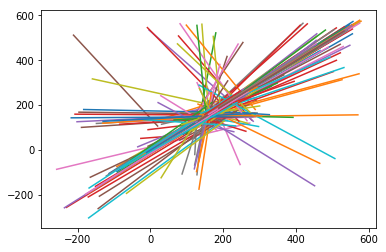

In [6]:
# init 테스트
for obj in objects:
    print('obj id : ', obj.get_id())
    print('obj appear : ', obj.get_appear_frame())
    print('obj disappear : ', obj.get_disappear_frame())

# 데이터 분석
def print_plot(objects):
    for obj in objects:
        plt.plot(obj.get_start_point(), obj.get_finish_point())
    plt.show()
def print_2plots(objects1, objects2):
    fig = plt.figure()
    plot1 = fig.add_subplot(2, 1, 1)
    plot2 = fig.add_subplot(2, 1, 2)
    
    for obj in objects1:
        plot1.plot(obj.get_start_point(), obj.get_finish_point())
    for obj in objects2:
        plot2.plot(obj.get_start_point(), obj.get_finish_point())
    
    plt.show()
    
print_plot(objects)
plt.show()

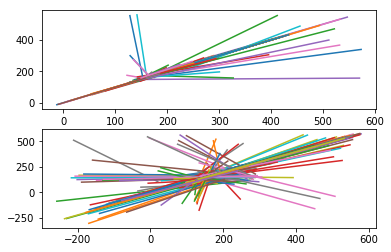

In [7]:
# obj 종류 별 데이터 분석
persons = []
vehicles = []
for obj in objects:
    if obj.get_type() == 'person':
        persons.append(obj)
    else:
        vehicles.append(obj)
        
print_2plots(persons, vehicles)

start point :  [509.885 129.99 ]
finish point :  [497.98 133.31]
start point :  [179.87 133.19]
finish point :  [521.855 131.465]
start point :  [-257.585  273.19 ]
finish point :  [-86.125 119.865]
start point :  [128.07 145.91]
finish point :  [-110.57   168.075]
start point :  [107.685 167.47 ]
finish point :  [106.005 159.44 ]
start point :  [122.605 156.5  ]
finish point :  [106.035 156.915]
start point :  [556.885 127.43 ]
finish point :  [572.495 130.2  ]
start point :  [-31.66  198.185]
finish point :  [-31.675 198.18 ]
start point :  [511.18 136.63]
finish point :  [543.96 132.45]
start point :  [136.445 161.385]
finish point :  [114.865 151.525]
start point :  [-64.63 240.16]
finish point :  [-66.66  252.165]
start point :  [557.615 130.48 ]
finish point :  [559.88  130.405]
start point :  [-80.315 191.985]
finish point :  [-75.63 201.85]
start point :  [134.68 123.  ]
finish point :  [130.885 124.055]
start point :  [297.46  146.525]
finish point :  [104.54  149.105]
start p

start point :  [113.41  163.505]
finish point :  [114.285 154.415]
start point :  [555.32 129.5 ]
finish point :  [517.615 123.645]
start point :  [529.93  127.715]
finish point :  [534.315 126.925]
start point :  [554.07 130.59]
finish point :  [554.645 131.71 ]
start point :  [-196.27  264.27]
finish point :  [168.49  159.315]
start point :  [111.71 152.62]
finish point :  [112.27 152.41]
start point :  [-183.265  286.745]
finish point :  [180.37 164.6 ]
start point :  [123.93  161.245]
finish point :  [124.525 162.135]
start point :  [ 28.67 137.01]
finish point :  [241.755 133.45 ]
start point :  [120.165 165.99 ]
finish point :  [ 50.975 159.255]
start point :  [-57.365 137.375]
finish point :  [-44.85  107.665]
start point :  [515.415 124.76 ]
finish point :  [508.515 125.18 ]
start point :  [144.815 162.95 ]
finish point :  [145.38 163.34]
start point :  [-26.3   68.36]
finish point :  [51.535 63.155]
start point :  [457.48 151.83]
finish point :  [517.765 134.885]
start point :

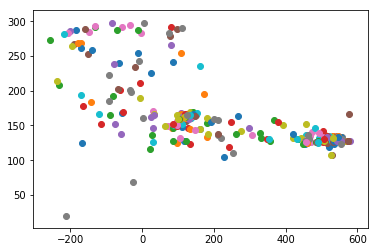

In [8]:
# 도로 근사를 위한 데이터 분석 : 시작 위치에 최대한 근사 시키자
#print(vehicles[0].get_start_point())
#print(vehicles[0].get_start_point()[0])
#print(vehicles[0].get_start_point()[1])

for vehicle in vehicles:
    start_point = vehicle.get_start_point()
    print('start point : ', start_point)
    finish_point = vehicle.get_finish_point()
    print('finish point : ', finish_point)
    
    plt.scatter(vehicle.get_start_point()[0], vehicle.get_start_point()[1])
plt.show()

horizontal small :  (-241.49333333333334, 231.875)
horizontal big :  (576.5799999999999, 141.09833333333333)
vertical small :  (-2.76000000000001, 64.25833333333334)
vertical big :  (-37.53333333333334, 296.03833333333336)


<function matplotlib.pyplot.show(*args, **kw)>

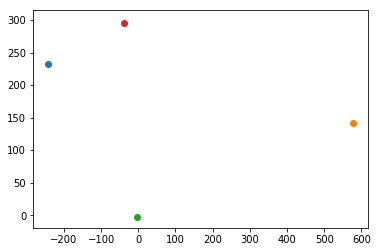

In [9]:
# 도로 근사
x_values = []
y_values = []

for vehicle in vehicles:
    x_values.append(vehicle.get_start_point()[0])
    y_values.append(vehicle.get_start_point()[1])
#print(x_values)
#print(y_values)

x_values.sort()
#print(x_values)
y_values.sort()

point_counts = len(vehicles)
#print(point_counts)

small_x_values = [] # horizontal_small_ys 도출
big_x_values = [] # horizontal_big_points 도출
small_y_values = [] # vertical_small_points 도출
big_y_values = [] # vertical_big_points 도출

for i in range(3):
    small_x_values.append(x_values[i])
    big_x_values.append(x_values[(point_counts - 1) - i])
    small_y_values.append(y_values[i])
    big_y_values.append(y_values[(point_counts - 1) - i])
#print(small_x_values)
#print(big_x_values)
#print(small_y_values)
#print(big_y_values)

horizontal_small_ys = []
horizontal_big_ys = []
vertical_small_xs = []
vertical_big_xs = []
for vehicle in vehicles:
    if vehicle.get_start_point()[0] in small_x_values:
        horizontal_small_ys.append(vehicle.get_start_point()[1])
    if vehicle.get_start_point()[0] in big_x_values:
        horizontal_big_ys.append(vehicle.get_start_point()[1])
    if vehicle.get_start_point()[1] in small_y_values:
        vertical_small_xs.append(vehicle.get_start_point()[0])
    if vehicle.get_start_point()[1] in big_y_values:
        vertical_big_xs.append(vehicle.get_start_point()[0])
#print(horizontal_small_ys)
#print(horizontal_big_ys)
#print(vertical_small_xs)
#print(vertical_big_xs)

small_x_values = np.array(small_x_values)
big_x_values = np.array(big_x_values)
small_y_values = np.array(small_y_values)
big_y_values = np.array(big_y_values)

horizontal_small_ys = np.array(horizontal_small_ys)
horizontal_big_ys = np.array(horizontal_big_ys)
vertical_small_xs = np.array(vertical_small_xs)
vertical_big_xs = np.array(vertical_big_xs)

horizontal_small_point = (np.mean(small_x_values), np.mean(horizontal_small_ys))
horizontal_big_point = (np.mean(big_x_values), np.mean(horizontal_big_ys))
vertical_small_point = (np.mean(vertical_small_xs), np.mean(small_y_values))
vertical_big_point = (np.mean(vertical_big_xs), np.mean(big_y_values))
print("horizontal small : ", horizontal_small_point)
print("horizontal big : ", horizontal_big_point)
print("vertical small : ", vertical_small_point)
print("vertical big : ", vertical_big_point)

# plt
plt.scatter(horizontal_small_point[0], horizontal_small_point[1])
plt.scatter(horizontal_big_point[0], horizontal_big_point[1])
plt.scatter(vertical_small_point[0], vertical_small_point[0])
plt.scatter(vertical_big_point[0], vertical_big_point[1])
plt.show

(-24.291179447877177, 215.54678904237588)


<function matplotlib.pyplot.show(*args, **kw)>

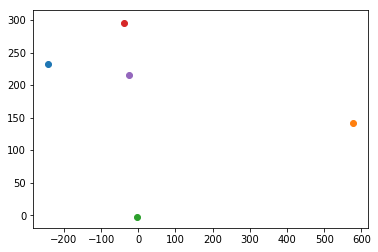

In [10]:
# 두 직선의 교차점, 교차로의 중심 구하기
def meet_point(point1, point2, point3, point4):
    # 수평직선 : point1, 2
    # 수직직선 : point3, 4
    x_value = ((point1[0]*point2[1] - point1[1]*point2[0])*(point3[0] - point4[0]) - (point1[0] - point2[0])*(point3[0]*point4[1] - point3[1]*point4[0])) / ((point1[0] - point2[0])*(point3[1] - point4[1]) - (point1[1] - point2[1])*(point3[0] - point4[0]))
    y_value = ((point1[0]*point2[1] - point1[1]*point2[0])*(point3[1] - point4[1]) - (point1[0] - point2[0])*(point3[0]*point4[1] - point3[1]*point4[0])) / ((point1[0] - point2[0])*(point3[1] - point4[1]) - (point1[1] - point2[1])*(point3[0] - point4[0]))
    return (x_value, y_value)

road_center = meet_point(horizontal_small_point, horizontal_big_point, vertical_small_point, vertical_big_point)
print(road_center)

# plt
plt.scatter(horizontal_small_point[0], horizontal_small_point[1])
plt.scatter(horizontal_big_point[0], horizontal_big_point[1])
plt.scatter(vertical_small_point[0], vertical_small_point[0])
plt.scatter(vertical_big_point[0], vertical_big_point[1])
plt.scatter(road_center[0], road_center[1])
plt.show

In [11]:
# vehicle 정규화
horizontal_small_point = np.array(horizontal_small_point)
horizontal_big_point = np.array(horizontal_big_point)
vertical_small_point = np.array(vertical_small_point)
vertical_big_point = np.array(vertical_big_point)

# 1. vehicle의 start_point와 가장 도로 위치 계산
# 2. vehicle의 finish_point와 가장 도로 위치 계산
def distance_2_points(point1, point2):
    x_diff = point1[0] - point2[0]
    y_diff = point1[1] - point2[1]
    return math.sqrt(math.pow(x_diff, 2) + math.pow(y_diff, 2))

# cars construct and init
cars = []
for vehicle in vehicles:
    start_distance_list = []
    finish_distance_list = []
    
    appear_frame = vehicle.get_appear_frame()
    disappear_frame = vehicle.get_disappear_frame()
    
    start_point = vehicle.get_start_point()
    finish_point = vehicle.get_finish_point()
    
    start_distance_list.append(distance_2_points(start_point, vertical_small_point))
    start_distance_list.append(distance_2_points(start_point, horizontal_small_point))
    start_distance_list.append(distance_2_points(start_point, vertical_big_point))
    start_distance_list.append(distance_2_points(start_point, horizontal_big_point))

    finish_distance_list.append(distance_2_points(finish_point, vertical_small_point))
    finish_distance_list.append(distance_2_points(finish_point, horizontal_small_point))
    finish_distance_list.append(distance_2_points(finish_point, vertical_big_point))
    finish_distance_list.append(distance_2_points(finish_point, horizontal_big_point))

    
    # (시작도로, 도착도로)
    start_min_idx = start_distance_list.index(min(start_distance_list))
    finish_min_idx = finish_distance_list.index(min(finish_distance_list))
    
    start_road = start_min_idx
    finish_road = finish_min_idx
    print('start road : ', start_road, ' finish road : ', finish_road)
    
    straight_roads = [np.array((0, 2)), np.array((2, 0)), np.array((1, 3)), np.array((3, 1))]
    velocity1 = 0.0
    velocity2 = 0.0
    
    if start_road == finish_road: # 신호에 영향을 주지 실질적 영향을 주지 못함
        print('continue condition')
        continue
    
    for road in straight_roads:
        if np.array_equal(np.array((start_road, finish_road)), road): # 직진 진행
            velocity = distance_2_points(finish_point, start_point) / (disappear_frame - appear_frame + 0.001) # 분모가 0이 됨을 방지
            velocity1 = velocity
            break
    
        else: # 회전 진행
            corner_distance_list = []
            frame_list = vehicle.get_frame_list()
            corner_frame = -1
            point_list = vehicle.get_point_list()
            corner_point = np.array((-1, -1))
        
            for p in point_list:
                corner_distance_list.append(distance_2_points(road_center, p))
        
            corner_point_idx = corner_distance_list.index(min(corner_distance_list))
            corner_frame = frame_list[corner_point_idx]
            corner_point = point_list[corner_point_idx]
            print('corner frame : ', corner_frame,' corenr point : ', corner_point)
                
            velocity1 = distance_2_points(corner_point, start_point) / (corner_frame - appear_frame + 0.001)
            velocity2 = distance_2_points(corner_point, start_point) / (disappear_frame - corner_frame + 0.001)
            break
            
    print('vel1 : ', velocity1, 'vel2 : ', velocity2)
    
    # car 객체 생성
    new_car = Car.Car()
    new_car.set_car(appear_frame, start_road, finish_road, velocity1, velocity2)
    
    cars.append(new_car)

print(len(cars), " cars : ")
for i in range(len(cars)):
    print(i, "th car")
    cars[i].print_car()

# cars_data.csv 저장
appear_frame_col = []
start_road_col = []
finish_road_col = []
velocity1_col = []
velocity2_col = []
for car in cars:
    appear_frame_col.append(car.get_appear_frame())
    start_road_col.append(car.get_start_road())
    finish_road_col.append(car.get_finish_road())
    velocity1_col.append(car.get_velocity1())
    velocity2_col.append(car.get_velocity2())
    
cars_df = pd.DataFrame(data = {
    'appear_frame' : appear_frame_col,
    'start_road' : start_road_col,
    'finish_road' : finish_road_col,
    'velocity1' : velocity1_col,
    'velocity2' : velocity2_col,
})
print(cars_df)
cars_df.to_csv('./cars_data.csv', header = True, index = False)

start road :  3  finish road :  3
continue condition
start road :  0  finish road :  3
corner frame :  3.0  corenr point :  [179.87 133.19]
vel1 :  0.0 vel2 :  0.0
start road :  1  finish road :  0
corner frame :  2504.0  corenr point :  [-84.94 123.26]
vel1 :  5.862921283520026 vel2 :  228.4313616169476
start road :  0  finish road :  1
corner frame :  71.0  corenr point :  [-10.655 139.675]
vel1 :  2.0421029905120704 vel2 :  4.628680559241736
start road :  0  finish road :  0
continue condition
start road :  0  finish road :  0
continue condition
start road :  3  finish road :  3
continue condition
start road :  2  finish road :  2
continue condition
start road :  3  finish road :  3
continue condition
start road :  0  finish road :  0
continue condition
start road :  2  finish road :  2
continue condition
start road :  3  finish road :  3
continue condition
start road :  2  finish road :  2
continue condition
start road :  0  finish road :  0
continue condition
start road :  3  fini

velocity2 :  1.279468968450511
latency :  0.0
49 th car
appear frame :  1706.0
start road :  3
finish road :  0
velocity1 :  1.0406824201871272
velocity2 :  78.01269550749089
latency :  0.0
50 th car
appear frame :  1163.0
start road :  0
finish road :  2
velocity1 :  0.3903654972419468
velocity2 :  0.0
latency :  0.0
51 th car
appear frame :  1586.0
start road :  2
finish road :  0
velocity1 :  14.080975781819431
velocity2 :  0.4404567594013078
latency :  0.0
52 th car
appear frame :  389.0
start road :  2
finish road :  0
velocity1 :  4.004776442467335
velocity2 :  0.7328028042541856
latency :  0.0
53 th car
appear frame :  292.0
start road :  2
finish road :  1
velocity1 :  4.7089414486418315
velocity2 :  0.21424709740877565
latency :  0.0
    appear_frame  start_road  finish_road  velocity1      velocity2
0            3.0           0            3   0.000000       0.000000
1         2465.0           1            0   5.862921     228.431362
2            3.0           0            1  